In [1]:
!pip install transformers torch accelerate
!pip install huggingface_hub
!pip install openpyxl
!pip install xformers
!pip install scikit-learn
!pip install matplotlib
!pip install seaborn
!pip uninstall torch torchvision -y
!pip install torch torchvision

  Using cached torch-2.5.0-cp310-cp310-manylinux1_x86_64.whl (906.4 MB)
  Attempting uninstall: torch
    Found existing installation: torch 2.5.1
    Uninstalling torch-2.5.1:
      Successfully uninstalled torch-2.5.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchvision 0.20.1 requires torch==2.5.1, but you have torch 2.5.0 which is incompatible.
torchaudio 2.3.1+cu121 requires torch==2.3.1, but you have torch 2.5.0 which is incompatible.
optimum 1.21.2 requires transformers[sentencepiece]<4.43.0,>=4.26.0, but you have transformers 4.45.1 which is incompatible.
autotrain-advanced 0.7.126 requires accelerate==0.31.0, but you have accelerate 0.34.2 which is incompatible.
autotrain-advanced 0.7.126 requires huggingface-hub==0.23.1, but you have huggingface-hub 0.25.1 which is incompatible.
autotrain-advanced 0.7.126 requires protobuf==4.23.4, but you have

In [2]:
from huggingface_hub import HfApi, HfFolder

# Your Hugging Face API token
token = '<Your Hugging Face Token>'

# Save the token to Hugging Face folder (usually this is `~/.huggingface`)
HfFolder.save_token(token)

# Optionally, check if the token works by listing your models (or any other API call)
api = HfApi()
try:
    user_models = api.list_models(use_auth_token=token)
    print("Login successful, retrieved user models:", user_models)
except Exception as e:
    print("Failed to authenticate:", e)


Login successful, retrieved user models: <generator object HfApi.list_models at 0x7f3d3c5dece0>


/home/bhavani/GA Work/Fine_Tuning_and_ChatBot_Creation/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
!huggingface-cli whoami

Bhavani11


In [4]:
import json

test_data_path = '../Datasets/opp115/test.json'
model_path="meta-llama/Llama-2-7b-chat-hf"

# Load the test data file and count the number of entries
with open(test_data_path, 'r') as file:
    test_data = json.load(file)
    num_entries = len(test_data) 



In [5]:
from transformers import AutoTokenizer

# Load the tokenizer
tokenizer = AutoTokenizer.from_pretrained("meta-llama/Llama-2-7b-chat-hf")

# Tokenize "Other"
tokens = tokenizer.tokenize("Third Party Sharing/Collection")
print("Tokens:", tokens)
print("Number of tokens:", len(tokens))


Tokens: ['▁Third', '▁Party', '▁Sh', 'aring', '/', 'Collection']
Number of tokens: 6


2024-12-28 10:05:37.002578: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/home/bhavani/GA Work/Fine_Tuning_and_ChatBot_Creation/lib/python3.10/site-packages/transformers/models/auto/tokenization_auto.py:796: FutureWarning: The `use_auth_token` argument is deprecated and will be removed in v5 of Transformers. Please use `token` instead.
  warnings.warn(
Loading checkpoint shards: 100%|██████████| 2/2 [00:08<00:00,  4.30s/it]
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providi

Generated new tokens:First Party Collection/Use

Explanation: This privacy policy is owned and operated by Buffalo Wild Wings, Inc. and its affiliated entities, and therefore falls under the category of First Party Collection/Use.
['▁First', '▁Party', '▁Collection', '/', 'Use', '<0x0A>', '<0x0A>', 'Ex', 'plan', 'ation', ':', '▁This', '▁priv', 'acy', '▁policy', '▁is', '▁owned', '▁and', '▁operated', '▁by', '▁Buff', 'alo', '▁Wild', '▁W', 'ings', ',', '▁Inc', '.', '▁and', '▁its', '▁affili', 'ated', '▁entities', ',', '▁and', '▁therefore', '▁falls', '▁under', '▁the', '▁category', '▁of', '▁First', '▁Party', '▁Collection', '/', 'Use', '.']
Elapsed Time: 7.372446537017822
New tokens generated: 47
Tokens generated per second: 6.38 tokens/s
Predicted categories:['First Party Collection/Use']
Privacy Policy Text: PRIVACY POLICY    Buffalo Wild Wings, Inc., its franchisees, marketing agencies, and affiliated contractors, as specifically identified here (collectively "BWW," "we" or "us"), appreciate

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


Generated new tokens:Third Party Sharing/Collection
['▁Third', '▁Party', '▁Sh', 'aring', '/', 'Collection']
Elapsed Time: 0.9294538497924805
New tokens generated: 6
Tokens generated per second: 6.46 tokens/s
Predicted categories:['Third Party Sharing/Collection']
Privacy Policy Text: We may also disclose your personal information to third parties if we believe disclosure is appropriate to comply with law, regulation, legal process or government request; enforce the terms of any of our policies; or protect the rights, property or safety of BWW, our associates, or our customers. This may include assistance in fraud protection and investigation. In addition, we may share or transfer your information in connection with a substantial corporate transaction, such as a merger, consolidation, asset sale, or in the unlikely event of bankruptcy.
Actual Category: ['Third Party Sharing/Collection']
Predicted Categories: ['Third Party Sharing/Collection']

Generated new tokens:Third Party Sharing/Co

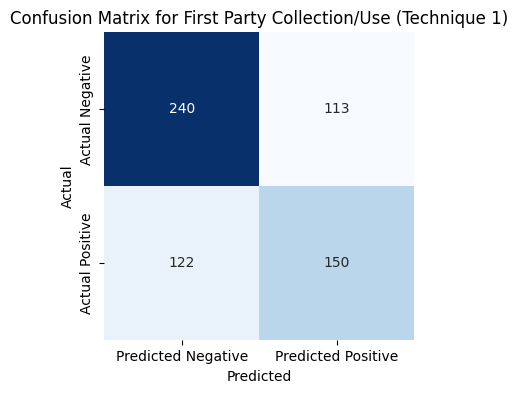


Plotting confusion matrix for category: Third Party Sharing/Collection


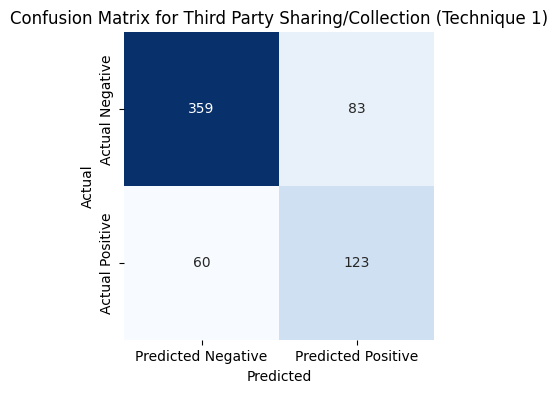


Plotting confusion matrix for category: Other


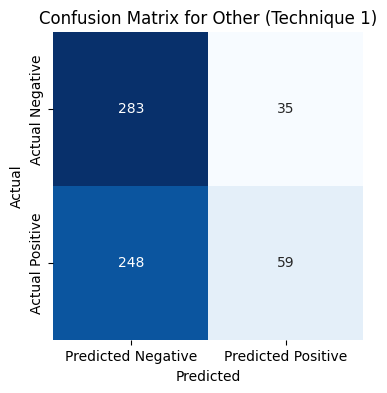


Plotting confusion matrix for category: User Choice/Control


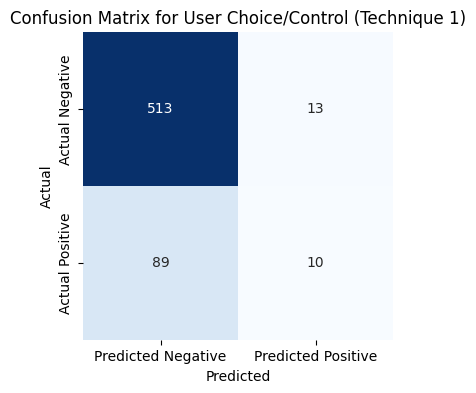


Plotting confusion matrix for category: Do Not Track


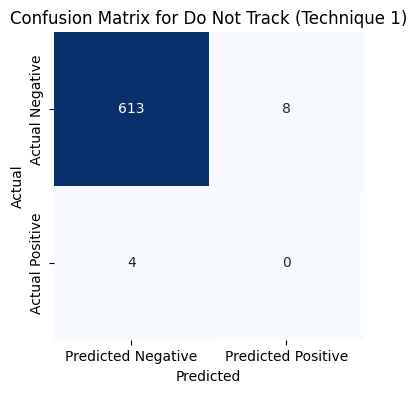


Plotting confusion matrix for category: International and Specific Audiences


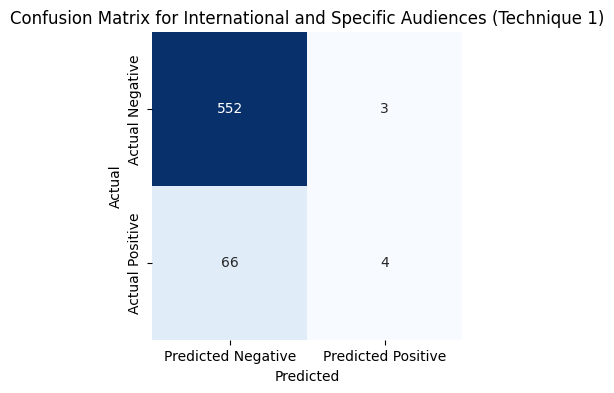


Plotting confusion matrix for category: Data Security


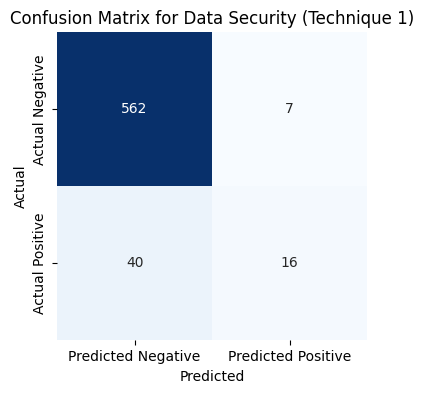


Plotting confusion matrix for category: Policy Change


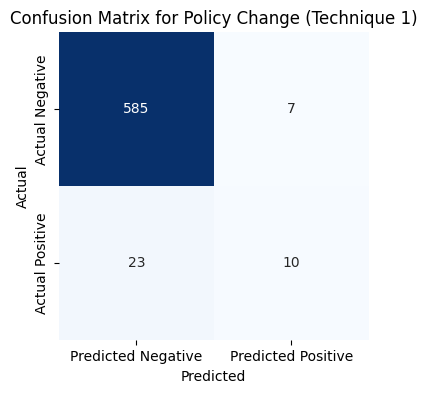


Plotting confusion matrix for category: Data Retention


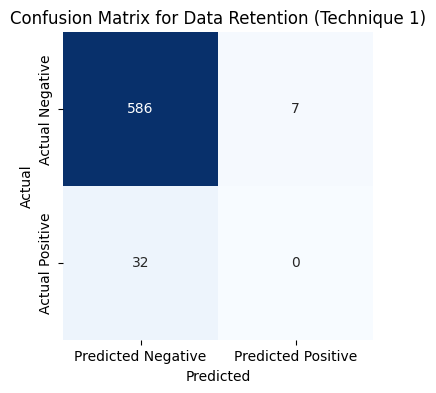


Plotting confusion matrix for category: User Access, Edit and Deletion


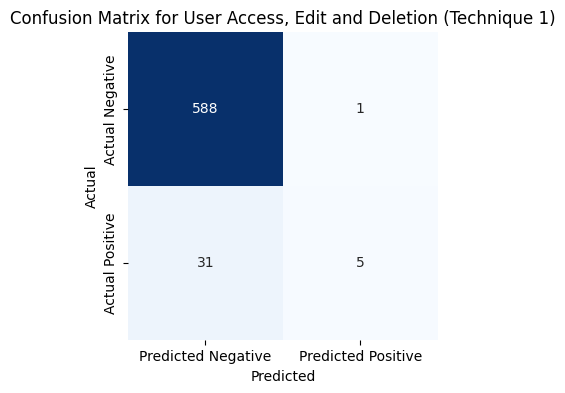


Overall tp: 377
Overall tn: 4881
Overall fp: 277
Overall fn: 715
Overall Precision (Technique 1): 0.5764525993883792
Overall Recall (Technique 1): 0.34523809523809523
Overall F1 Score (Technique 1): 0.43184421534937
Overall Accuracy (Technique 1): 0.84128
TP 150
TN 240
FP 113
FN 122

TP 123
TN 359
FP 83
FN 60

TP 59
TN 283
FP 35
FN 248

TP 10
TN 513
FP 13
FN 89

TP 0
TN 613
FP 8
FN 4

TP 4
TN 552
FP 3
FN 66

TP 16
TN 562
FP 7
FN 40

TP 10
TN 585
FP 7
FN 23

TP 0
TN 586
FP 7
FN 32

TP 5
TN 588
FP 1
FN 31

Micro Precision: 0.5764525993883792
Micro Recall: 0.34523809523809523
Micro F1 Score: 0.43184421534937
Micro Accuracy: 0.84128
Macro Precision: 0.4918521139920303
Macro Recall: 0.23015705819861662
Macro F1 Score: 0.2798391807564897
Weighted Precision: 0.5755524946948309
Weighted Recall: 0.34523809523809523
Weighted F1 Score: 0.39061101774458956
Sample Average Precision: 0.585824126984127
Sample Average Recall: 0.40025777777777777
Sample Average F1 Score: 0.4479814141414141

Overall Me

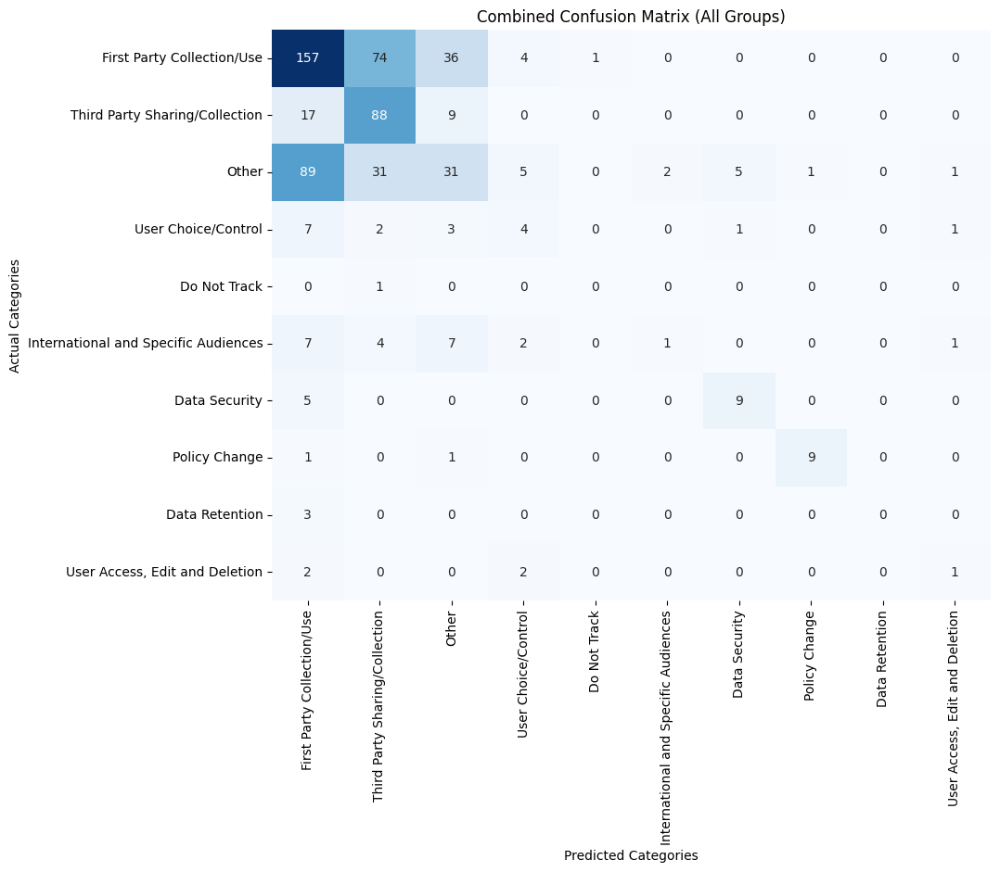


Metrics for Group 1:
Accuracy: 0.9061224489795918
Precision: 0.5306122448979592
Recall: 0.5306122448979592
F1 Score: 0.5306122448979592

Metrics for Group 2:
Accuracy: 0.9003021148036254
Precision: 0.8721264367816092
Recall: 0.7158018867924528
F1 Score: 0.7862694300518135

Confusion Matrices for Group 1:


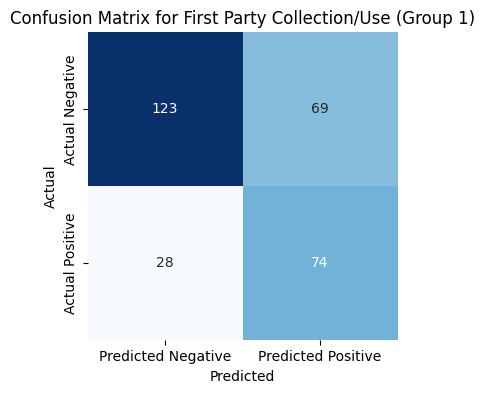

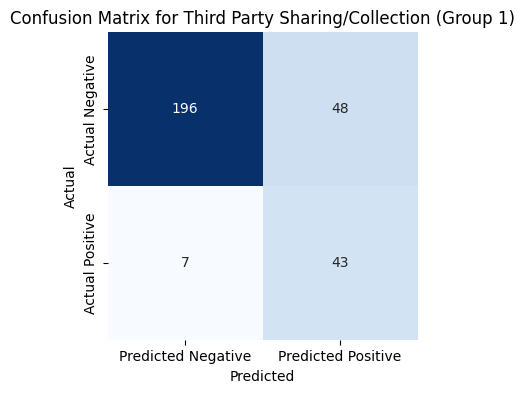

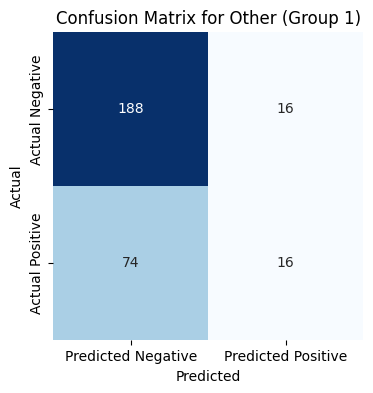

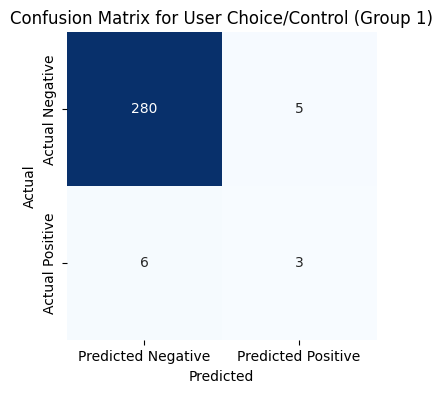

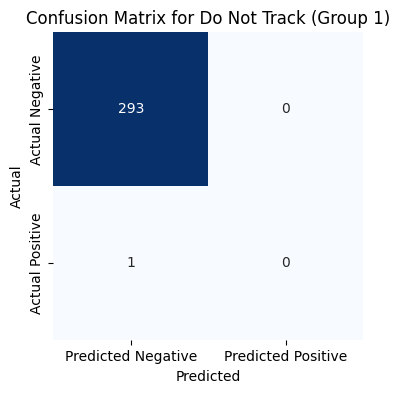

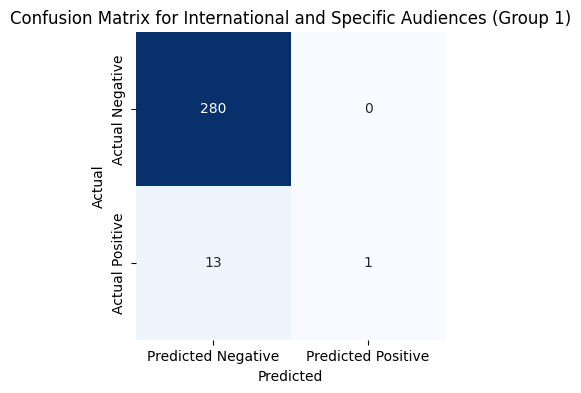

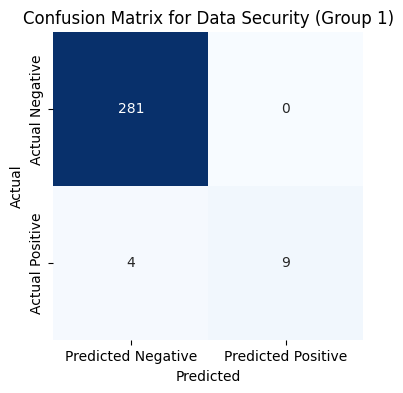

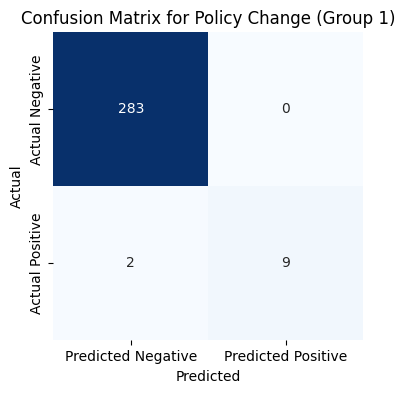

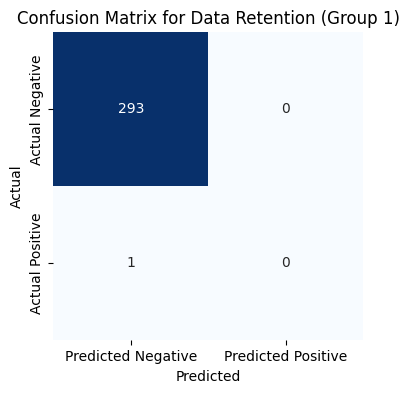

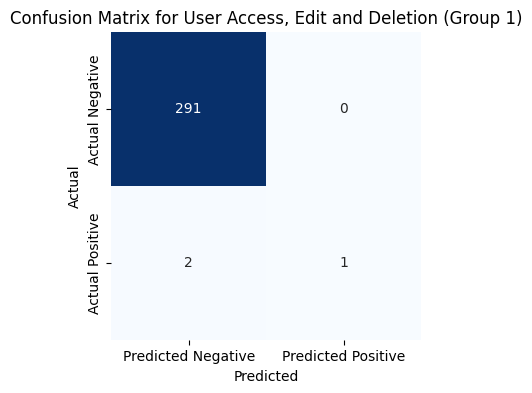


Confusion Matrices for Group 2:


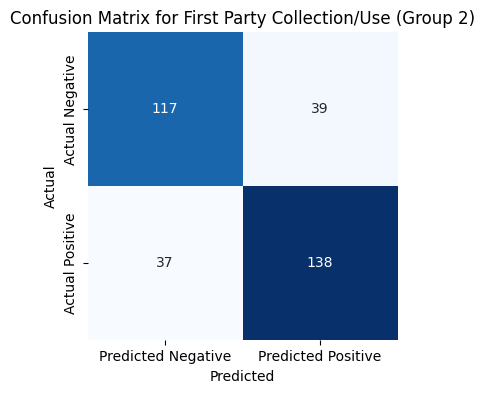

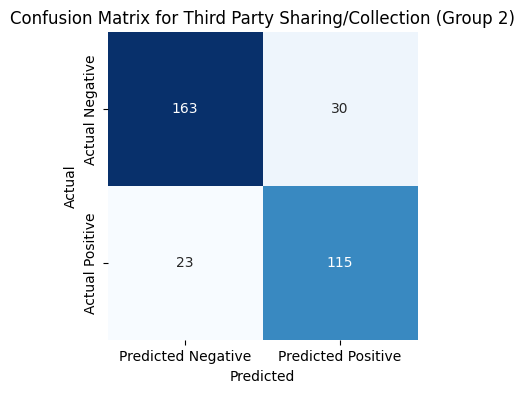

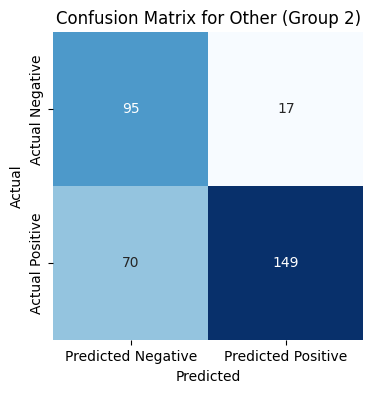

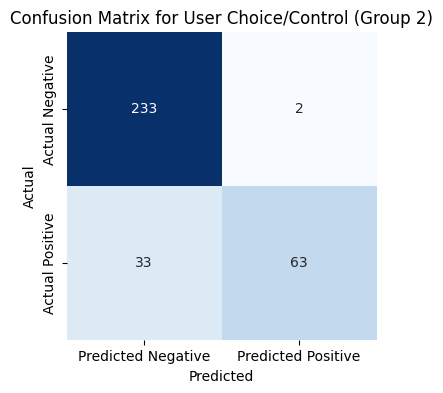

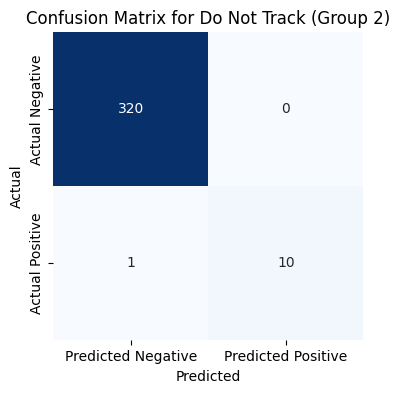

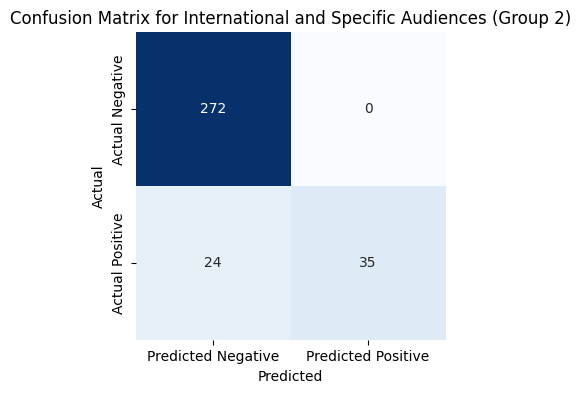

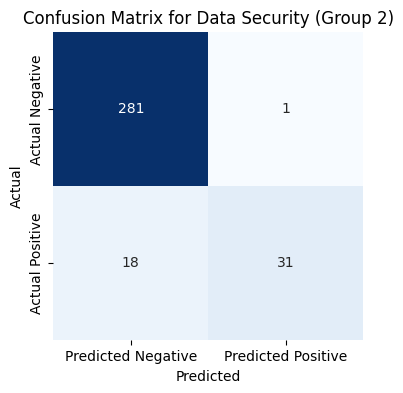

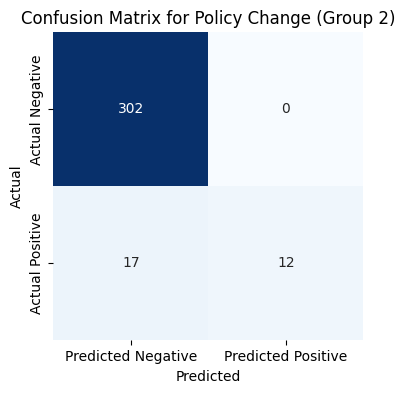

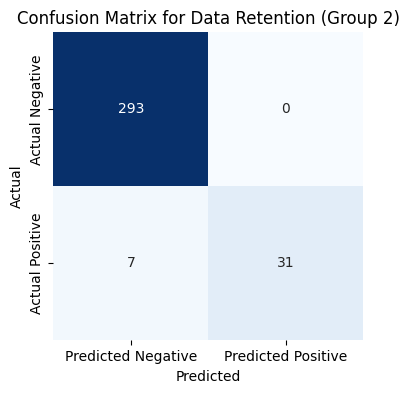

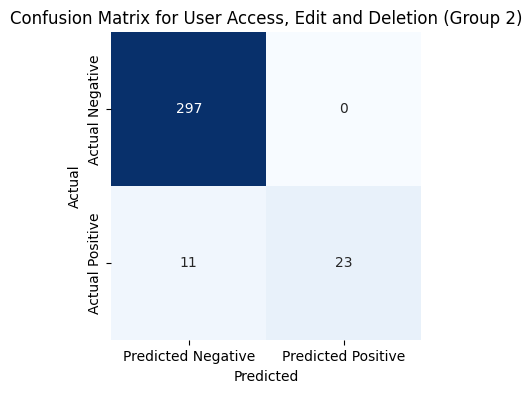


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.90304
Overall Precision: 0.7707070707070707
Overall Recall: 0.6681260945709282
Overall F1 Score: 0.7157598499061913
Combined Metrics -> Accuracy: 0.90304, Precision: 0.7707070707070707, Recall: 0.6681260945709282, F1: 0.7157598499061913

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


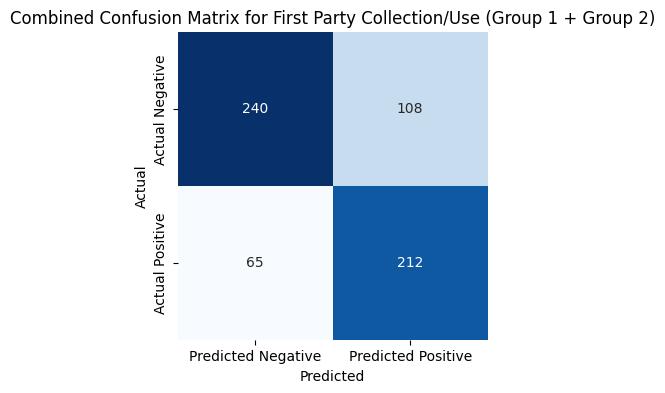


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 212, FP: 108, FN: 65, TN: 240


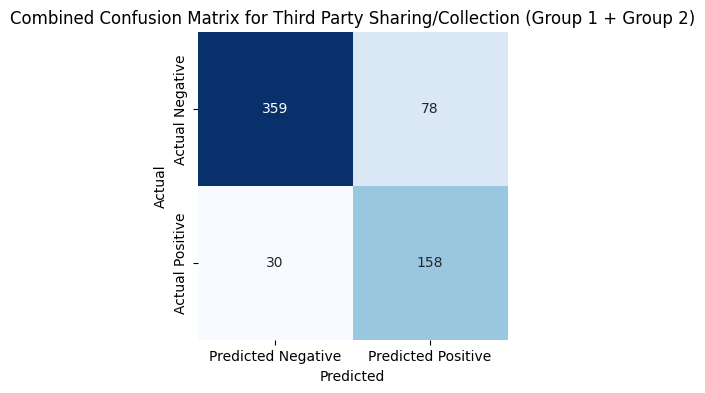


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 158, FP: 78, FN: 30, TN: 359


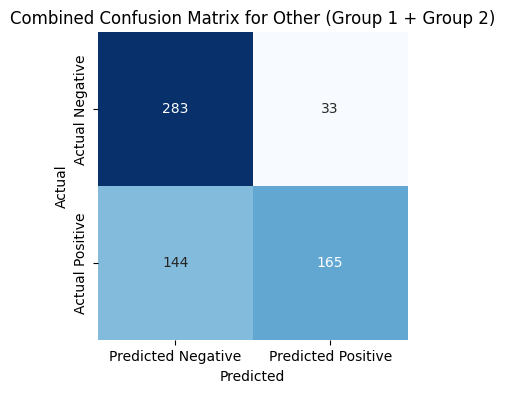


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 165, FP: 33, FN: 144, TN: 283


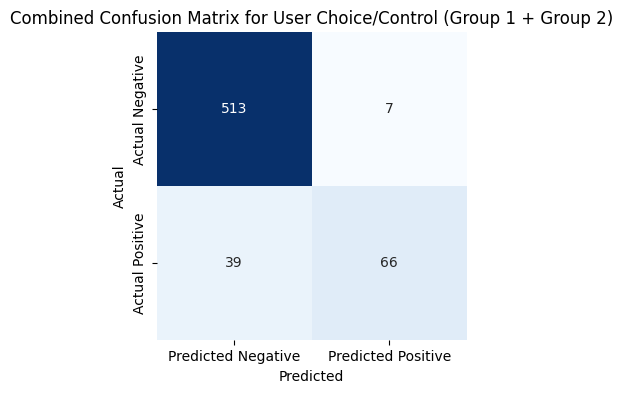


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 66, FP: 7, FN: 39, TN: 513


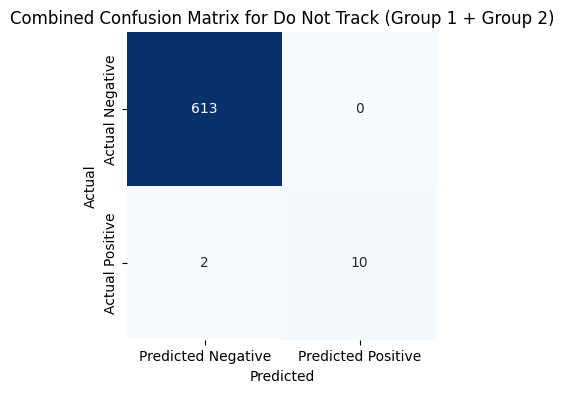


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 10, FP: 0, FN: 2, TN: 613


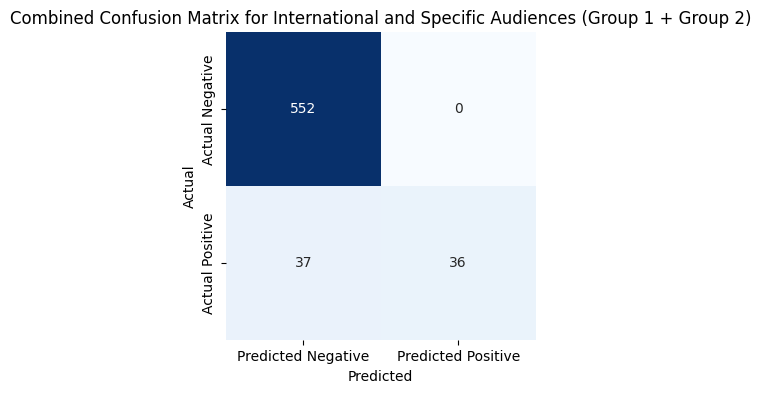


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 36, FP: 0, FN: 37, TN: 552


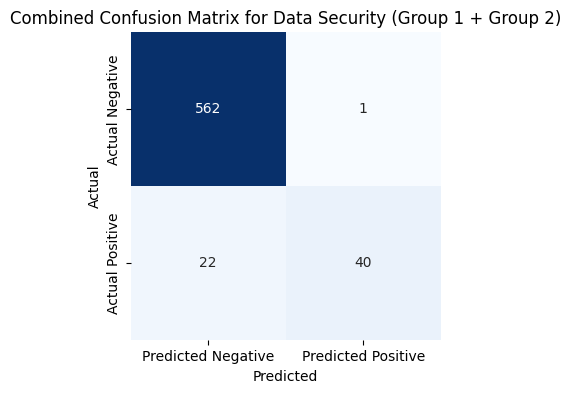


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 40, FP: 1, FN: 22, TN: 562


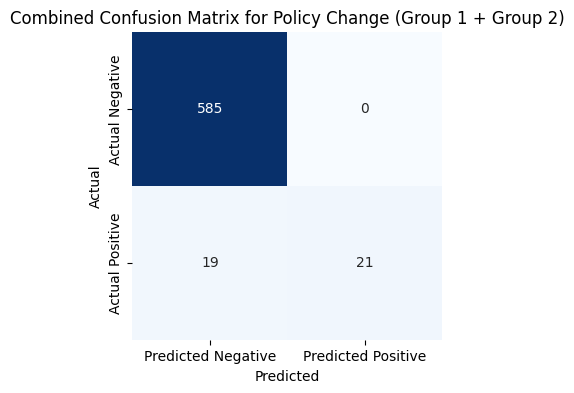


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 21, FP: 0, FN: 19, TN: 585


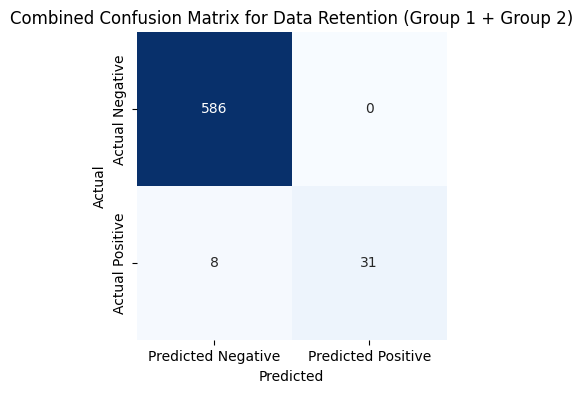


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 31, FP: 0, FN: 8, TN: 586


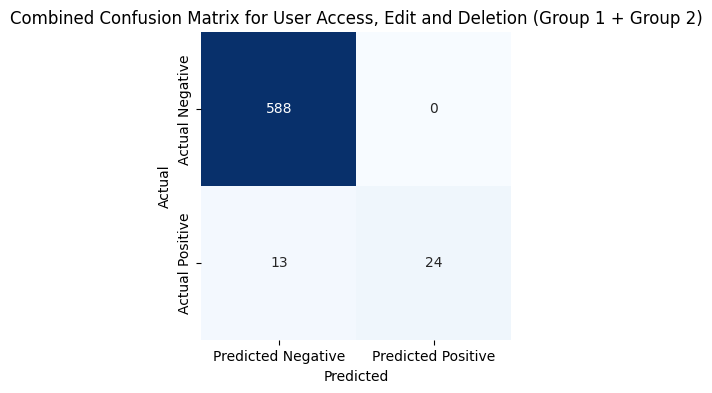


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 24, FP: 0, FN: 13, TN: 588
New tokens list: [47, 5, 90, 66, 5, 6, 79, 83, 47, 6, 83, 68, 66, 38, 82, 63, 37, 59, 123, 45, 60, 71, 66, 89, 53, 90, 69, 106, 59, 70, 67, 5, 5, 6, 115, 85, 5, 87, 57, 6, 5, 6, 6, 60, 130, 5, 84, 82, 50, 6, 52, 6, 6, 90, 95, 42, 8, 73, 68, 69, 58, 112, 5, 116, 5, 74, 58, 113, 90, 2, 49, 55, 69, 6, 5, 5, 68, 30, 103, 88, 42, 117, 84, 6, 6, 88, 60, 56, 51, 76, 97, 6, 122, 58, 58, 94, 55, 83, 53, 75, 80, 6, 78, 6, 89, 42, 69, 5, 78, 6, 74, 5, 5, 58, 93, 6, 76, 56, 5, 89, 6, 77, 77, 84, 6, 54, 6, 84, 43, 74, 60, 59, 81, 90, 49, 59, 63, 8, 67, 52, 62, 53, 93, 38, 72, 2, 63, 74, 43, 55, 68, 66, 80, 87, 46, 6, 130, 6, 78, 54, 6, 107, 64, 69, 5, 114, 6, 56, 110, 83, 60, 82, 59, 90, 55, 70, 42, 61, 26, 39, 73, 112, 34, 67, 79, 88, 79, 70, 5, 91, 6, 78, 75, 45, 65, 100, 5, 6, 57, 69, 71, 6, 94, 33, 6, 27, 105, 86, 52, 65, 137, 68, 81, 64, 73, 88, 6, 358, 46, 77, 69, 65, 76, 41, 93, 66

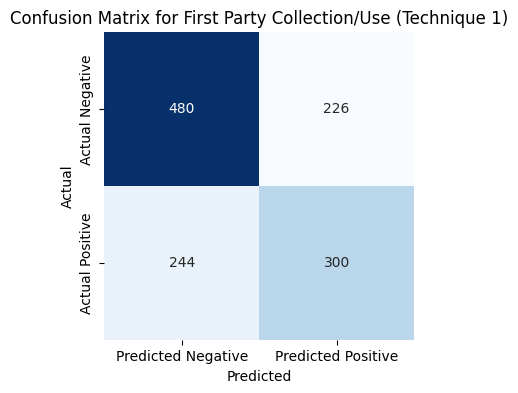


Plotting confusion matrix for category: Third Party Sharing/Collection


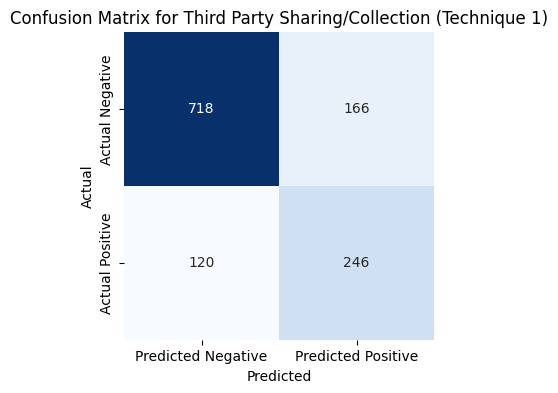


Plotting confusion matrix for category: Other


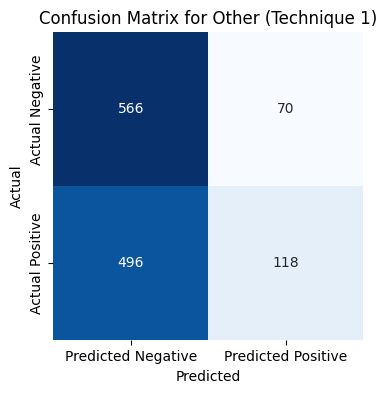


Plotting confusion matrix for category: User Choice/Control


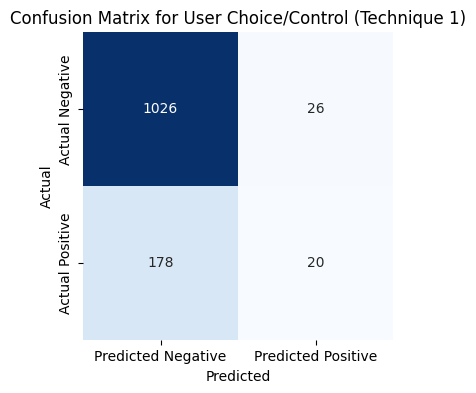


Plotting confusion matrix for category: Do Not Track


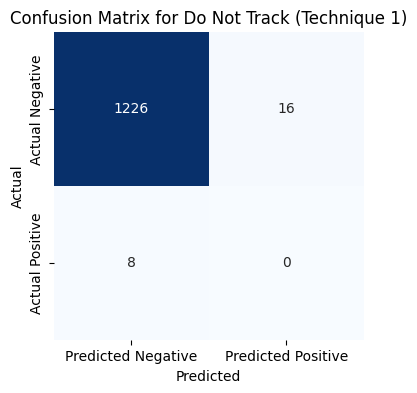


Plotting confusion matrix for category: International and Specific Audiences


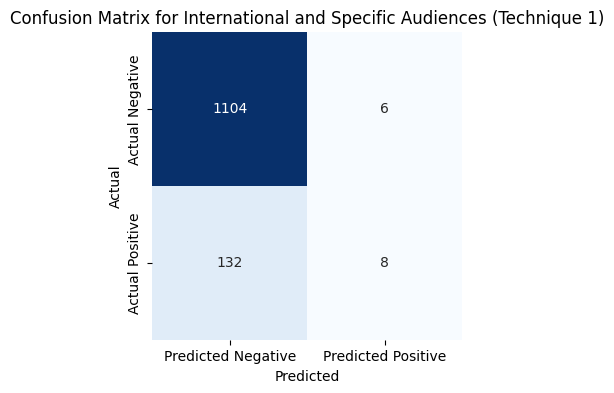


Plotting confusion matrix for category: Data Security


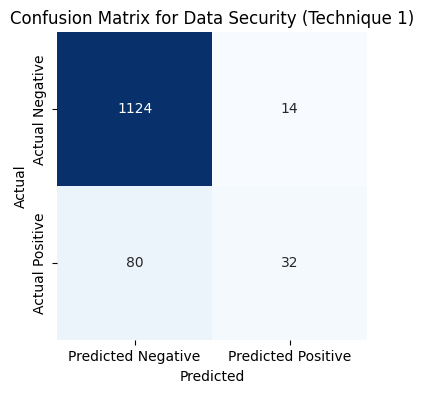


Plotting confusion matrix for category: Policy Change


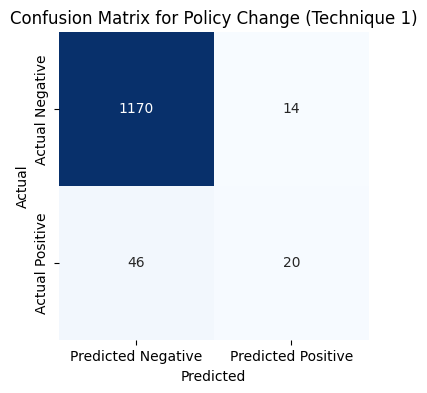


Plotting confusion matrix for category: Data Retention


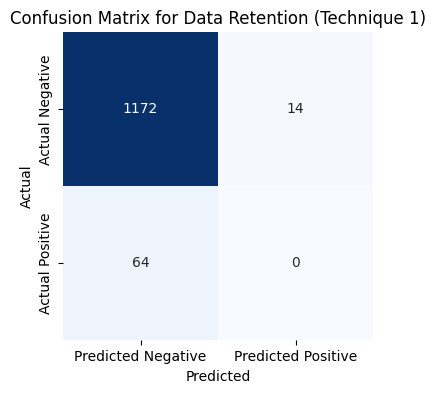


Plotting confusion matrix for category: User Access, Edit and Deletion


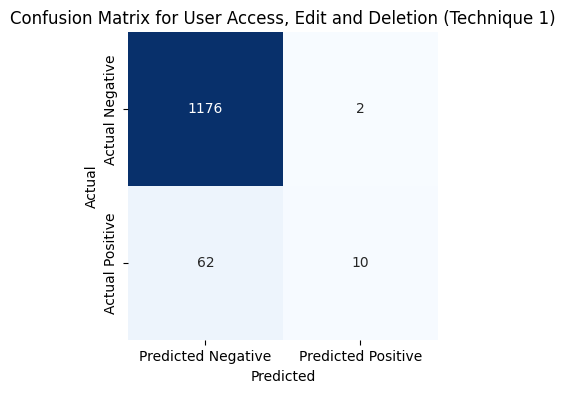


Overall tp: 754
Overall tn: 9762
Overall fp: 554
Overall fn: 1430
Overall Precision (Technique 1): 0.5764525993883792
Overall Recall (Technique 1): 0.34523809523809523
Overall F1 Score (Technique 1): 0.43184421534937
Overall Accuracy (Technique 1): 0.84128
TP 300
TN 480
FP 226
FN 244

TP 246
TN 718
FP 166
FN 120

TP 118
TN 566
FP 70
FN 496

TP 20
TN 1026
FP 26
FN 178

TP 0
TN 1226
FP 16
FN 8

TP 8
TN 1104
FP 6
FN 132

TP 32
TN 1124
FP 14
FN 80

TP 20
TN 1170
FP 14
FN 46

TP 0
TN 1172
FP 14
FN 64

TP 10
TN 1176
FP 2
FN 62

Micro Precision: 0.5764525993883792
Micro Recall: 0.34523809523809523
Micro F1 Score: 0.43184421534937
Micro Accuracy: 0.84128
Macro Precision: 0.4918521139920303
Macro Recall: 0.23015705819861662
Macro F1 Score: 0.2798391807564897
Weighted Precision: 0.5755524946948309
Weighted Recall: 0.34523809523809523
Weighted F1 Score: 0.39061101774458956
Sample Average Precision: 0.585824126984127
Sample Average Recall: 0.40025777777777777
Sample Average F1 Score: 0.4479814141

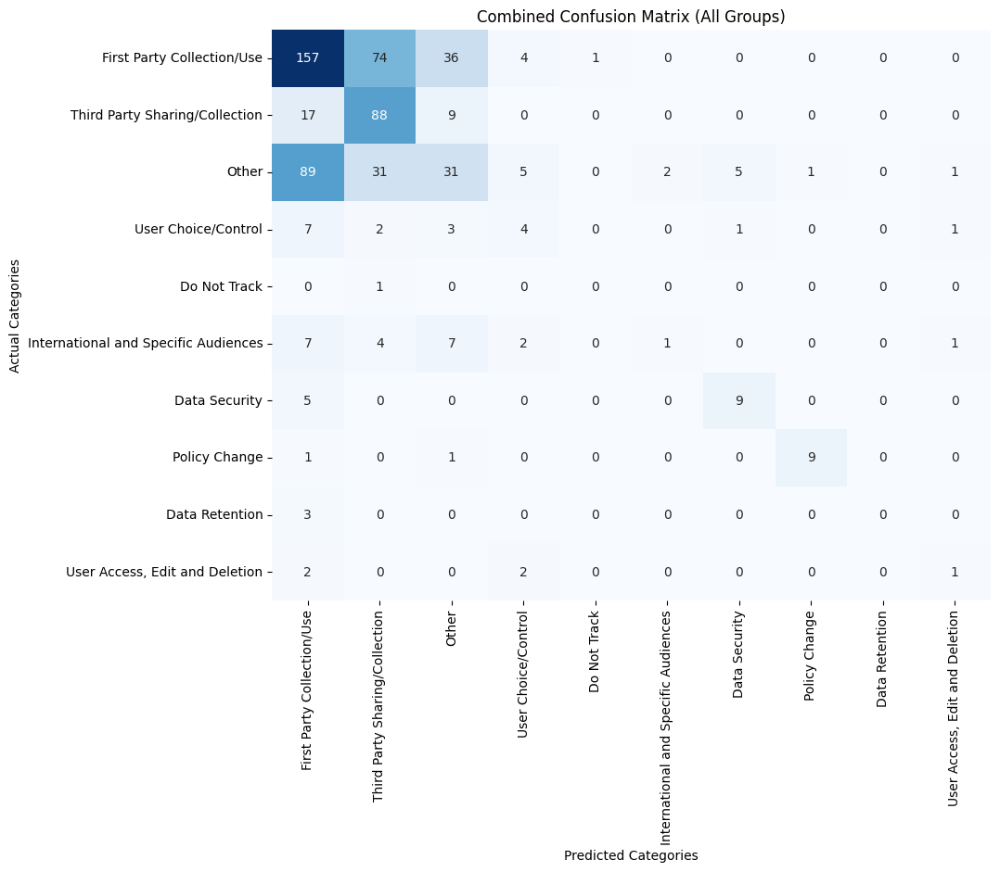


Metrics for Group 1:
Accuracy: 0.9061224489795918
Precision: 0.5306122448979592
Recall: 0.5306122448979592
F1 Score: 0.5306122448979592

Metrics for Group 2:
Accuracy: 0.9003021148036254
Precision: 0.8721264367816092
Recall: 0.7158018867924528
F1 Score: 0.7862694300518135

Confusion Matrices for Group 1:


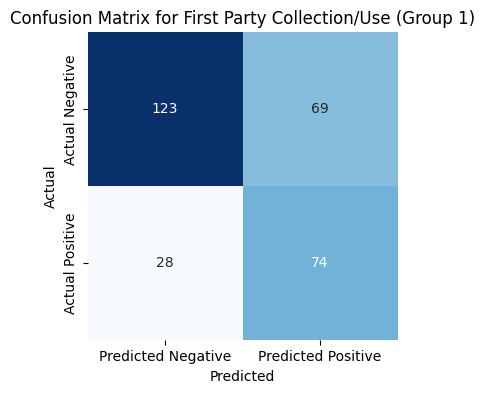

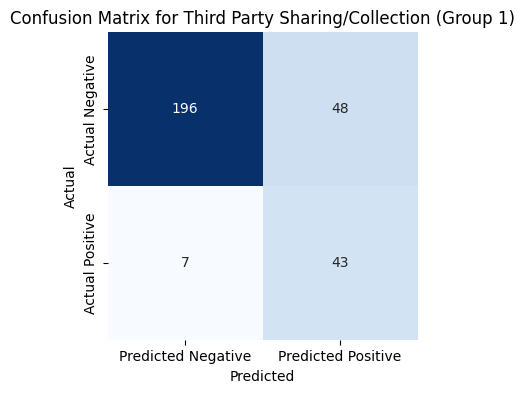

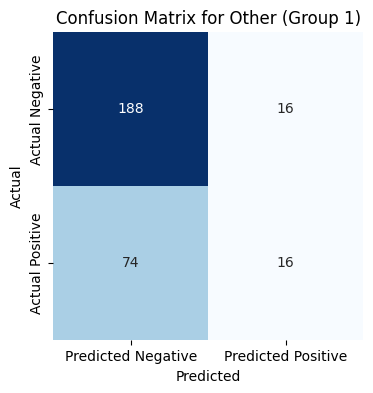

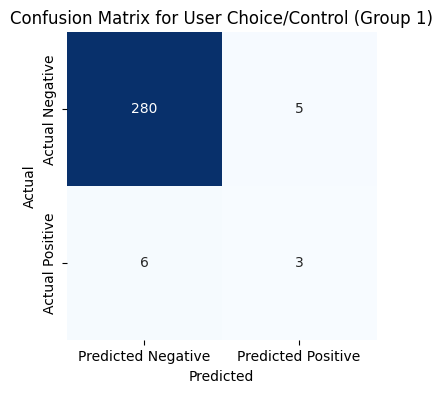

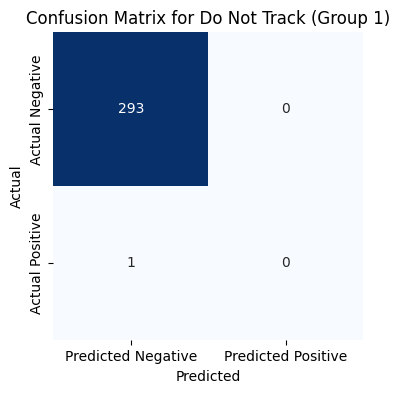

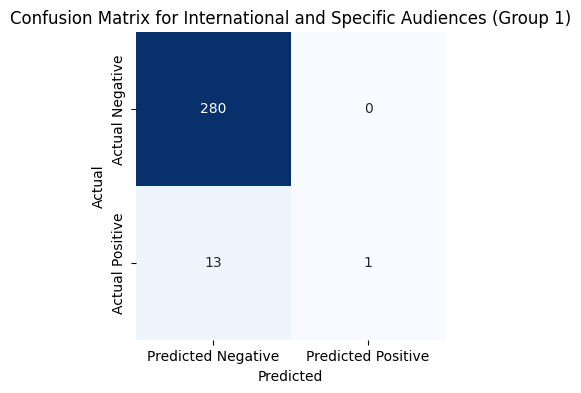

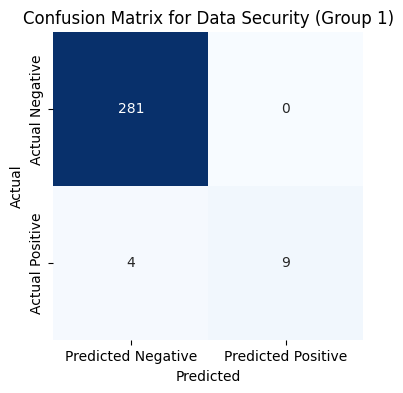

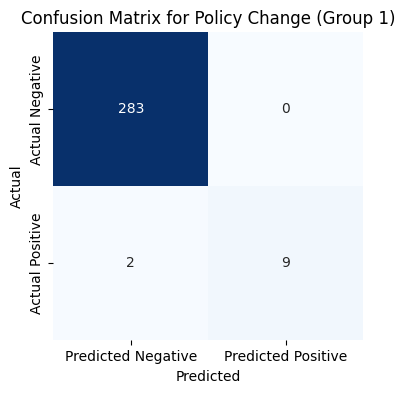

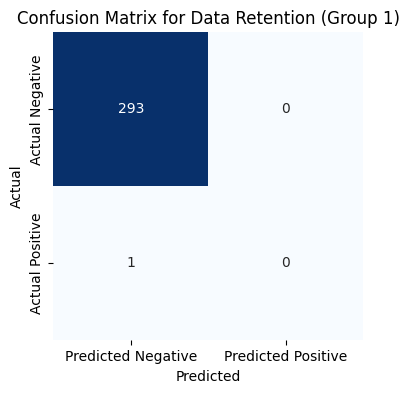

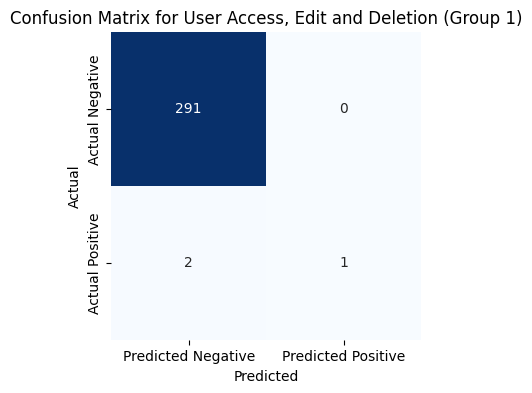


Confusion Matrices for Group 2:


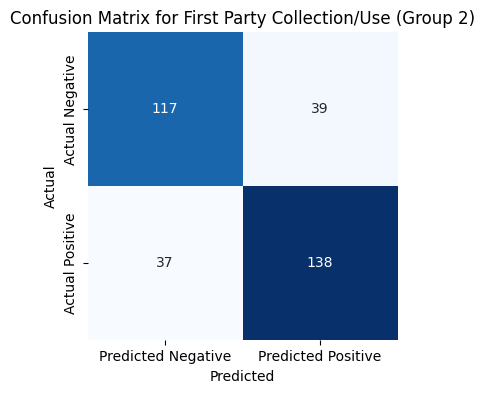

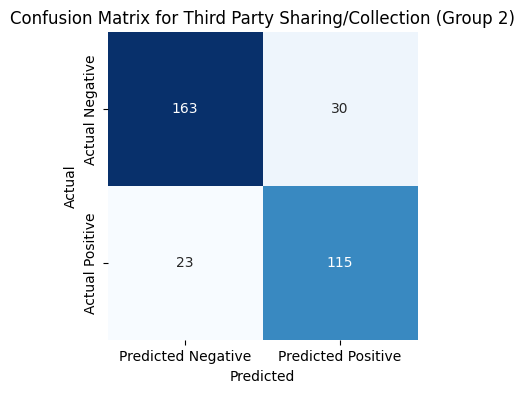

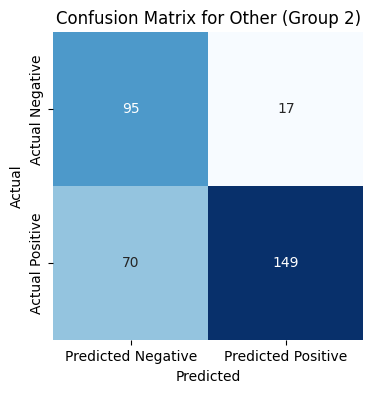

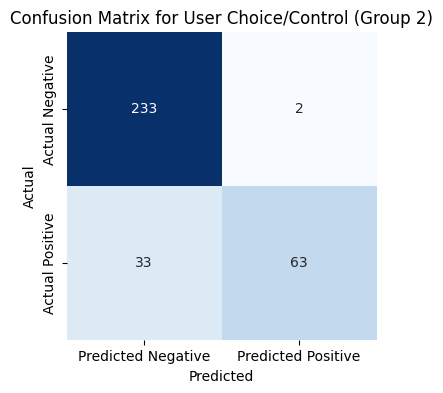

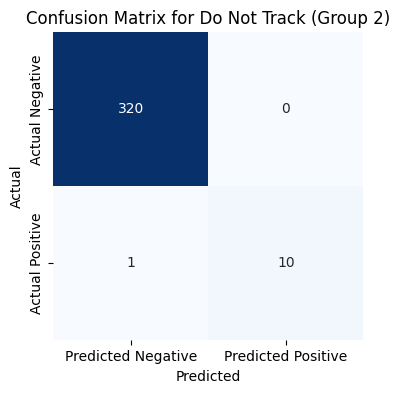

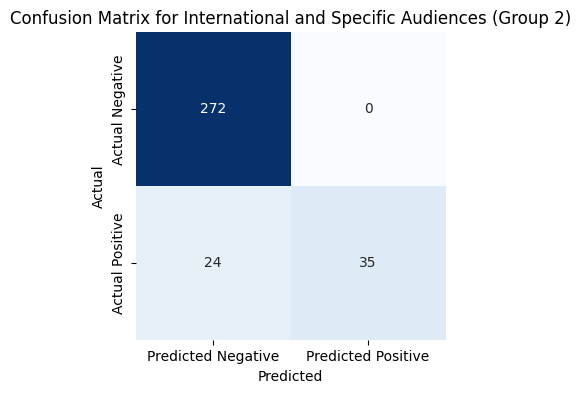

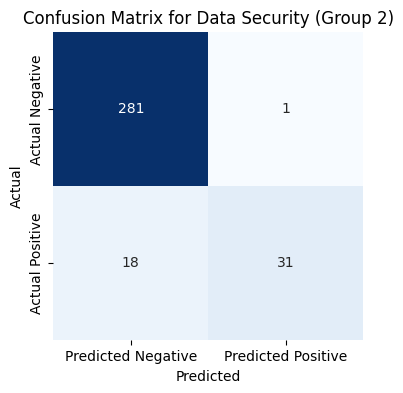

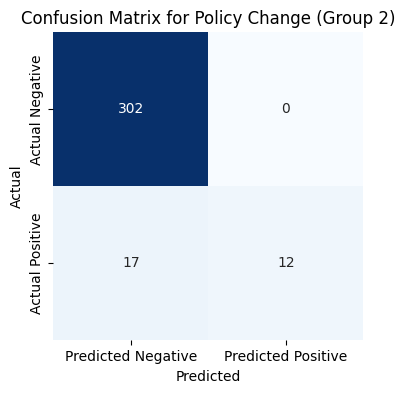

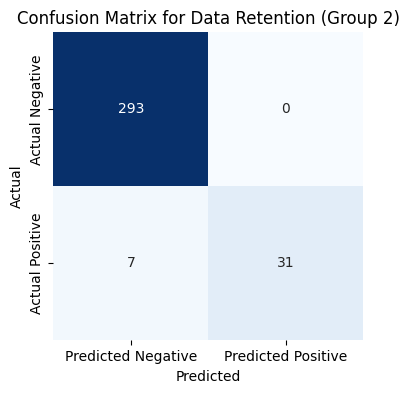

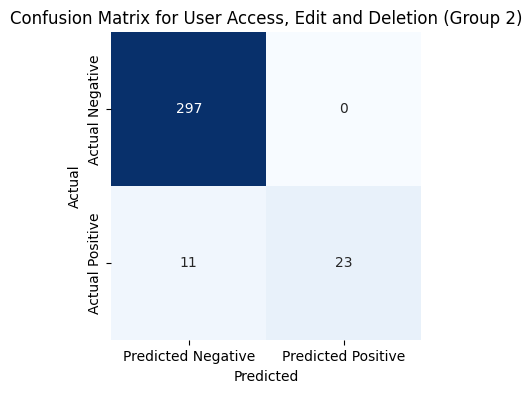


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.90304
Overall Precision: 0.7707070707070707
Overall Recall: 0.6681260945709282
Overall F1 Score: 0.7157598499061913
Combined Metrics -> Accuracy: 0.90304, Precision: 0.7707070707070707, Recall: 0.6681260945709282, F1: 0.7157598499061913

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


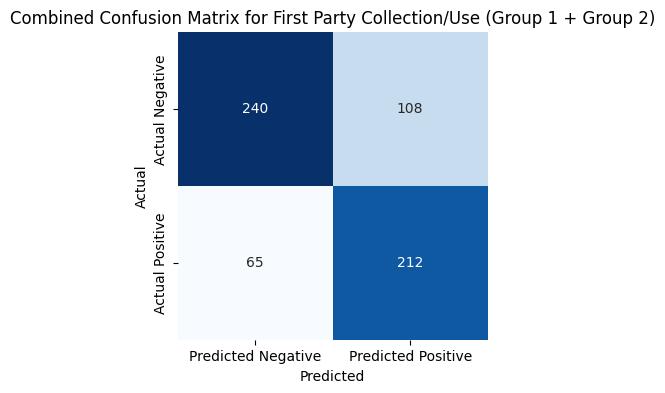


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 212, FP: 108, FN: 65, TN: 240


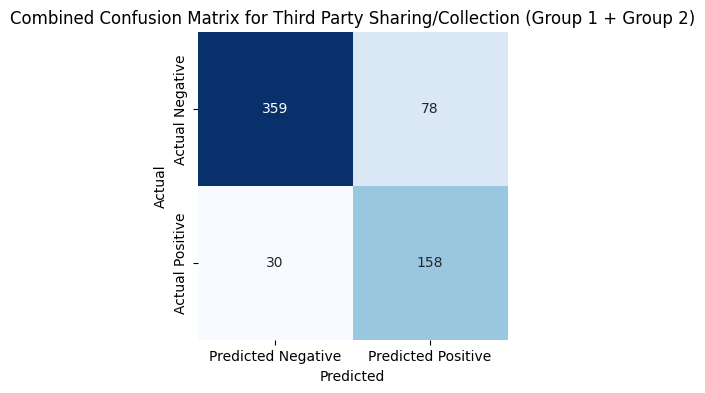


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 158, FP: 78, FN: 30, TN: 359


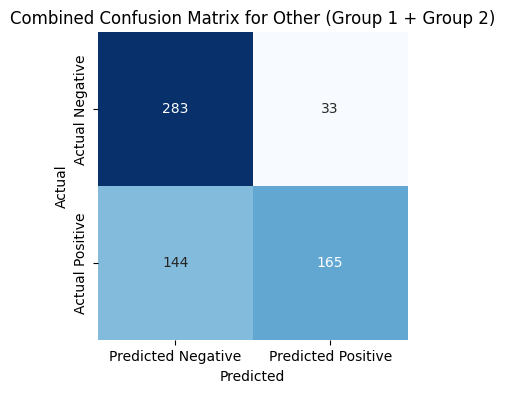


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 165, FP: 33, FN: 144, TN: 283


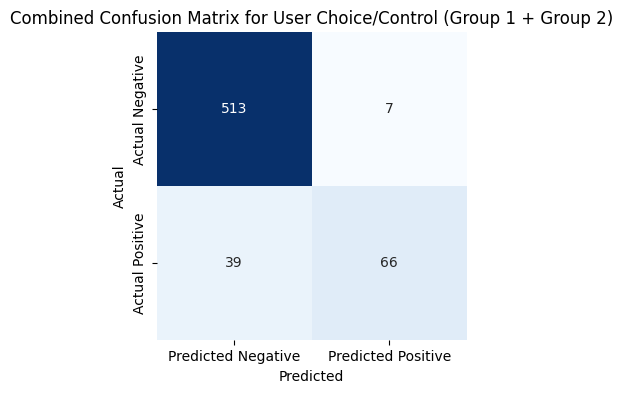


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 66, FP: 7, FN: 39, TN: 513


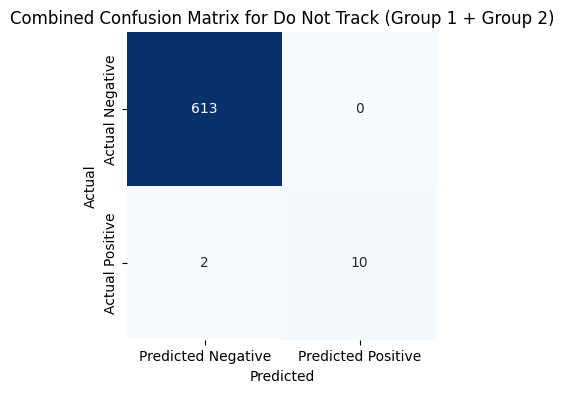


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 10, FP: 0, FN: 2, TN: 613


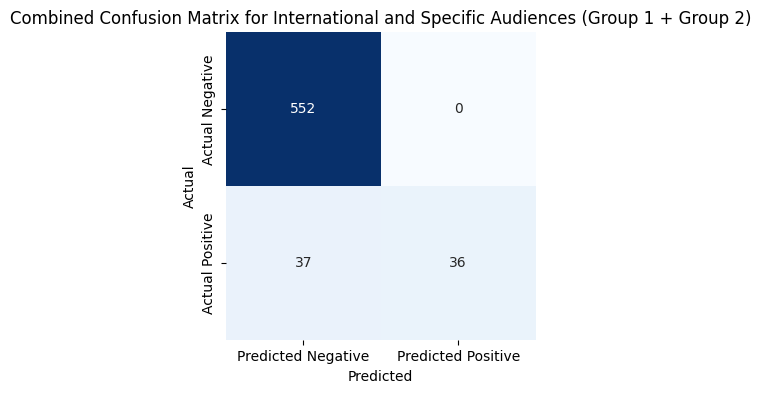


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 36, FP: 0, FN: 37, TN: 552


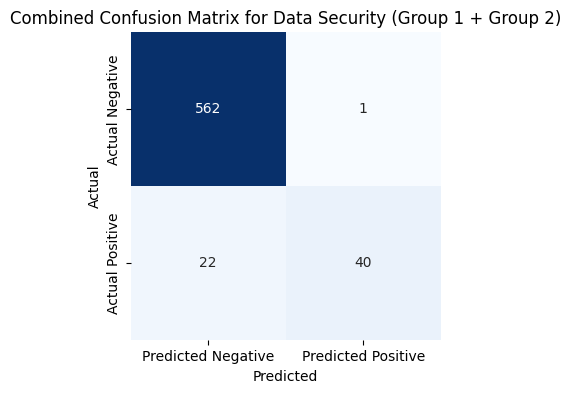


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 40, FP: 1, FN: 22, TN: 562


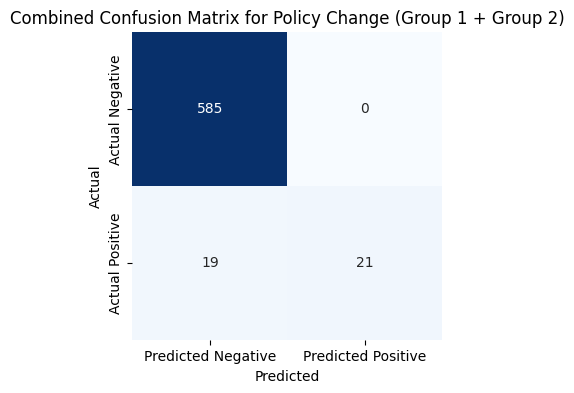


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 21, FP: 0, FN: 19, TN: 585


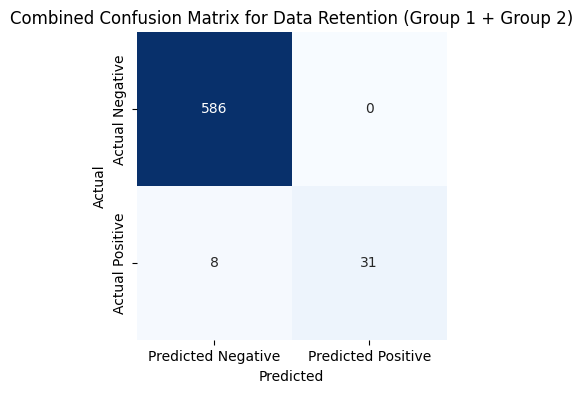


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 31, FP: 0, FN: 8, TN: 586


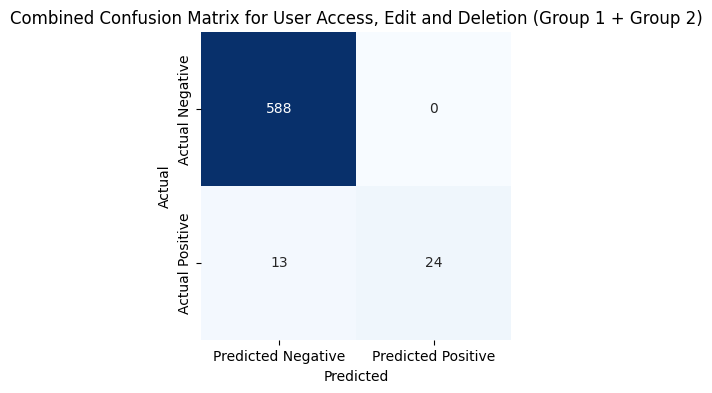


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 24, FP: 0, FN: 13, TN: 588


{'G1': {'accuracy': 0.9061224489795918,
  'precision': 0.5306122448979592,
  'recall': 0.5306122448979592,
  'f1': 0.5306122448979592,
  'category_results': {'First Party Collection/Use': {'TP': 74,
    'FP': 69,
    'TN': 123,
    'FN': 28},
   'Third Party Sharing/Collection': {'TP': 43, 'FP': 48, 'TN': 196, 'FN': 7},
   'Other': {'TP': 16, 'FP': 16, 'TN': 188, 'FN': 74},
   'User Choice/Control': {'TP': 3, 'FP': 5, 'TN': 280, 'FN': 6},
   'Do Not Track': {'TP': 0, 'FP': 0, 'TN': 293, 'FN': 1},
   'International and Specific Audiences': {'TP': 1,
    'FP': 0,
    'TN': 280,
    'FN': 13},
   'Data Security': {'TP': 9, 'FP': 0, 'TN': 281, 'FN': 4},
   'Policy Change': {'TP': 9, 'FP': 0, 'TN': 283, 'FN': 2},
   'Data Retention': {'TP': 0, 'FP': 0, 'TN': 293, 'FN': 1},
   'User Access, Edit and Deletion': {'TP': 1, 'FP': 0, 'TN': 291, 'FN': 2}}},
 'G2': {'accuracy': 0.9003021148036254,
  'precision': 0.8721264367816092,
  'recall': 0.7158018867924528,
  'f1': 0.7862694300518135,
  'cate

In [6]:
#Prompt 1 - Non Fine tuned - Base Llama 2 Model 

from util.main import PrivacyPolicyClassifier
from util.generating_cm import compute_grouped_metrics,compute_confusion_matrix_technique1 

# Create an instance of PrivacyPolicyClassifier
classifier = PrivacyPolicyClassifier(hf_token = token)

# Define the prompt template
prompt_template_1 = ("Given a privacy policy text, classify it into one of these categories: "
                   "First Party Collection/Use, Third Party Sharing/Collection, Other, "
                   "User Choice/Control, Do Not Track, International and Specific Audiences, "
                   "Data Security, Policy Change, Data Retention, User Access, Edit and Deletion.")


model_type = "base-line-model"

p1b11 = classifier.predict_and_evaluate(
    prompt_template=prompt_template_1, 
    test_data_path=test_data_path,
    num_test_data=num_entries,
    model_type=model_type,
    prompt_number=1
)

compute_confusion_matrix_technique1(p1b11)

# Compute grouped confusion matrices (Group 1 and Group 2)
compute_grouped_metrics(p1b11)

/home/bhavani/GA Work/Fine_Tuning_and_ChatBot_Creation/lib/python3.10/site-packages/transformers/models/auto/tokenization_auto.py:796: FutureWarning: The `use_auth_token` argument is deprecated and will be removed in v5 of Transformers. Please use `token` instead.
  warnings.warn(
Loading checkpoint shards: 100%|██████████| 2/2 [00:03<00:00,  1.68s/it]
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


Generated new tokens:First Party Collection/Use

Explanation: The privacy policy mentions the collection and use of personal information by BWW and its affiliated contractors, which falls under the category of First Party Collection/Use.
['▁First', '▁Party', '▁Collection', '/', 'Use', '<0x0A>', '<0x0A>', 'Ex', 'plan', 'ation', ':', '▁The', '▁priv', 'acy', '▁policy', '▁mentions', '▁the', '▁collection', '▁and', '▁use', '▁of', '▁personal', '▁information', '▁by', '▁B', 'W', 'W', '▁and', '▁its', '▁affili', 'ated', '▁contract', 'ors', ',', '▁which', '▁falls', '▁under', '▁the', '▁category', '▁of', '▁First', '▁Party', '▁Collection', '/', 'Use', '.']
Elapsed Time: 2.824932813644409
New tokens generated: 46
Tokens generated per second: 16.28 tokens/s
Predicted categories:['First Party Collection/Use']
Privacy Policy Text: PRIVACY POLICY    Buffalo Wild Wings, Inc., its franchisees, marketing agencies, and affiliated contractors, as specifically identified here (collectively "BWW," "we" or "us"),

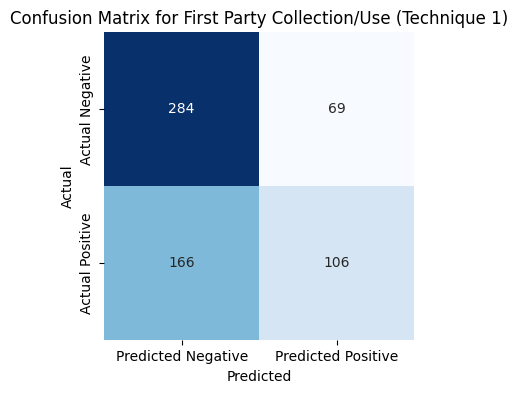


Plotting confusion matrix for category: Third Party Sharing/Collection


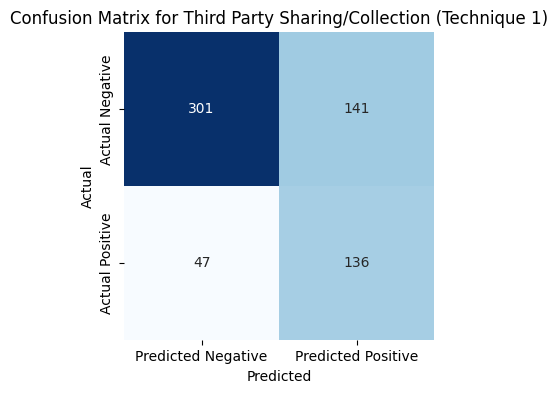


Plotting confusion matrix for category: Other


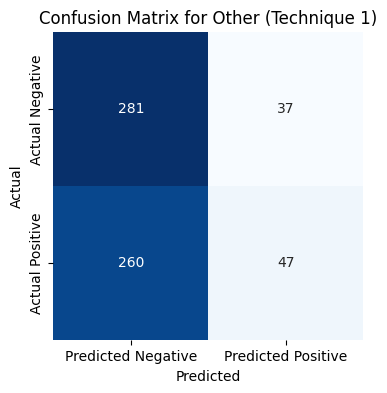


Plotting confusion matrix for category: User Choice/Control


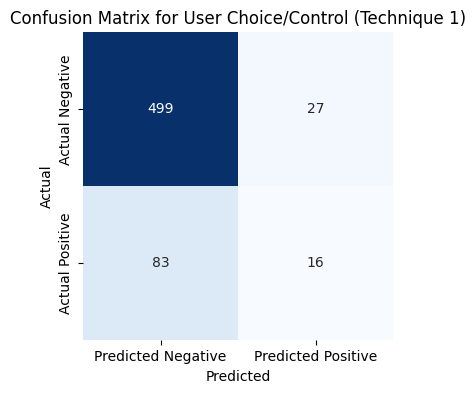


Plotting confusion matrix for category: Do Not Track


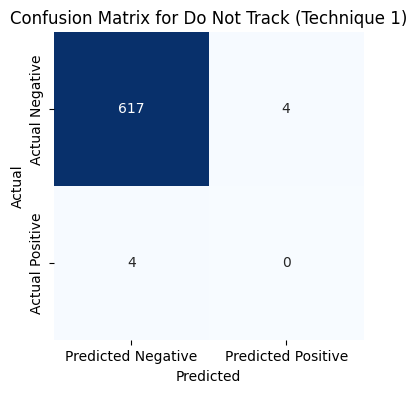


Plotting confusion matrix for category: International and Specific Audiences


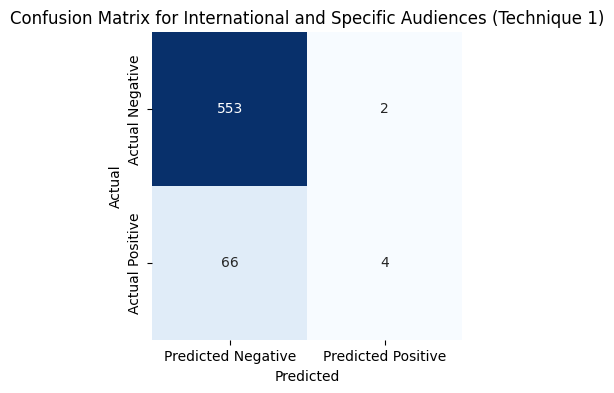


Plotting confusion matrix for category: Data Security


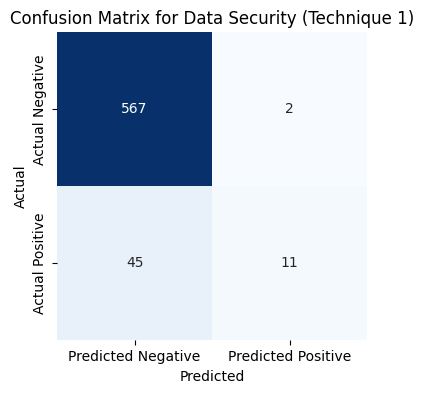


Plotting confusion matrix for category: Policy Change


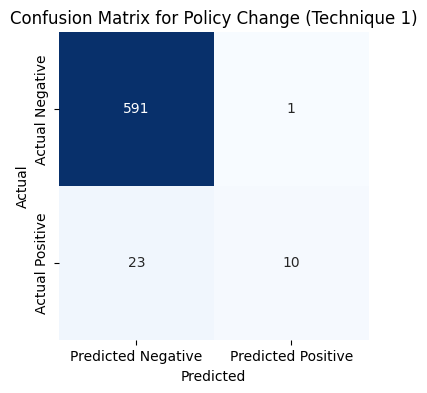


Plotting confusion matrix for category: Data Retention


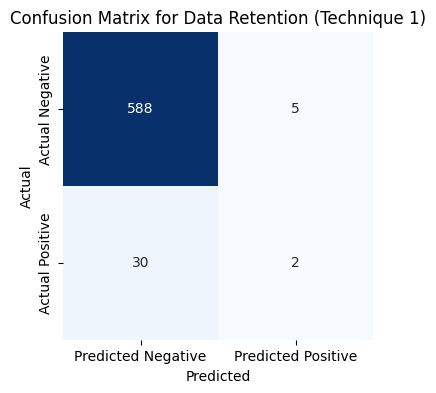


Plotting confusion matrix for category: User Access, Edit and Deletion


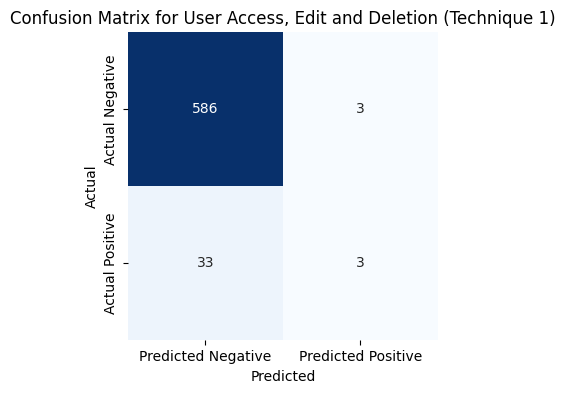


Overall tp: 335
Overall tn: 4867
Overall fp: 291
Overall fn: 757
Overall Precision (Technique 1): 0.5351437699680511
Overall Recall (Technique 1): 0.3067765567765568
Overall F1 Score (Technique 1): 0.389988358556461
Overall Accuracy (Technique 1): 0.83232
TP 106
TN 284
FP 69
FN 166

TP 136
TN 301
FP 141
FN 47

TP 47
TN 281
FP 37
FN 260

TP 16
TN 499
FP 27
FN 83

TP 0
TN 617
FP 4
FN 4

TP 4
TN 553
FP 2
FN 66

TP 11
TN 567
FP 2
FN 45

TP 10
TN 591
FP 1
FN 23

TP 2
TN 588
FP 5
FN 30

TP 3
TN 586
FP 3
FN 33

Micro Precision: 0.5351437699680511
Micro Recall: 0.3067765567765568
Micro F1 Score: 0.389988358556461
Micro Accuracy: 0.83232
Macro Precision: 0.5235931555361494
Macro Recall: 0.21500209703519885
Macro F1 Score: 0.26554090358836197
Weighted Precision: 0.5626445230639409
Weighted Recall: 0.3067765567765568
Weighted F1 Score: 0.34979379165141244
Sample Average Precision: 0.5331199999999999
Sample Average Recall: 0.3618311111111111
Sample Average F1 Score: 0.4085818181818182

Overall Me

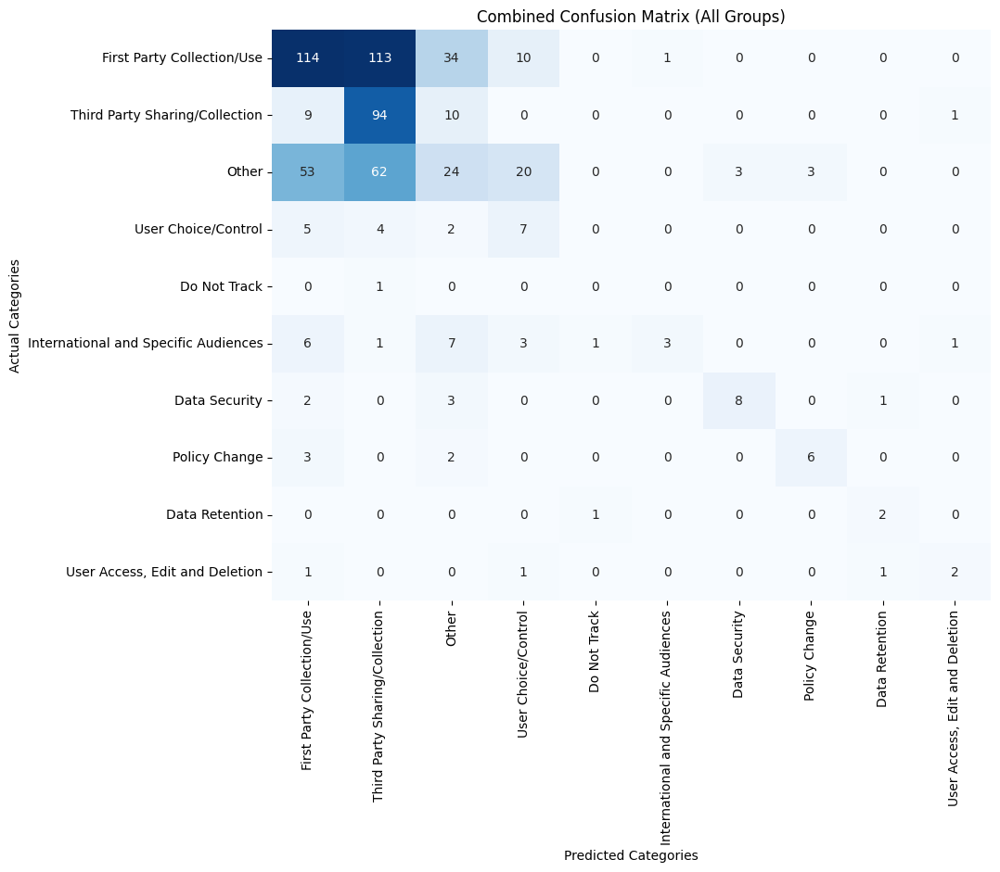


Metrics for Group 1:
Accuracy: 0.8960264900662251
Precision: 0.48013245033112584
Recall: 0.48013245033112584
F1 Score: 0.48013245033112584

Metrics for Group 2:
Accuracy: 0.8696594427244582
Precision: 0.8126009693053312
Recall: 0.6225247524752475
F1 Score: 0.7049754730203224

Confusion Matrices for Group 1:


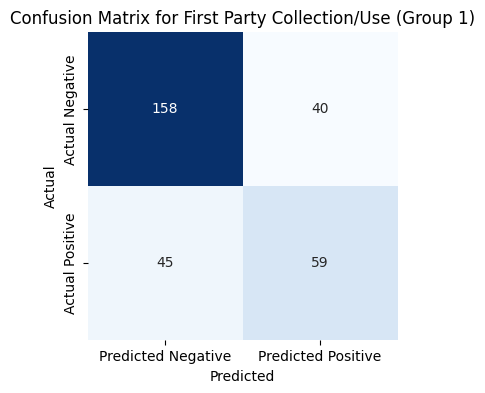

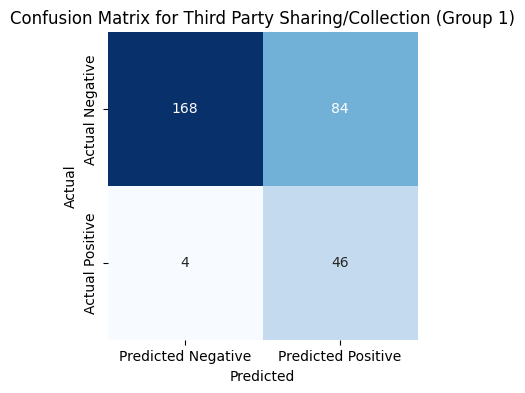

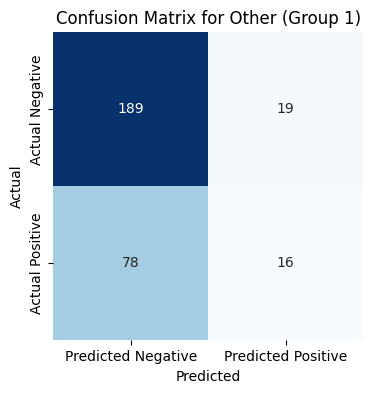

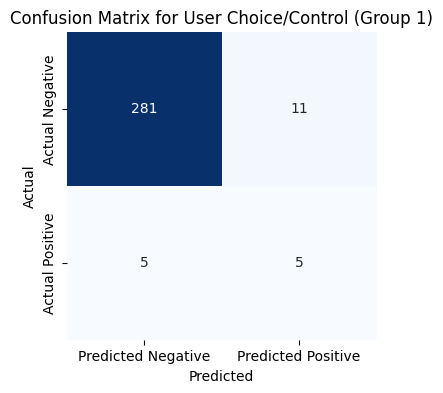

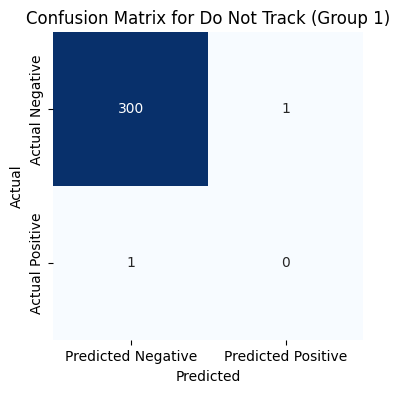

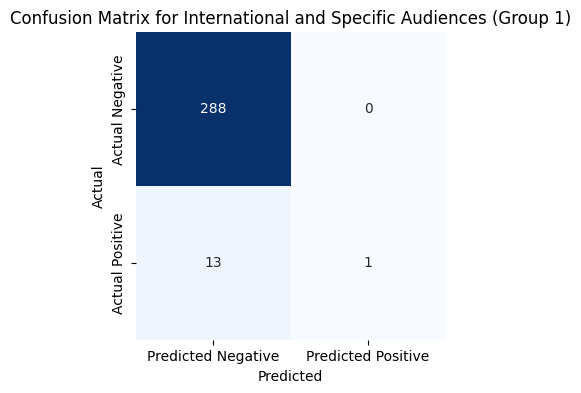

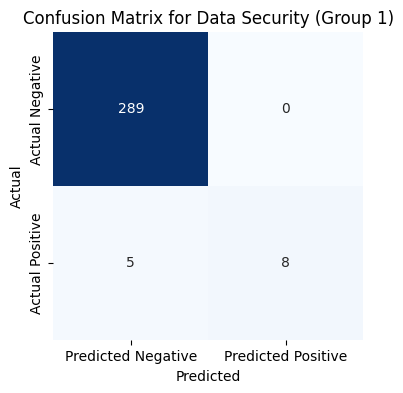

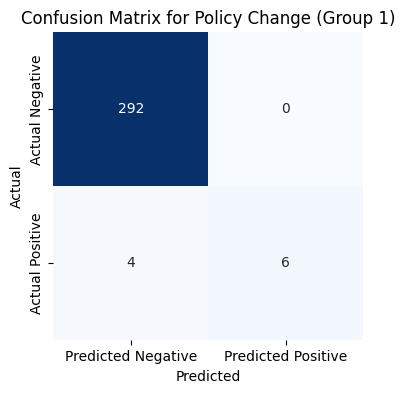

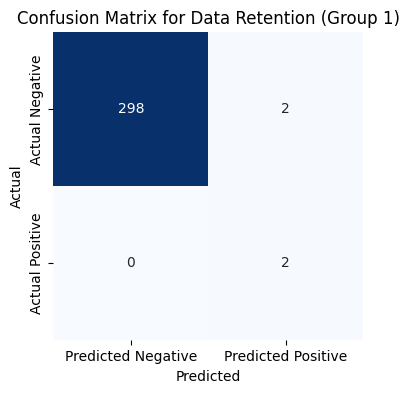

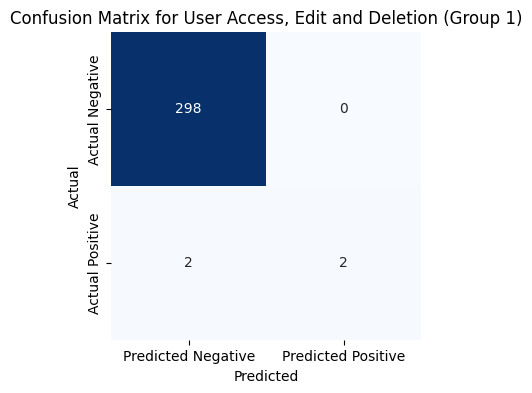


Confusion Matrices for Group 2:


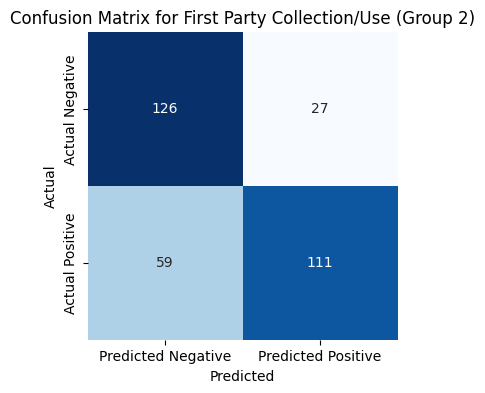

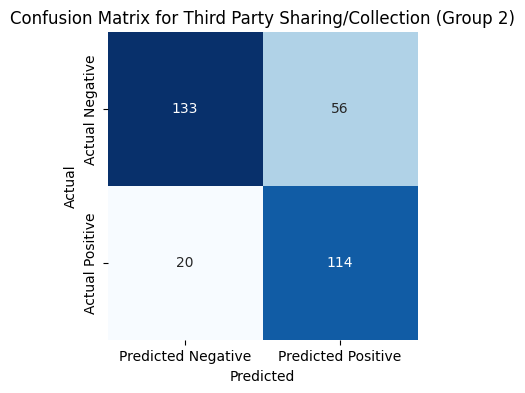

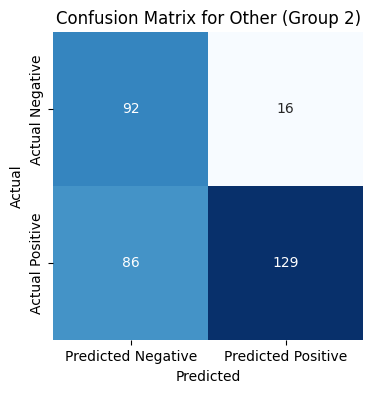

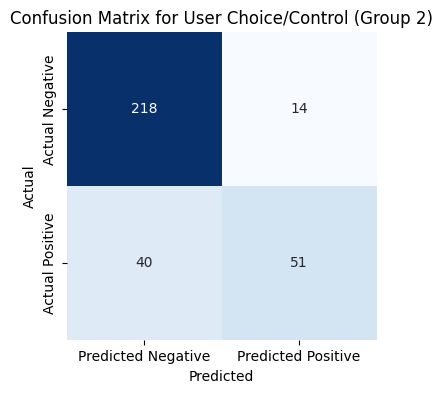

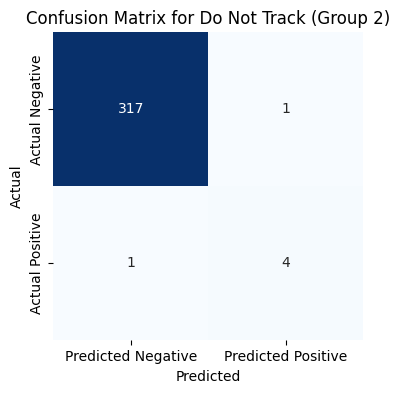

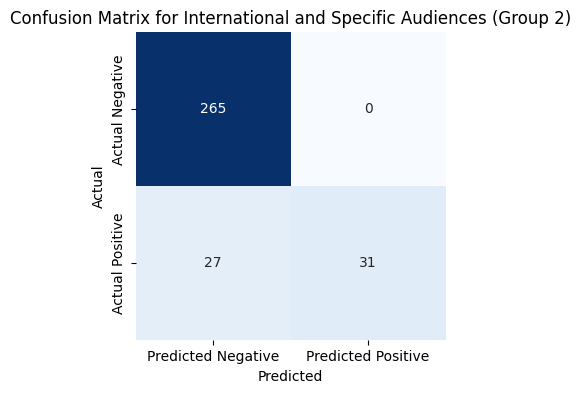

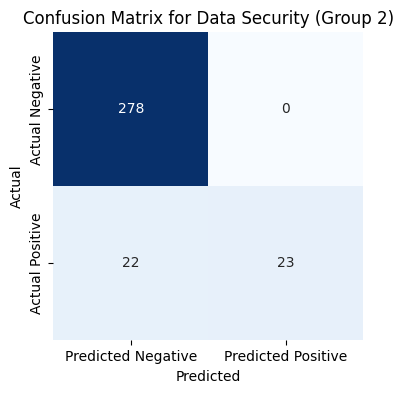

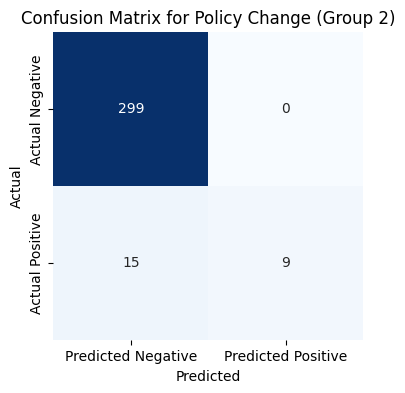

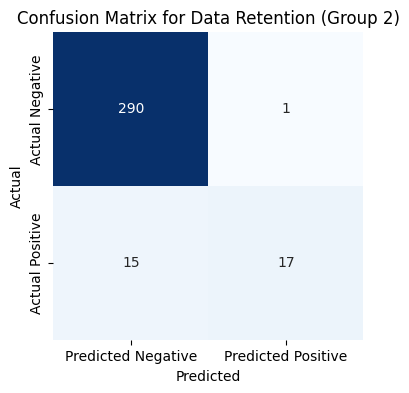

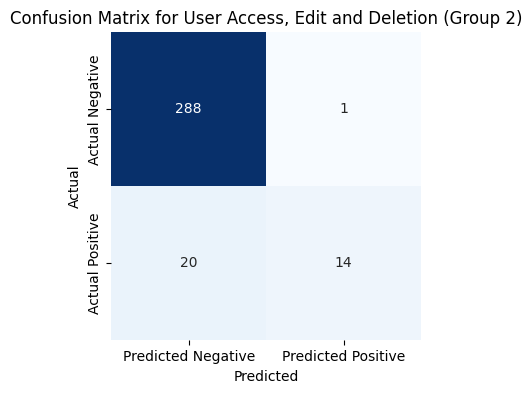


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.8824
Overall Precision: 0.7035830618892508
Overall Recall: 0.5837837837837838
Overall F1 Score: 0.638109305760709
Combined Metrics -> Accuracy: 0.8824, Precision: 0.7035830618892508, Recall: 0.5837837837837838, F1: 0.638109305760709

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


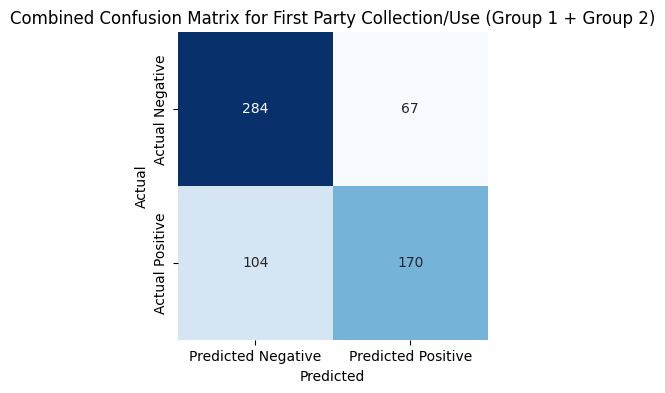


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 170, FP: 67, FN: 104, TN: 284


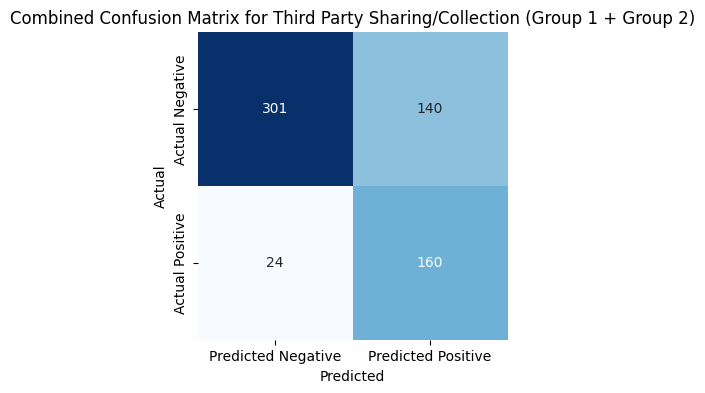


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 160, FP: 140, FN: 24, TN: 301


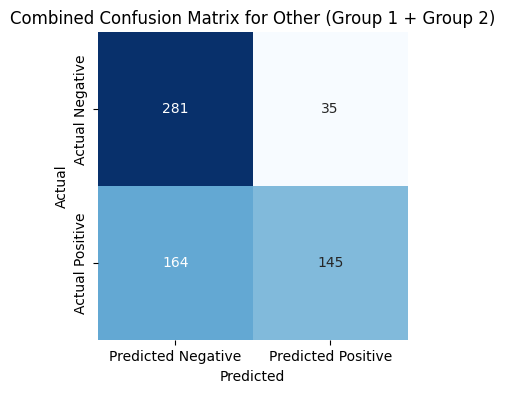


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 145, FP: 35, FN: 164, TN: 281


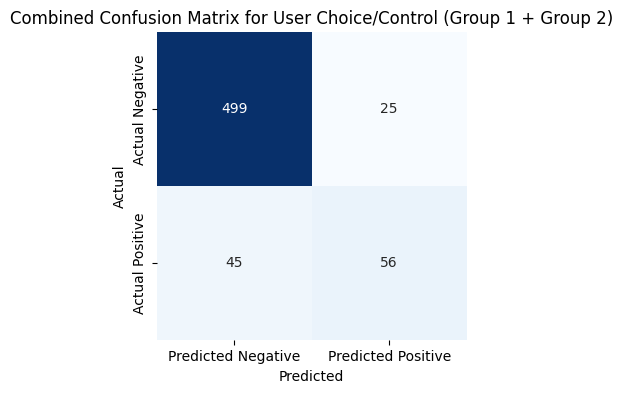


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 56, FP: 25, FN: 45, TN: 499


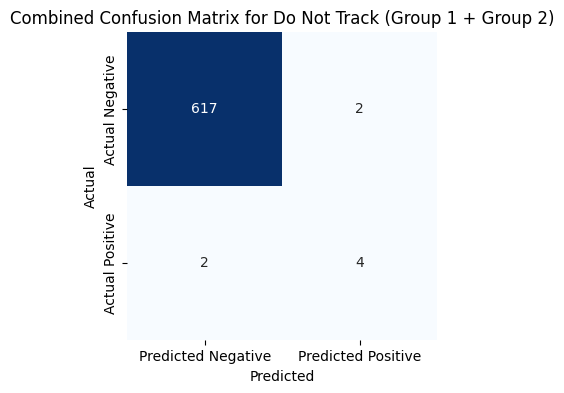


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 4, FP: 2, FN: 2, TN: 617


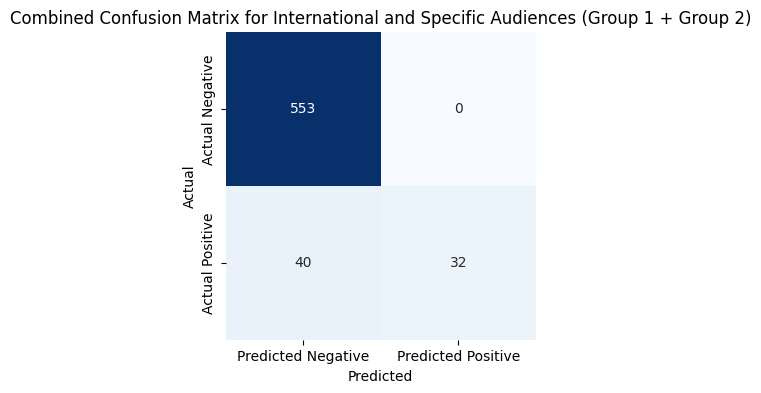


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 32, FP: 0, FN: 40, TN: 553


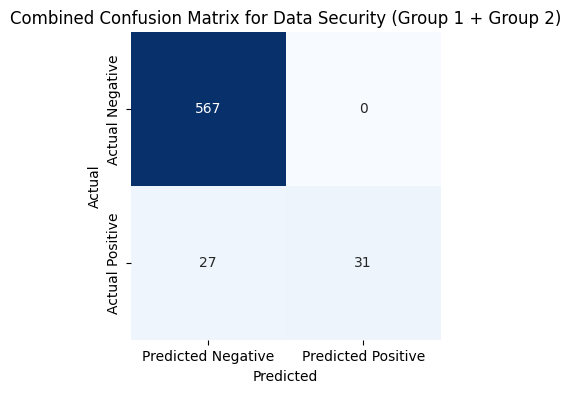


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 31, FP: 0, FN: 27, TN: 567


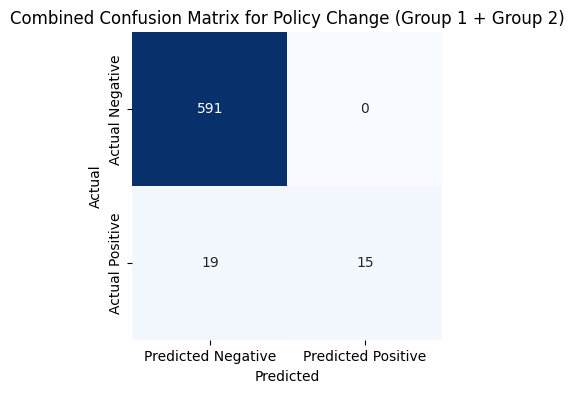


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 15, FP: 0, FN: 19, TN: 591


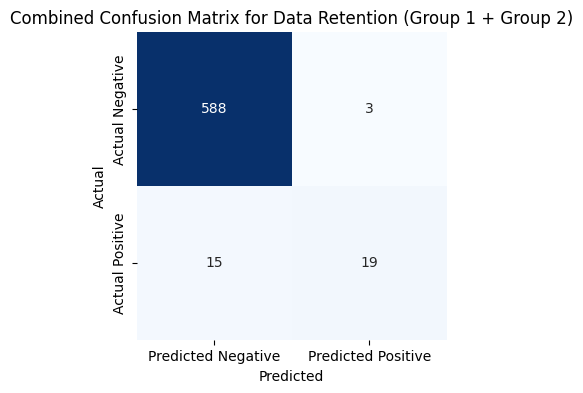


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 19, FP: 3, FN: 15, TN: 588


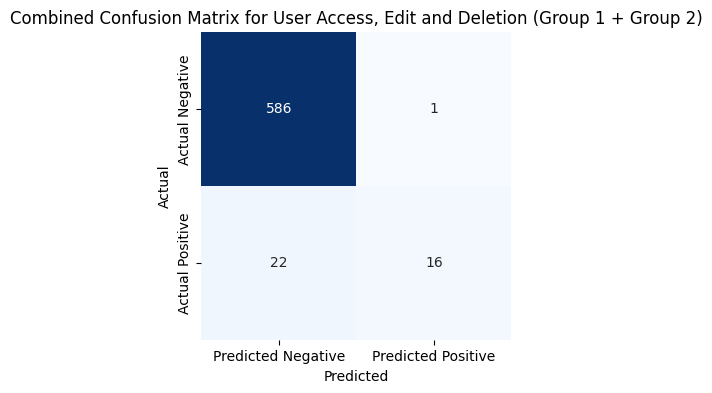


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 16, FP: 1, FN: 22, TN: 586
New tokens list: [46, 44, 5, 5, 37, 6, 6, 53, 62, 46, 6, 5, 49, 46, 46, 105, 64, 38, 40, 51, 67, 35, 47, 44, 40, 6, 77, 51, 83, 39, 44, 562, 93, 61, 46, 5, 5, 44, 6, 6, 6, 6, 6, 6, 35, 5, 76, 42, 133, 388, 6, 6, 6, 90, 34, 41, 8, 50, 66, 42, 58, 92, 8, 41, 5, 50, 42, 6, 45, 2, 37, 44, 51, 6, 45, 5, 5, 5, 62, 5, 6, 52, 37, 5, 6, 103, 64, 33, 38, 55, 71, 49, 6, 34, 60, 5, 6, 6, 5, 43, 1, 59, 37, 42, 6, 6, 6, 5, 5, 6, 55, 5, 56, 6, 55, 6, 6, 21, 5, 34, 5, 6, 6, 59, 49, 6, 6, 6, 44, 95, 7, 6, 6, 58, 6, 5, 5, 5, 33, 6, 5, 66, 60, 72, 35, 27, 58, 56, 42, 48, 31, 35, 47, 6, 5, 25, 94, 6, 6, 60, 6, 6, 25, 5, 5, 49, 6, 96, 6, 6, 45, 35, 7, 5, 2, 49, 47, 72, 49, 37, 39, 151, 5, 5, 57, 5, 5, 5, 5, 96, 61, 6, 62, 6, 5, 6, 33, 6, 6, 6, 6, 6, 6, 406, 6, 29, 6, 5, 46, 57, 5, 6, 47, 6, 52, 6, 16, 6, 55, 6, 73, 284, 39, 54, 66, 40, 44, 5, 34, 67, 5, 5, 6, 5, 5, 5, 52, 6, 37, 6, 6, 6, 6, 6, 5,

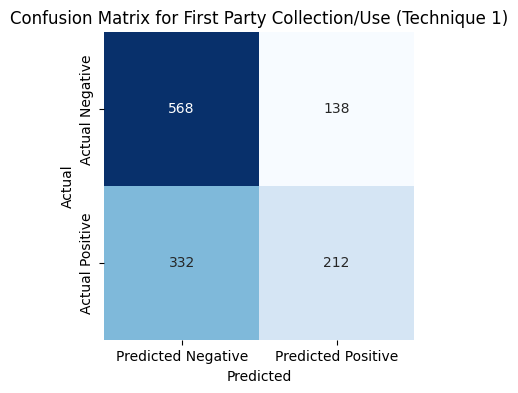


Plotting confusion matrix for category: Third Party Sharing/Collection


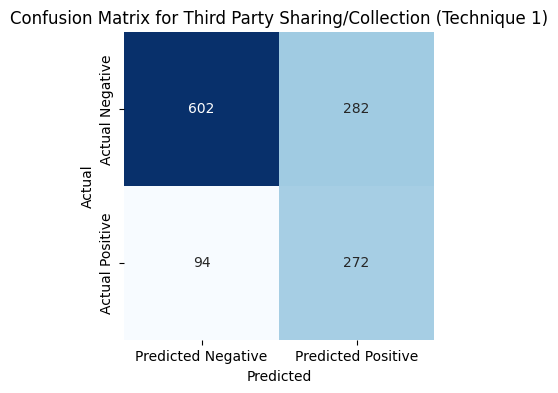


Plotting confusion matrix for category: Other


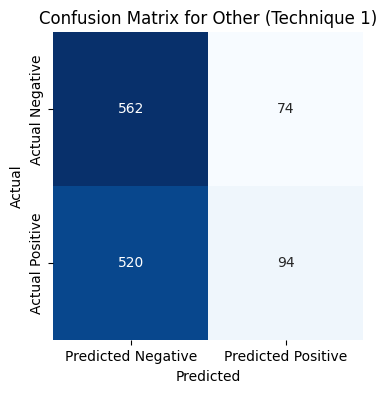


Plotting confusion matrix for category: User Choice/Control


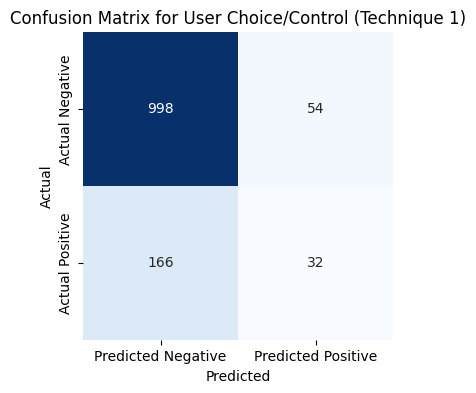


Plotting confusion matrix for category: Do Not Track


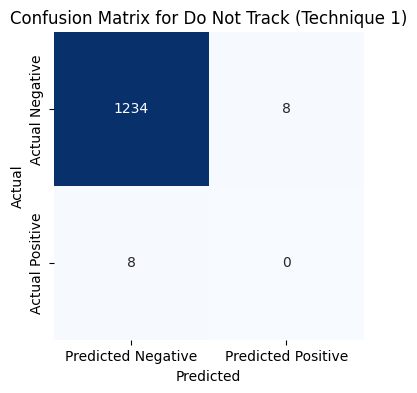


Plotting confusion matrix for category: International and Specific Audiences


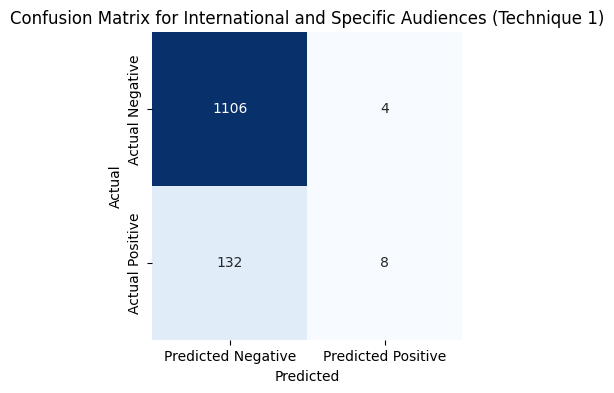


Plotting confusion matrix for category: Data Security


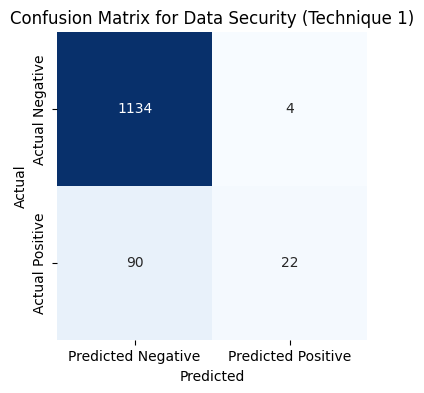


Plotting confusion matrix for category: Policy Change


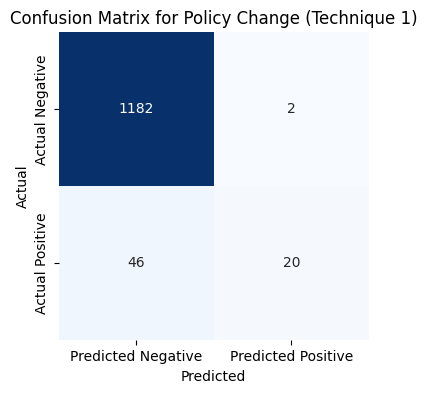


Plotting confusion matrix for category: Data Retention


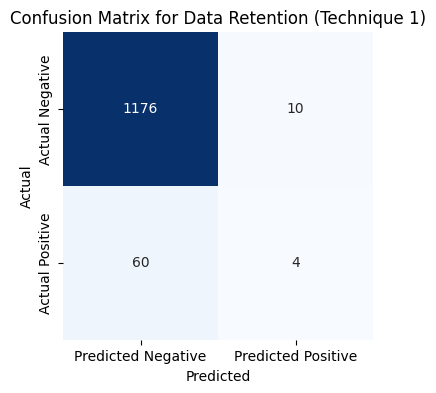


Plotting confusion matrix for category: User Access, Edit and Deletion


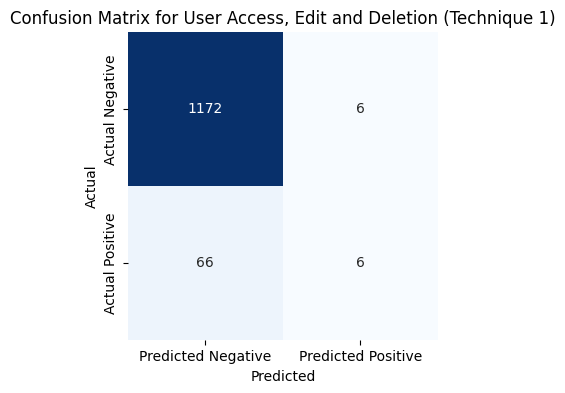


Overall tp: 670
Overall tn: 9734
Overall fp: 582
Overall fn: 1514
Overall Precision (Technique 1): 0.5351437699680511
Overall Recall (Technique 1): 0.3067765567765568
Overall F1 Score (Technique 1): 0.389988358556461
Overall Accuracy (Technique 1): 0.83232
TP 212
TN 568
FP 138
FN 332

TP 272
TN 602
FP 282
FN 94

TP 94
TN 562
FP 74
FN 520

TP 32
TN 998
FP 54
FN 166

TP 0
TN 1234
FP 8
FN 8

TP 8
TN 1106
FP 4
FN 132

TP 22
TN 1134
FP 4
FN 90

TP 20
TN 1182
FP 2
FN 46

TP 4
TN 1176
FP 10
FN 60

TP 6
TN 1172
FP 6
FN 66

Micro Precision: 0.5351437699680511
Micro Recall: 0.3067765567765568
Micro F1 Score: 0.389988358556461
Micro Accuracy: 0.83232
Macro Precision: 0.5235931555361494
Macro Recall: 0.21500209703519885
Macro F1 Score: 0.26554090358836197
Weighted Precision: 0.5626445230639409
Weighted Recall: 0.3067765567765568
Weighted F1 Score: 0.34979379165141244
Sample Average Precision: 0.5331199999999999
Sample Average Recall: 0.3618311111111111
Sample Average F1 Score: 0.4085818181818182


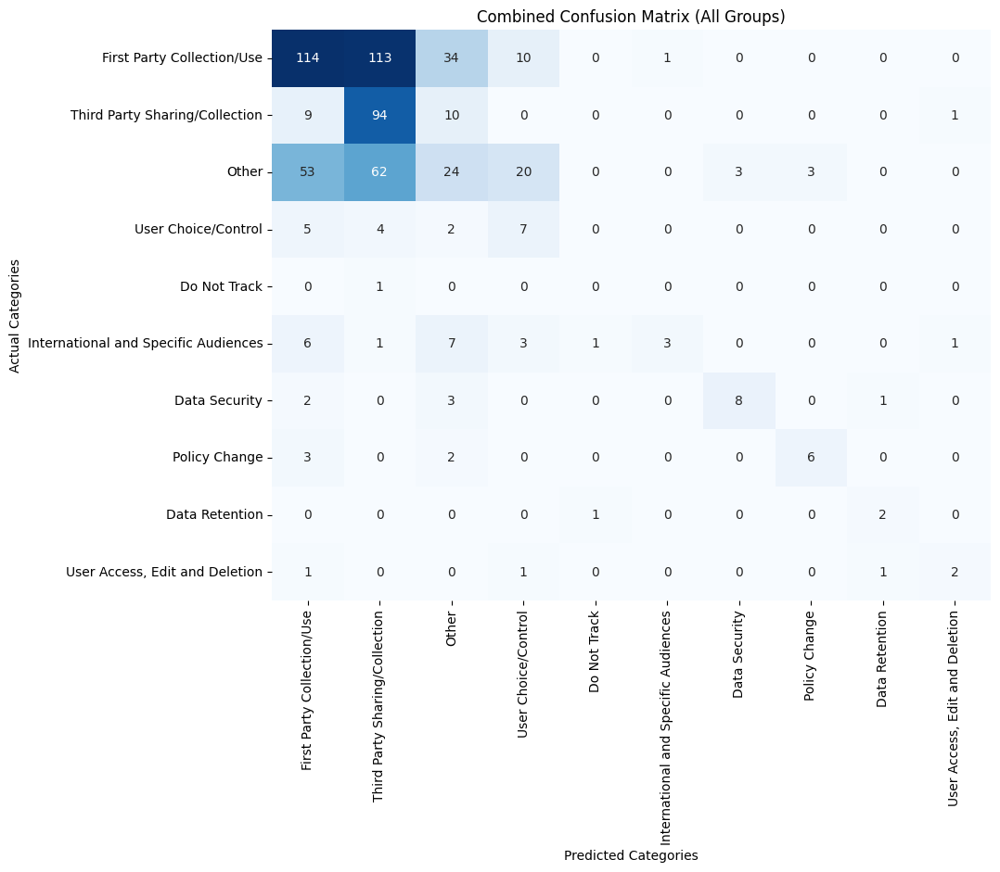


Metrics for Group 1:
Accuracy: 0.8960264900662251
Precision: 0.48013245033112584
Recall: 0.48013245033112584
F1 Score: 0.48013245033112584

Metrics for Group 2:
Accuracy: 0.8696594427244582
Precision: 0.8126009693053312
Recall: 0.6225247524752475
F1 Score: 0.7049754730203224

Confusion Matrices for Group 1:


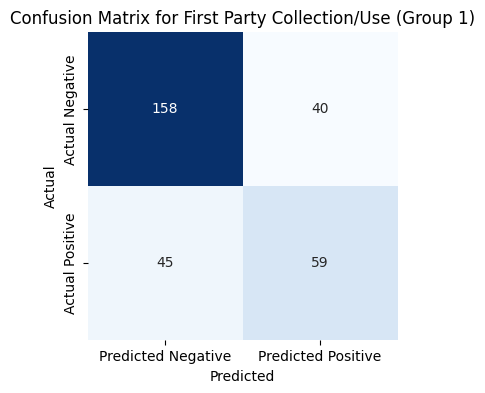

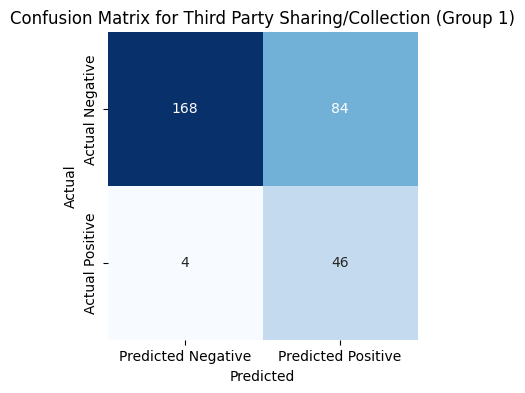

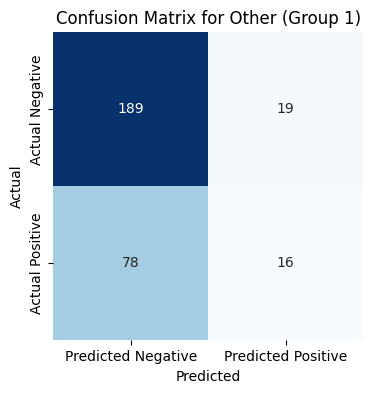

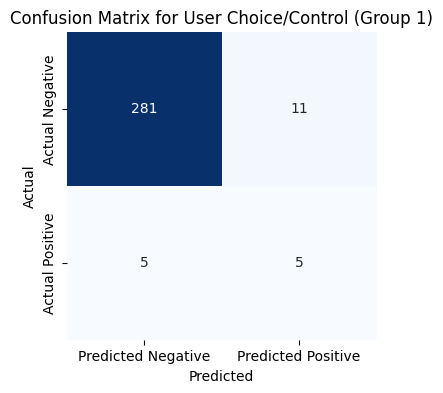

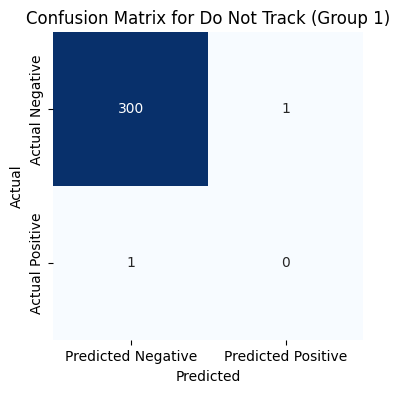

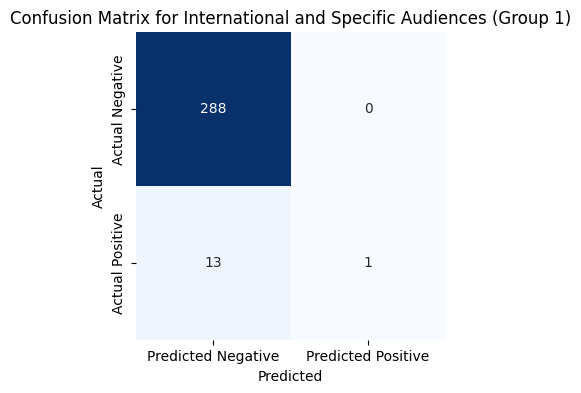

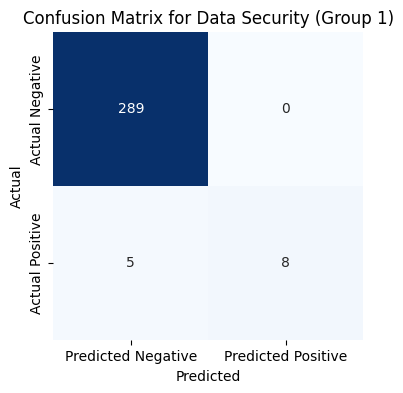

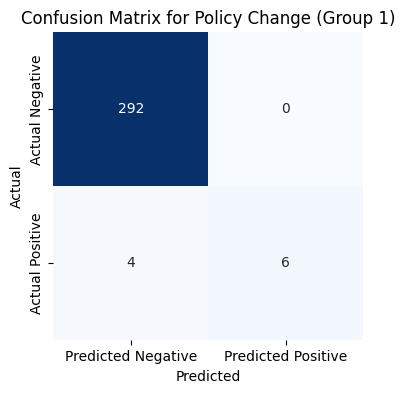

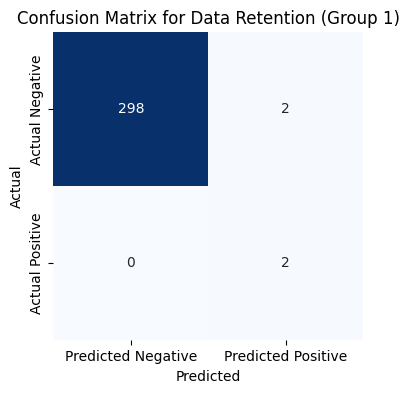

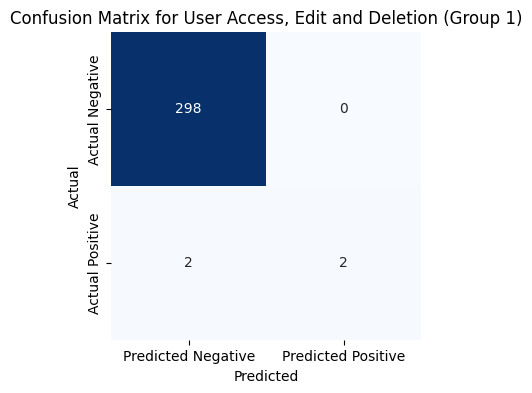


Confusion Matrices for Group 2:


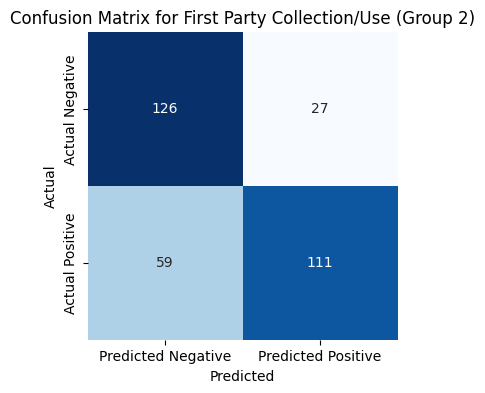

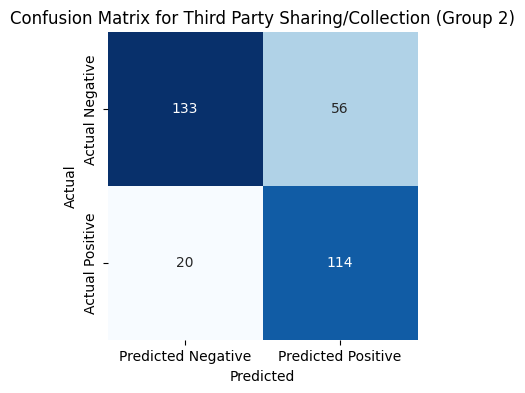

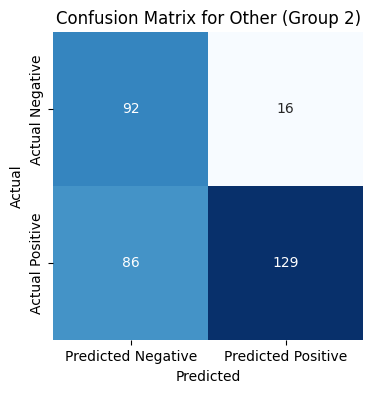

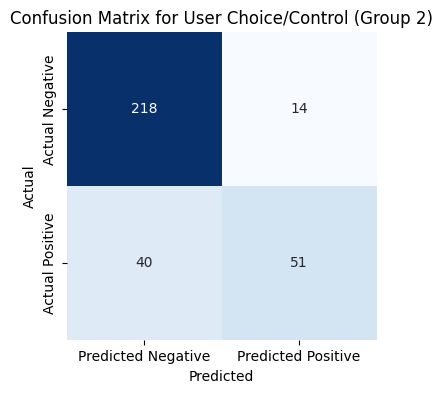

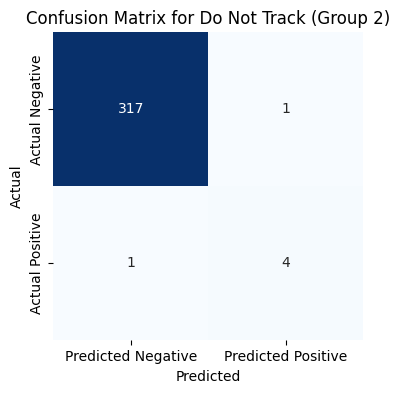

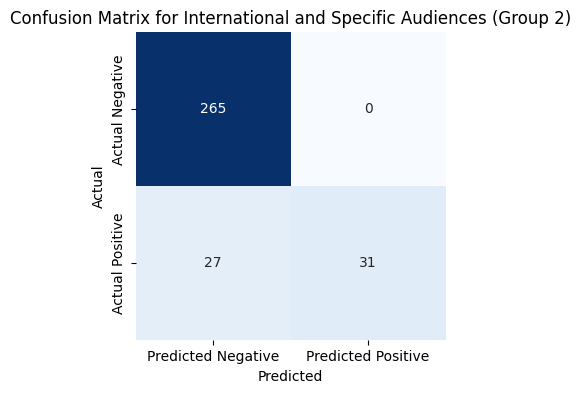

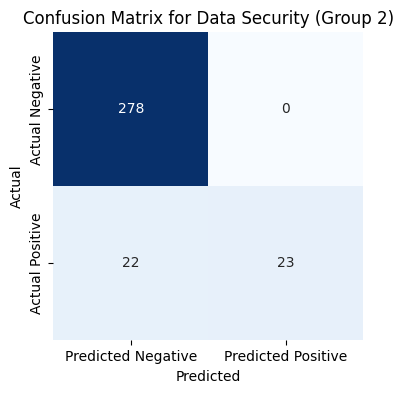

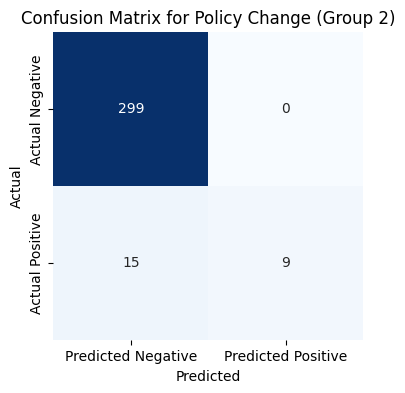

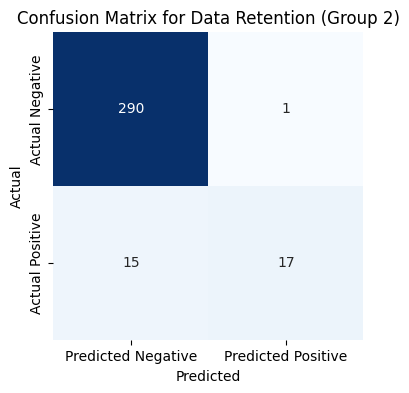

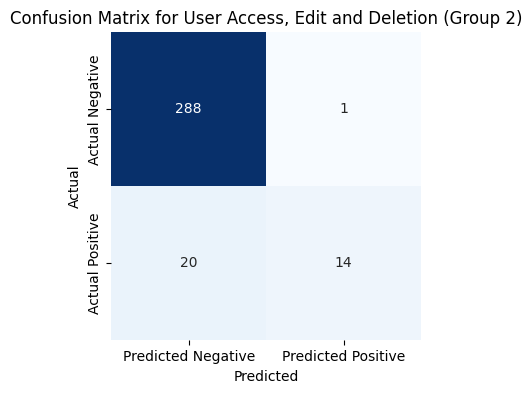


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.8824
Overall Precision: 0.7035830618892508
Overall Recall: 0.5837837837837838
Overall F1 Score: 0.638109305760709
Combined Metrics -> Accuracy: 0.8824, Precision: 0.7035830618892508, Recall: 0.5837837837837838, F1: 0.638109305760709

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


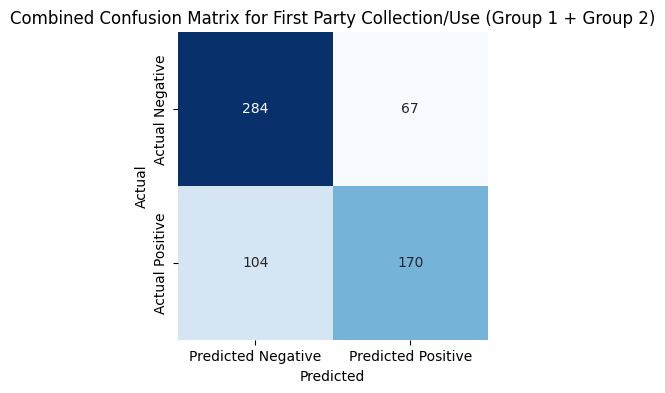


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 170, FP: 67, FN: 104, TN: 284


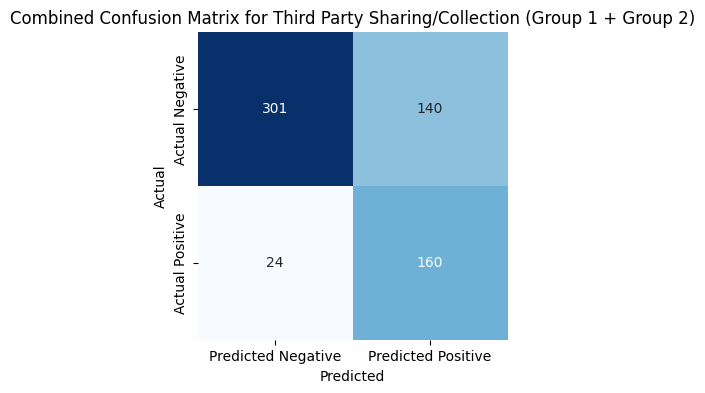


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 160, FP: 140, FN: 24, TN: 301


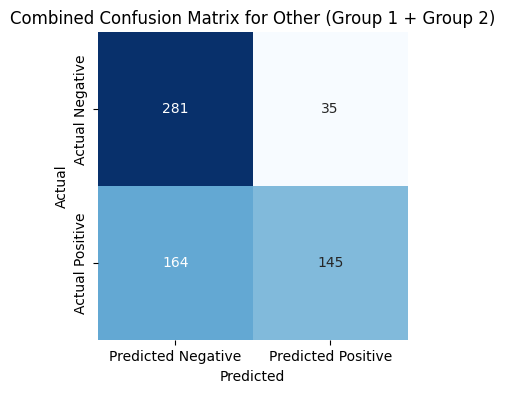


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 145, FP: 35, FN: 164, TN: 281


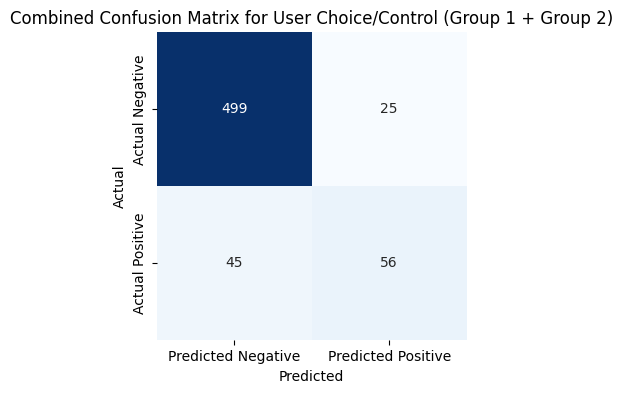


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 56, FP: 25, FN: 45, TN: 499


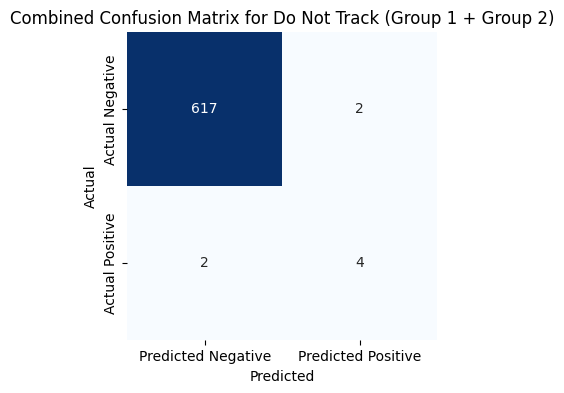


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 4, FP: 2, FN: 2, TN: 617


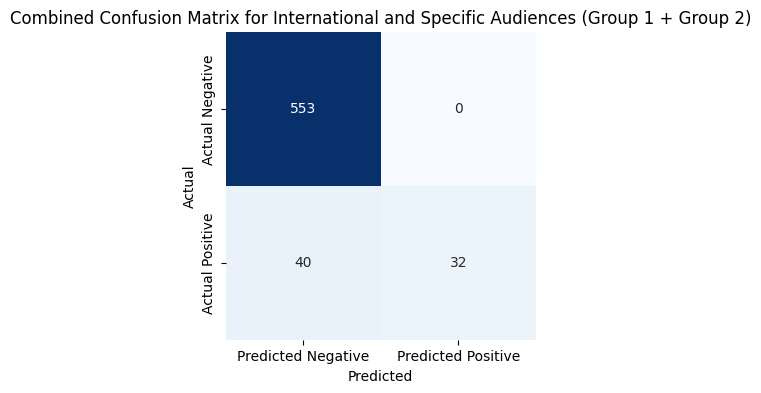


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 32, FP: 0, FN: 40, TN: 553


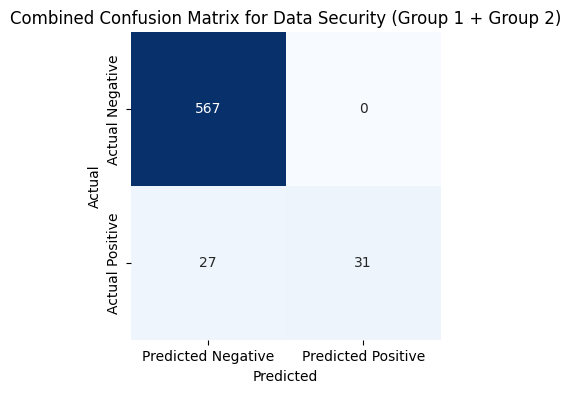


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 31, FP: 0, FN: 27, TN: 567


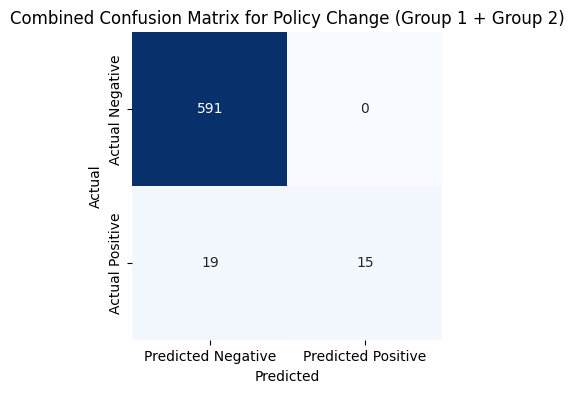


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 15, FP: 0, FN: 19, TN: 591


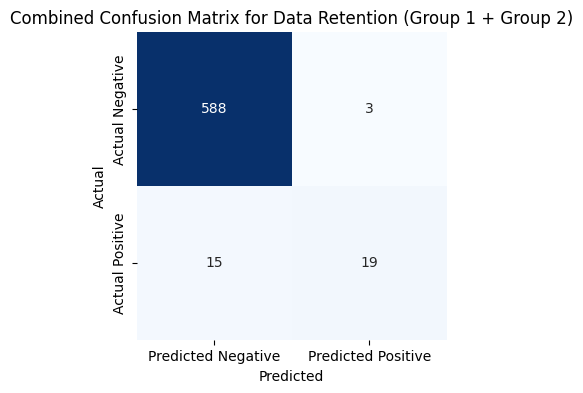


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 19, FP: 3, FN: 15, TN: 588


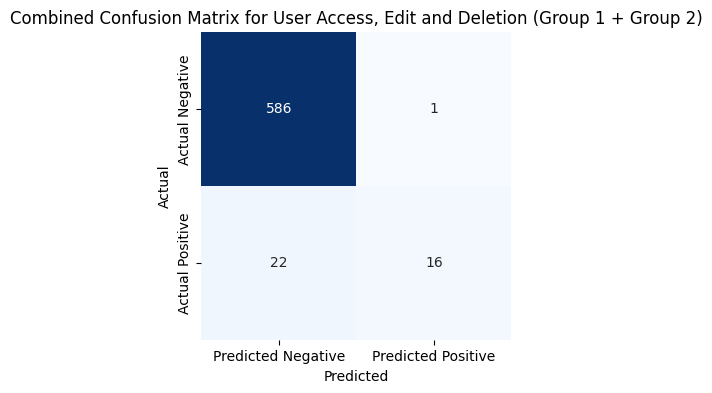


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 16, FP: 1, FN: 22, TN: 586


{'G1': {'accuracy': 0.8960264900662251,
  'precision': 0.48013245033112584,
  'recall': 0.48013245033112584,
  'f1': 0.48013245033112584,
  'category_results': {'First Party Collection/Use': {'TP': 59,
    'FP': 40,
    'TN': 158,
    'FN': 45},
   'Third Party Sharing/Collection': {'TP': 46, 'FP': 84, 'TN': 168, 'FN': 4},
   'Other': {'TP': 16, 'FP': 19, 'TN': 189, 'FN': 78},
   'User Choice/Control': {'TP': 5, 'FP': 11, 'TN': 281, 'FN': 5},
   'Do Not Track': {'TP': 0, 'FP': 1, 'TN': 300, 'FN': 1},
   'International and Specific Audiences': {'TP': 1,
    'FP': 0,
    'TN': 288,
    'FN': 13},
   'Data Security': {'TP': 8, 'FP': 0, 'TN': 289, 'FN': 5},
   'Policy Change': {'TP': 6, 'FP': 0, 'TN': 292, 'FN': 4},
   'Data Retention': {'TP': 2, 'FP': 2, 'TN': 298, 'FN': 0},
   'User Access, Edit and Deletion': {'TP': 2, 'FP': 0, 'TN': 298, 'FN': 2}}},
 'G2': {'accuracy': 0.8696594427244582,
  'precision': 0.8126009693053312,
  'recall': 0.6225247524752475,
  'f1': 0.7049754730203224,
  '

In [7]:
#Prompt 2 - Non Fine tuned - Base Llama 2 Model 

from util.main import PrivacyPolicyClassifier
from util.generating_cm import compute_grouped_metrics,compute_confusion_matrix_technique1 

# Create an instance of PrivacyPolicyClassifier
classifier = PrivacyPolicyClassifier(hf_token = token)

# Define the prompt template
prompt_template_2 = ("You are a legal compliance expert specializing in privacy policies."
                "Classify the given privacy policy text into one of these categories: First Party Collection/Use, Third Party Sharing/Collection, Other, User Choice/Control, Do Not Track, International and Specific Audiences, Data Security, Policy Change, Data Retention, User Access, Edit and Deletion."
                "For example, if the policy mentions data sharing with third parties, it falls under 'Third Party Sharing/Collection.' Output the category in a single line.")



p2b11 = classifier.predict_and_evaluate(
    prompt_template=prompt_template_2, 
    test_data_path=test_data_path,
    num_test_data=num_entries,
    model_type=model_type,
    prompt_number=2
)

compute_confusion_matrix_technique1(p2b11)

# Compute grouped confusion matrices (Group 1 and Group 2)
compute_grouped_metrics(p2b11)

/home/bhavani/GA Work/Fine_Tuning_and_ChatBot_Creation/lib/python3.10/site-packages/transformers/models/auto/tokenization_auto.py:796: FutureWarning: The `use_auth_token` argument is deprecated and will be removed in v5 of Transformers. Please use `token` instead.
  warnings.warn(
Loading checkpoint shards: 100%|██████████| 2/2 [00:02<00:00,  1.42s/it]
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


Generated new tokens:First Party Collection/Use

Explanation: BWW collects personal information directly from users through the Site(s), including names, email addresses, and phone numbers. This information is used for various purposes, such as processing orders, responding to customer inquiries, and sending promotional emails.

Category: Third Party Sharing/Collection:

Explanation: BWW may share personal information with third-party vendors, such as payment processors, delivery services, and marketing agencies. These third parties may collect, use, and disclose personal information in accordance with their own privacy policies.

Category: Other:

Explanation: BWW may collect non-personal information, such as IP addresses, browser types, and mobile device information, to analyze and improve the Site(s) and to provide personalized experiences.

Category: User Choice/Control:

Explanation: Users have the option to opt-out of receiving promotional emails and text messages from BWW. They 

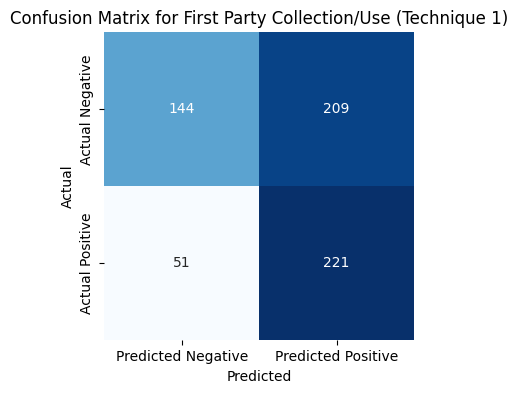


Plotting confusion matrix for category: Third Party Sharing/Collection


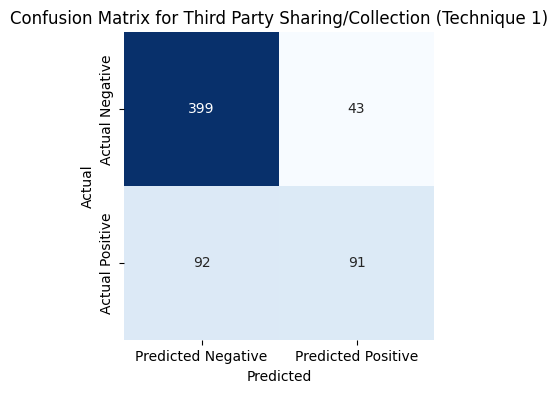


Plotting confusion matrix for category: Other


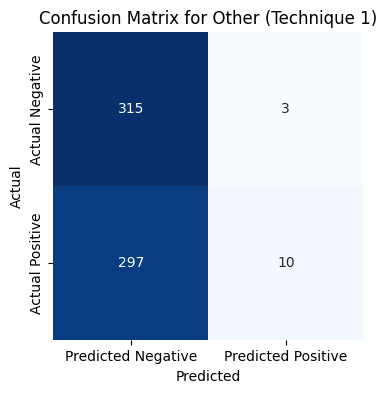


Plotting confusion matrix for category: User Choice/Control


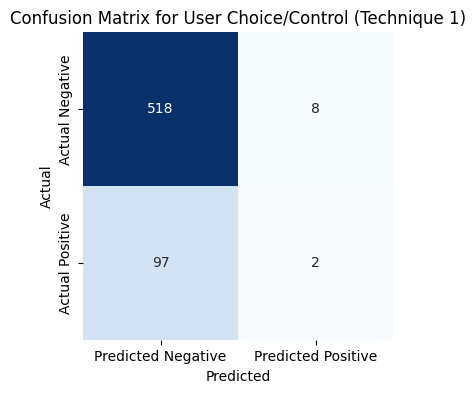


Plotting confusion matrix for category: Do Not Track


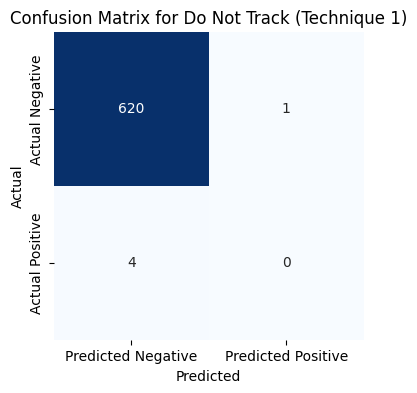


Plotting confusion matrix for category: International and Specific Audiences


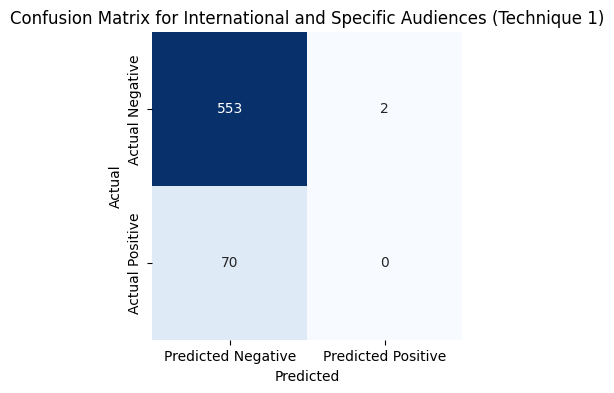


Plotting confusion matrix for category: Data Security


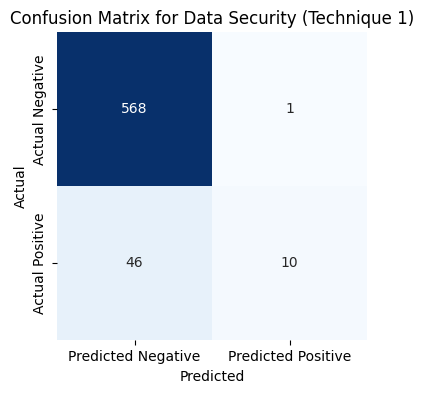


Plotting confusion matrix for category: Policy Change


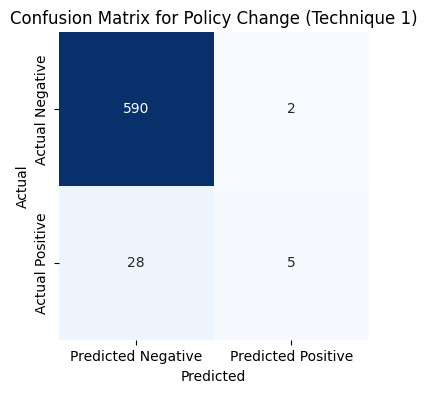


Plotting confusion matrix for category: Data Retention


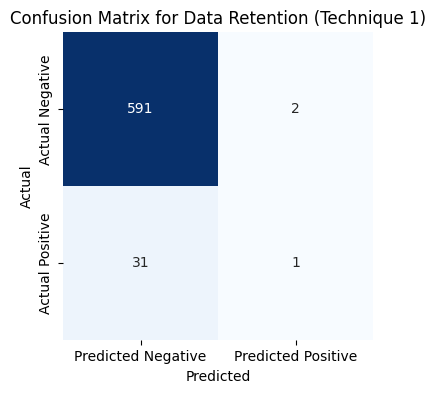


Plotting confusion matrix for category: User Access, Edit and Deletion


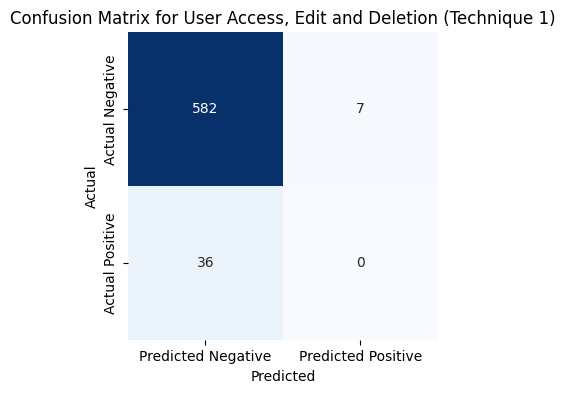


Overall tp: 340
Overall tn: 4880
Overall fp: 278
Overall fn: 752
Overall Precision (Technique 1): 0.5501618122977346
Overall Recall (Technique 1): 0.31135531135531136
Overall F1 Score (Technique 1): 0.3976608187134503
Overall Accuracy (Technique 1): 0.8352
TP 221
TN 144
FP 209
FN 51

TP 91
TN 399
FP 43
FN 92

TP 10
TN 315
FP 3
FN 297

TP 2
TN 518
FP 8
FN 97

TP 0
TN 620
FP 1
FN 4

TP 0
TN 553
FP 2
FN 70

TP 10
TN 568
FP 1
FN 46

TP 5
TN 590
FP 2
FN 28

TP 1
TN 591
FP 2
FN 31

TP 0
TN 582
FP 7
FN 36

Micro Precision: 0.5501618122977346
Micro Recall: 0.31135531135531136
Micro F1 Score: 0.3976608187134503
Micro Accuracy: 0.8352
Macro Precision: 0.4118998691924759
Macro Recall: 0.17238796497537218
Macro F1 Score: 0.19086096892790408
Weighted Precision: 0.5541872715578998
Weighted Recall: 0.31135531135531136
Weighted F1 Score: 0.2984807895402899
Sample Average Precision: 0.54256
Sample Average Recall: 0.36304000000000003
Sample Average F1 Score: 0.4128242424242424

Overall Metrics (Techniq

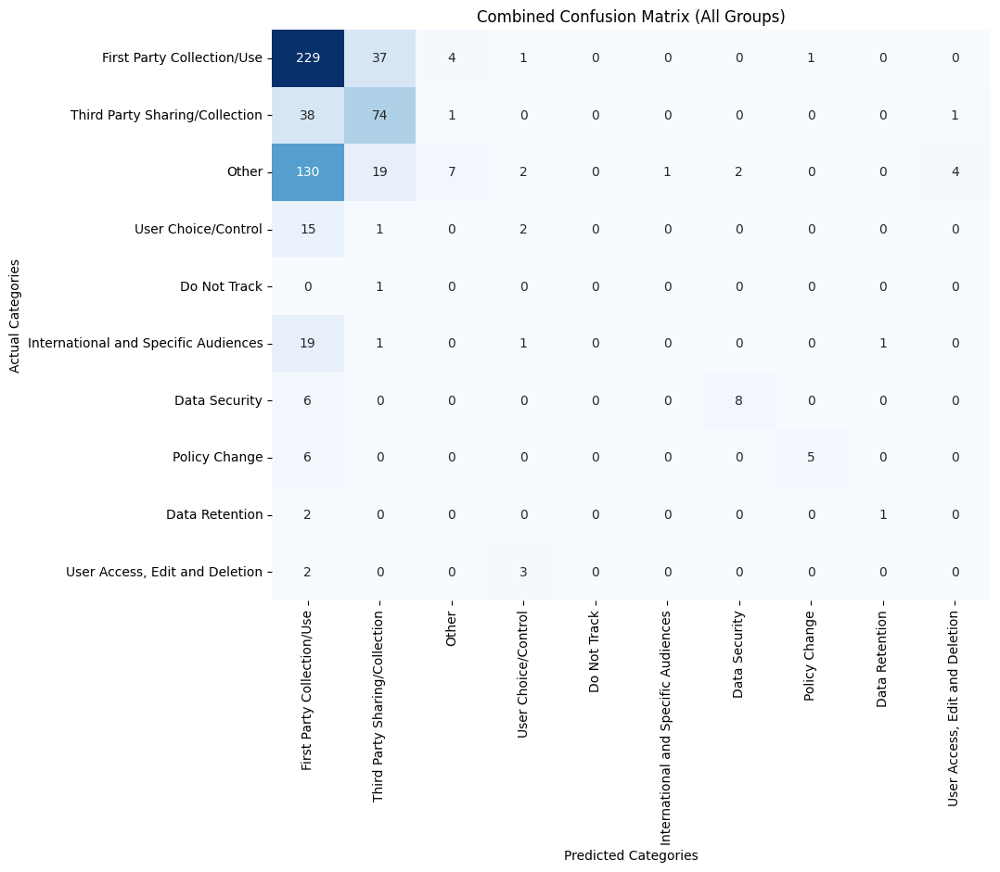


Metrics for Group 1:
Accuracy: 0.8966666666666666
Precision: 0.48333333333333334
Recall: 0.48333333333333334
F1 Score: 0.48333333333333334

Metrics for Group 2:
Accuracy: 0.8747692307692307
Precision: 0.8167202572347267
Recall: 0.634207240948814
F1 Score: 0.713984539704849

Confusion Matrices for Group 1:


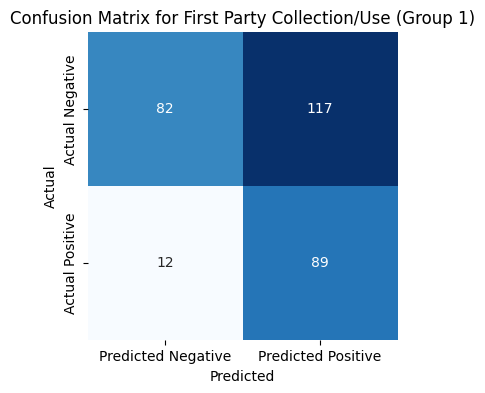

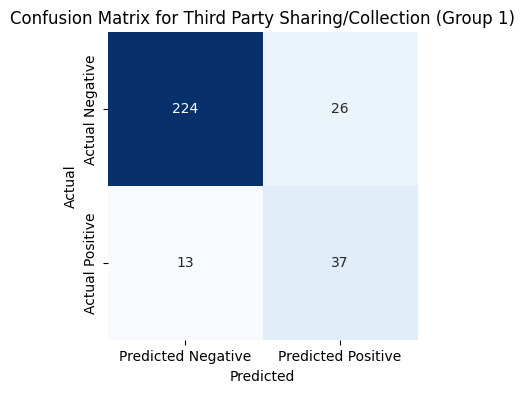

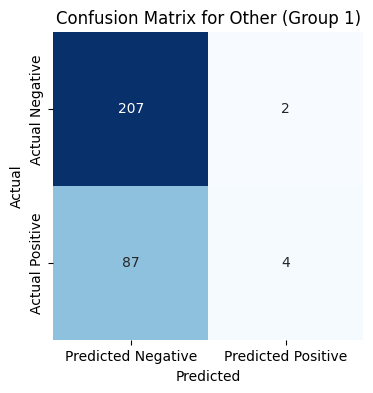

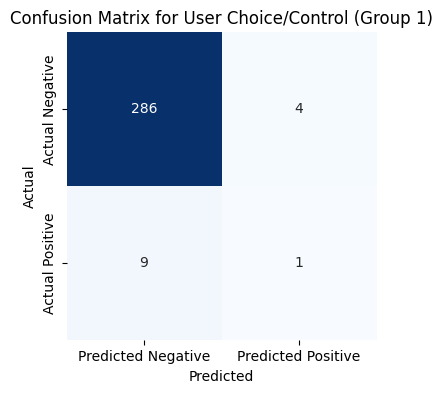

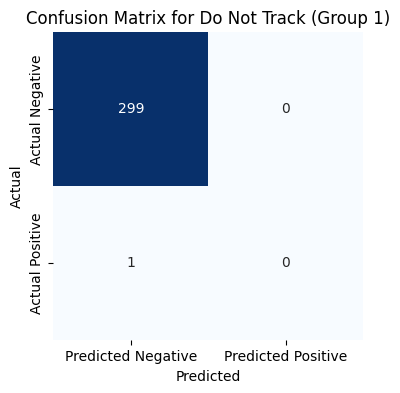

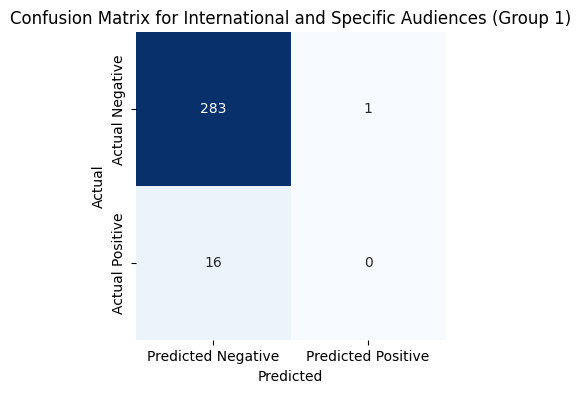

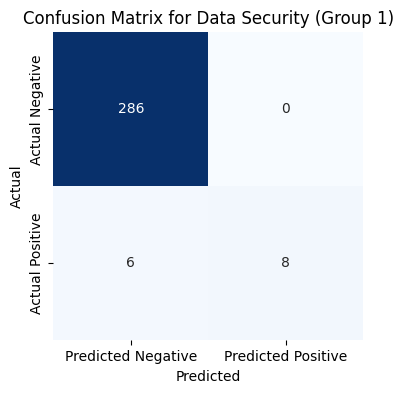

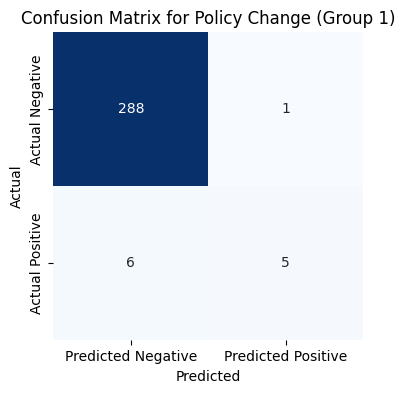

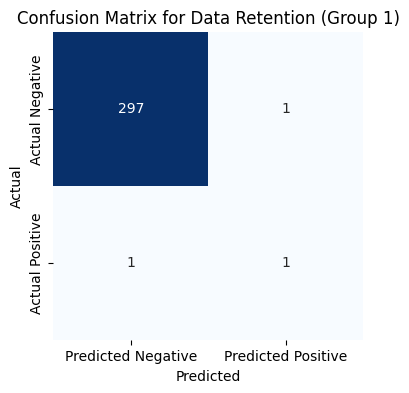

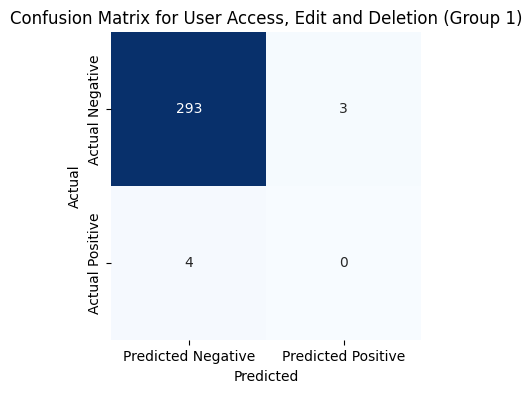


Confusion Matrices for Group 2:


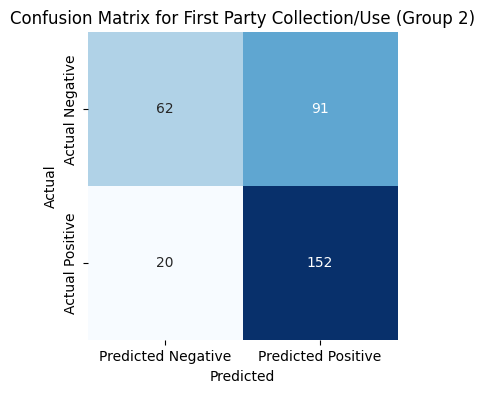

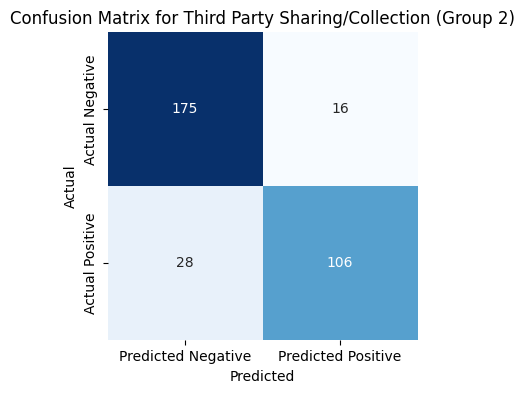

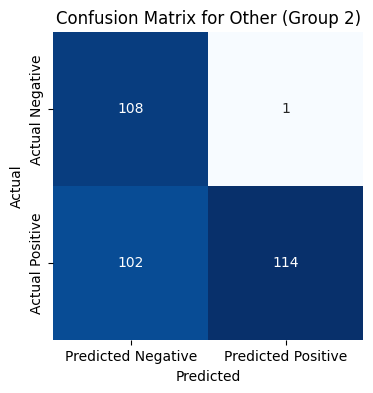

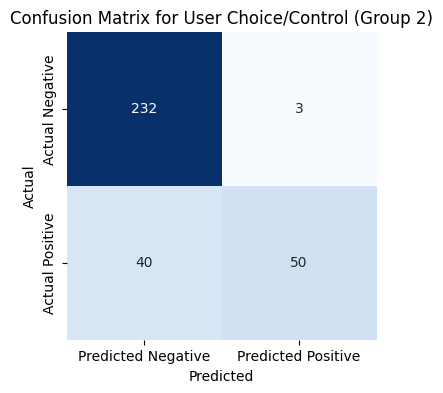

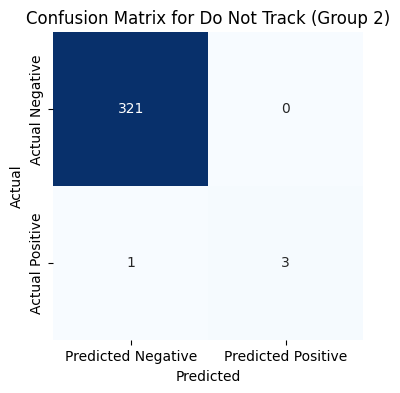

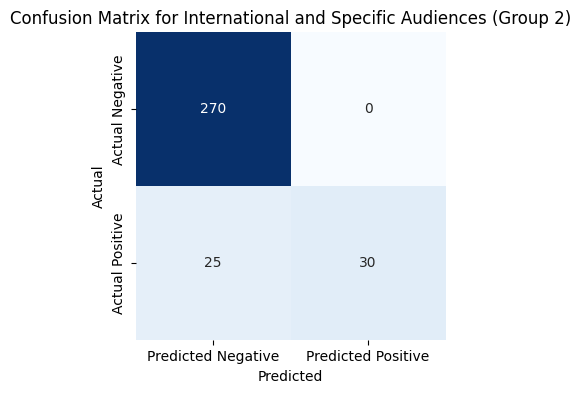

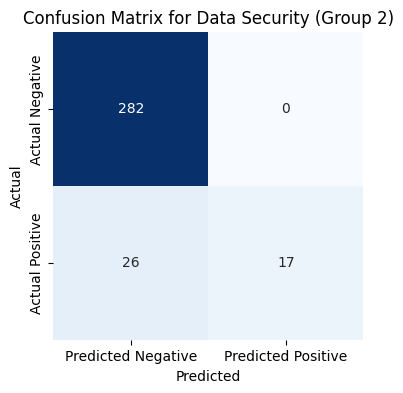

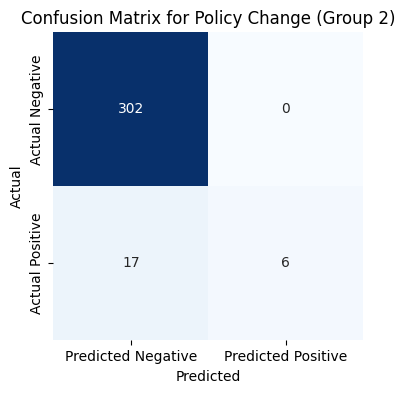

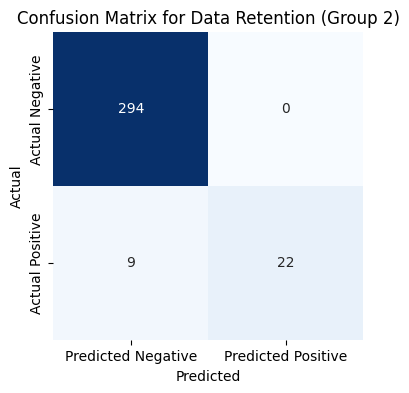

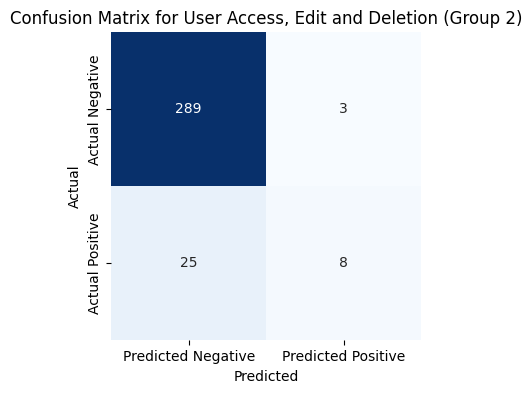


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.88528
Overall Precision: 0.7082429501084598
Overall Recall: 0.5930971843778383
Overall F1 Score: 0.6455758774097874
Combined Metrics -> Accuracy: 0.88528, Precision: 0.7082429501084598, Recall: 0.5930971843778383, F1: 0.6455758774097874

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


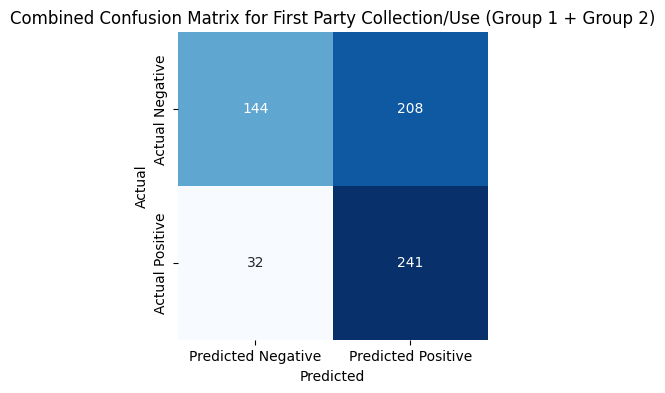


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 241, FP: 208, FN: 32, TN: 144


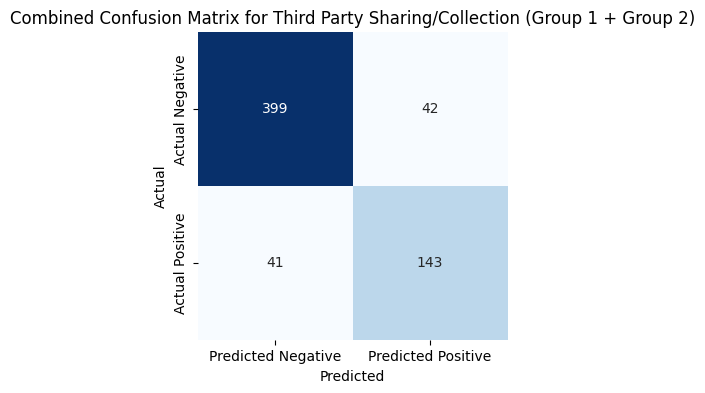


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 143, FP: 42, FN: 41, TN: 399


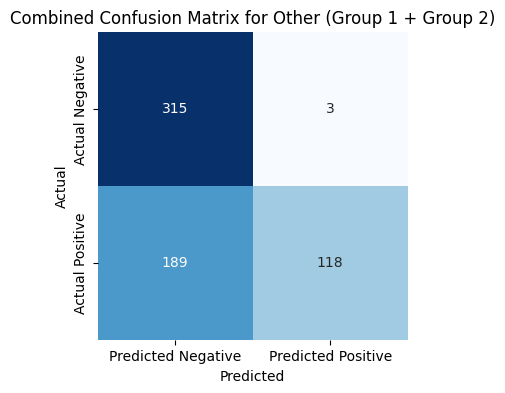


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 118, FP: 3, FN: 189, TN: 315


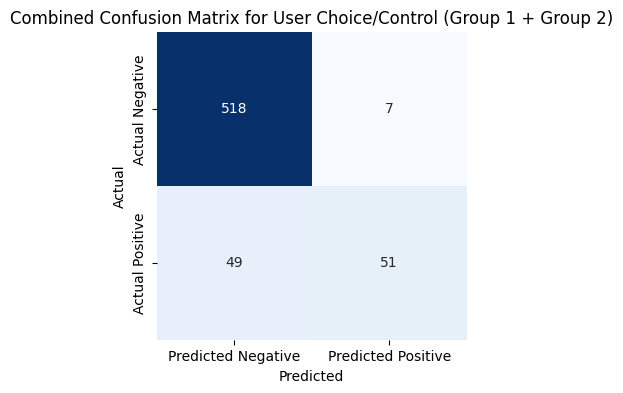


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 51, FP: 7, FN: 49, TN: 518


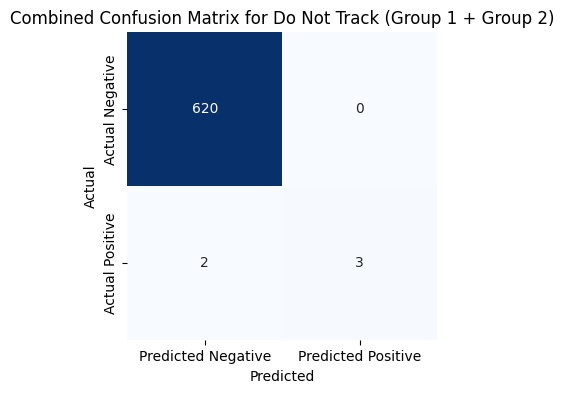


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 3, FP: 0, FN: 2, TN: 620


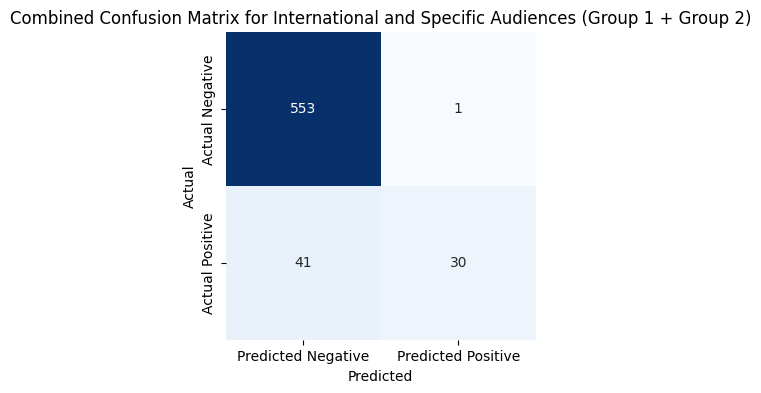


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 30, FP: 1, FN: 41, TN: 553


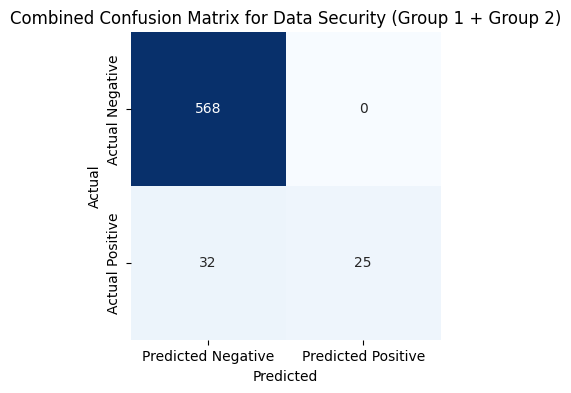


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 25, FP: 0, FN: 32, TN: 568


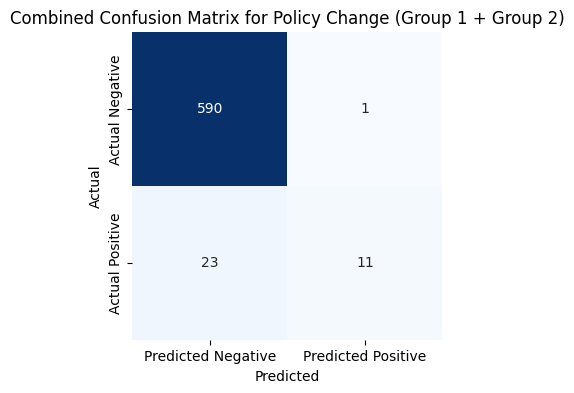


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 11, FP: 1, FN: 23, TN: 590


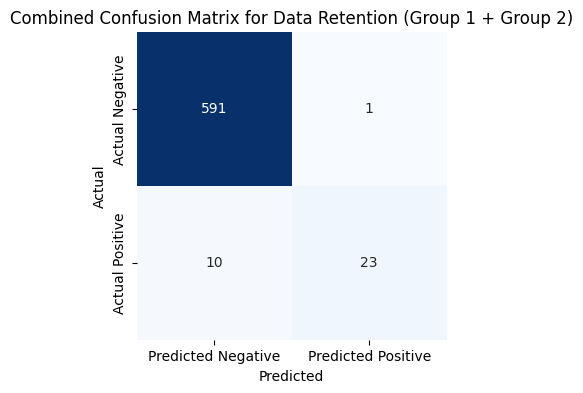


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 23, FP: 1, FN: 10, TN: 591


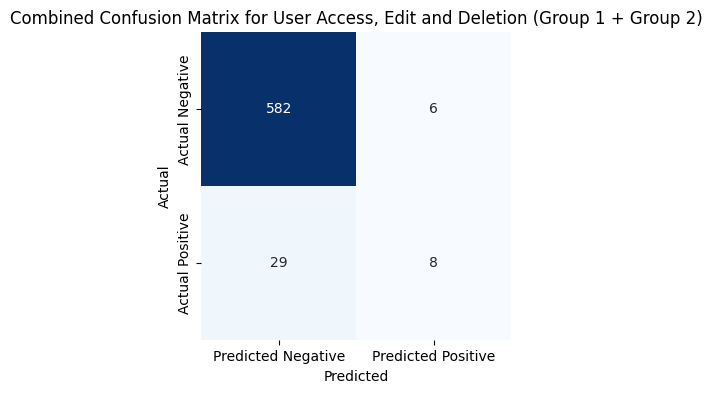


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 8, FP: 6, FN: 29, TN: 582
New tokens list: [608, 73, 127, 108, 60, 71, 79, 78, 56, 59, 83, 69, 84, 69, 38, 74, 55, 66, 53, 147, 269, 133, 104, 131, 62, 109, 134, 89, 67, 65, 786, 946, 126, 67, 69, 105, 103, 370, 60, 64, 76, 95, 60, 62, 115, 80, 73, 61, 35, 58, 49, 68, 78, 46, 110, 80, 32, 58, 60, 595, 108, 72, 68, 64, 50, 86, 124, 77, 83, 77, 85, 84, 91, 66, 84, 63, 47, 68, 71, 54, 55, 104, 69, 97, 76, 86, 112, 67, 81, 55, 71, 88, 1272, 72, 109, 109, 61, 81, 56, 87, 69, 59, 68, 68, 67, 86, 61, 50, 84, 57, 79, 85, 61, 91, 86, 91, 85, 54, 83, 94, 108, 72, 55, 6, 60, 55, 69, 127, 75, 108, 87, 69, 78, 69, 87, 61, 50, 39, 82, 72, 67, 55, 76, 59, 78, 89, 347, 78, 58, 56, 141, 1125, 103, 98, 85, 71, 105, 52, 96, 64, 6, 70, 76, 43, 64, 83, 71, 86, 109, 80, 68, 83, 70, 71, 88, 69, 71, 91, 65, 159, 78, 590, 81, 79, 1077, 70, 81, 112, 94, 79, 87, 109, 79, 59, 71, 173, 61, 42, 78, 72, 77, 45, 78, 74, 126, 46, 69, 

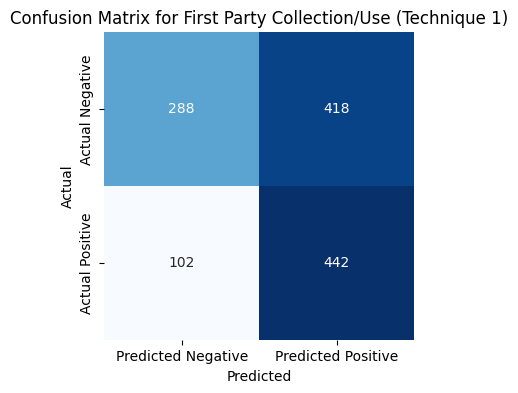


Plotting confusion matrix for category: Third Party Sharing/Collection


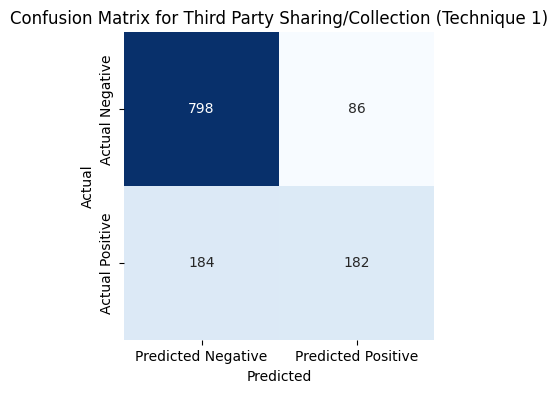


Plotting confusion matrix for category: Other


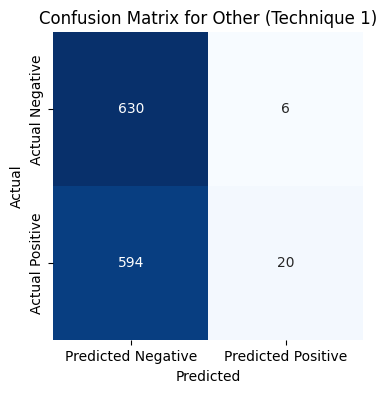


Plotting confusion matrix for category: User Choice/Control


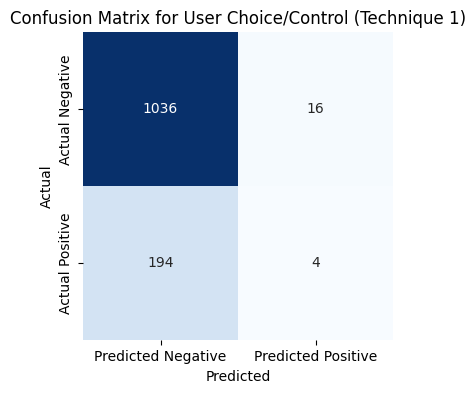


Plotting confusion matrix for category: Do Not Track


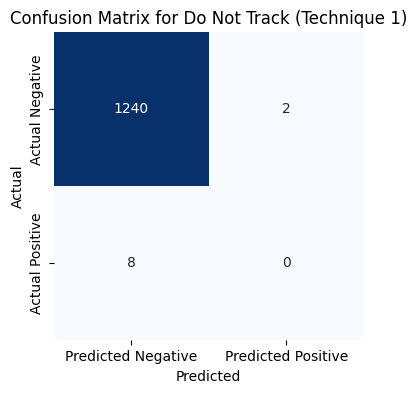


Plotting confusion matrix for category: International and Specific Audiences


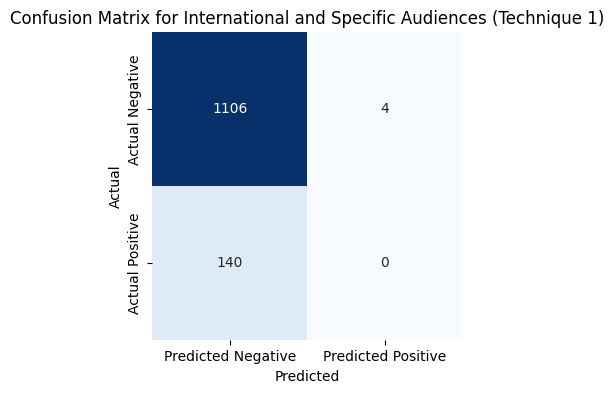


Plotting confusion matrix for category: Data Security


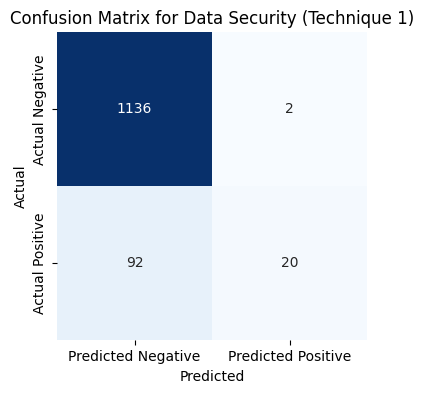


Plotting confusion matrix for category: Policy Change


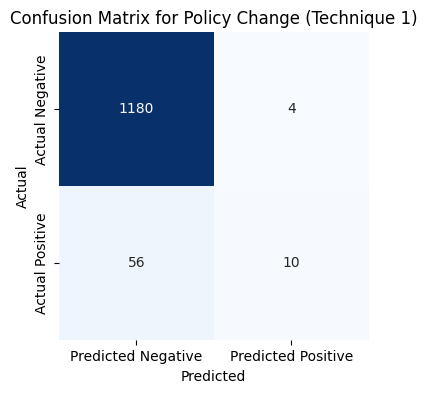


Plotting confusion matrix for category: Data Retention


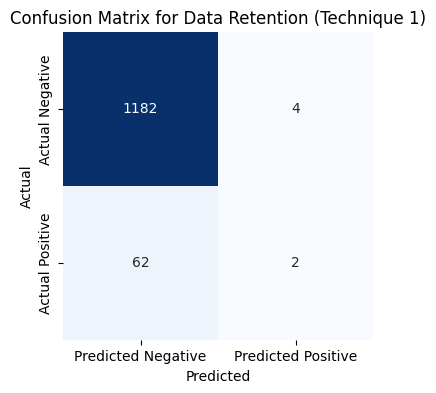


Plotting confusion matrix for category: User Access, Edit and Deletion


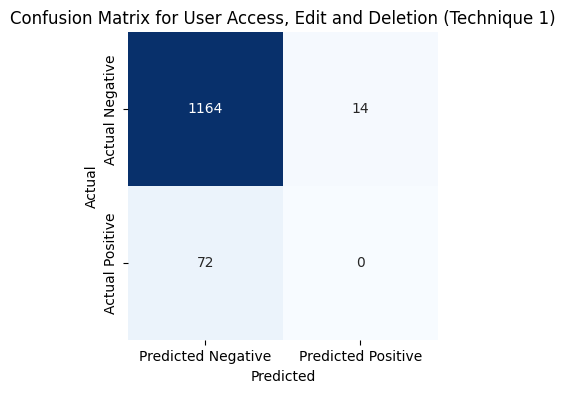


Overall tp: 680
Overall tn: 9760
Overall fp: 556
Overall fn: 1504
Overall Precision (Technique 1): 0.5501618122977346
Overall Recall (Technique 1): 0.31135531135531136
Overall F1 Score (Technique 1): 0.3976608187134503
Overall Accuracy (Technique 1): 0.8352
TP 442
TN 288
FP 418
FN 102

TP 182
TN 798
FP 86
FN 184

TP 20
TN 630
FP 6
FN 594

TP 4
TN 1036
FP 16
FN 194

TP 0
TN 1240
FP 2
FN 8

TP 0
TN 1106
FP 4
FN 140

TP 20
TN 1136
FP 2
FN 92

TP 10
TN 1180
FP 4
FN 56

TP 2
TN 1182
FP 4
FN 62

TP 0
TN 1164
FP 14
FN 72

Micro Precision: 0.5501618122977346
Micro Recall: 0.31135531135531136
Micro F1 Score: 0.3976608187134503
Micro Accuracy: 0.8352
Macro Precision: 0.4118998691924759
Macro Recall: 0.17238796497537218
Macro F1 Score: 0.19086096892790408
Weighted Precision: 0.5541872715578998
Weighted Recall: 0.31135531135531136
Weighted F1 Score: 0.2984807895402899
Sample Average Precision: 0.54256
Sample Average Recall: 0.36304000000000003
Sample Average F1 Score: 0.4128242424242424

Overall 

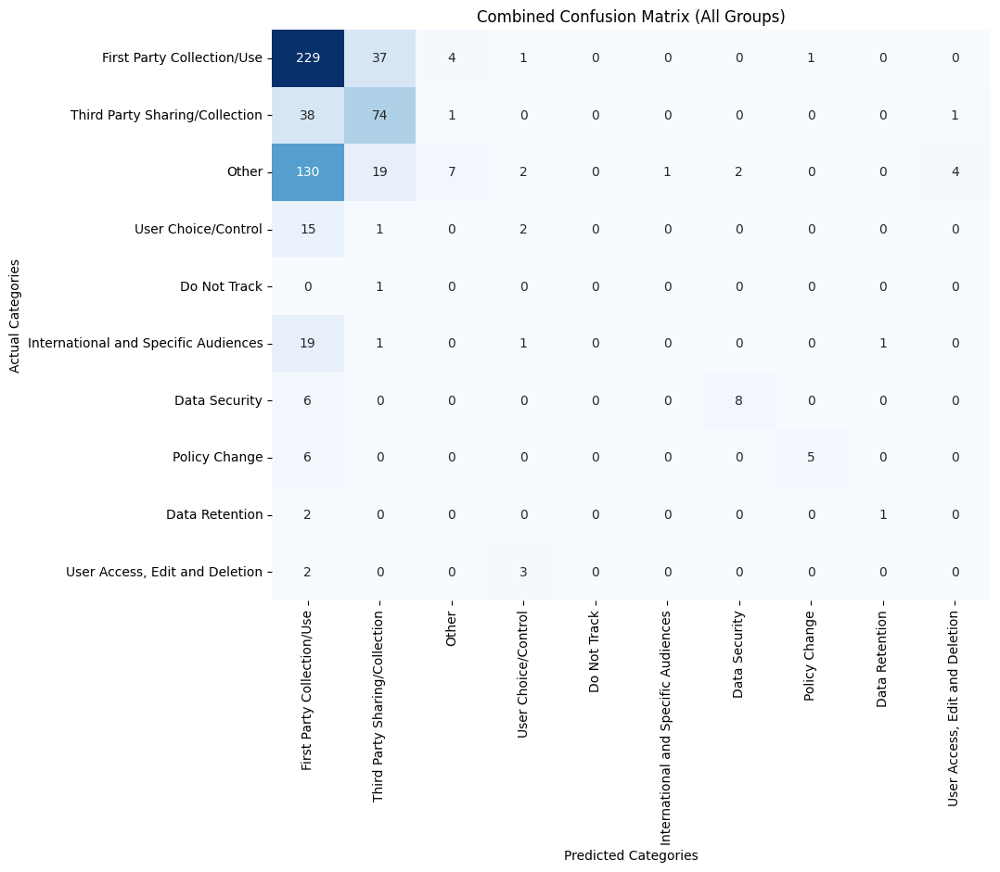


Metrics for Group 1:
Accuracy: 0.8966666666666666
Precision: 0.48333333333333334
Recall: 0.48333333333333334
F1 Score: 0.48333333333333334

Metrics for Group 2:
Accuracy: 0.8747692307692307
Precision: 0.8167202572347267
Recall: 0.634207240948814
F1 Score: 0.713984539704849

Confusion Matrices for Group 1:


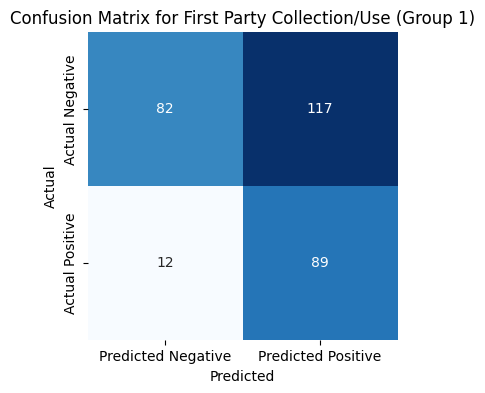

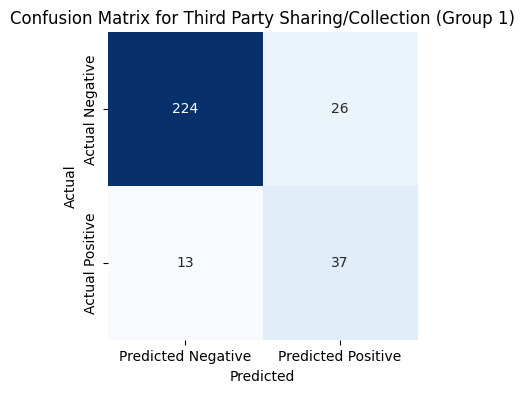

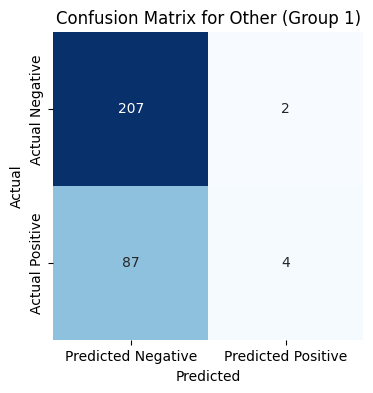

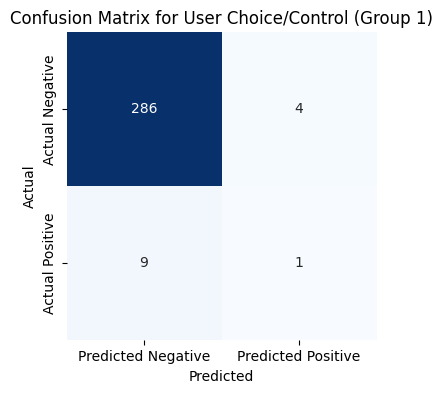

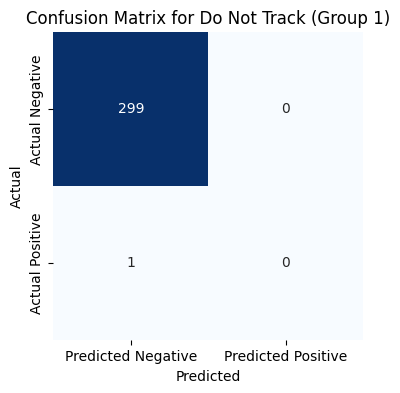

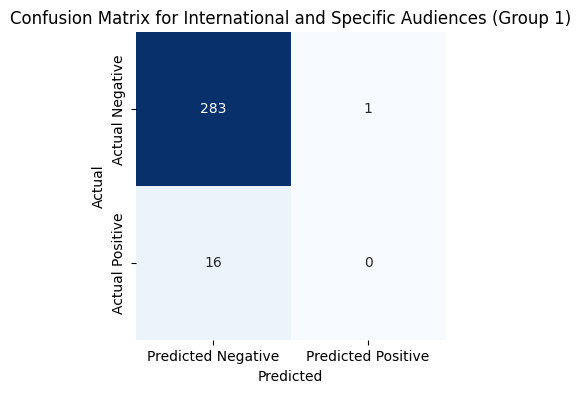

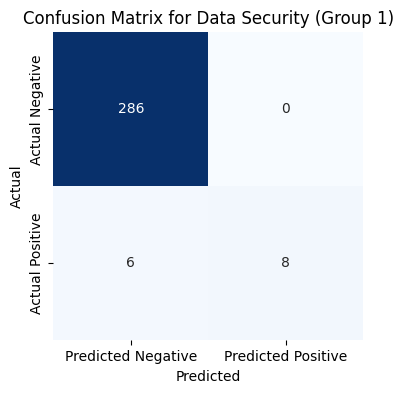

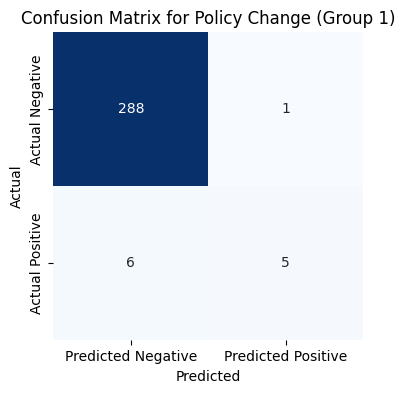

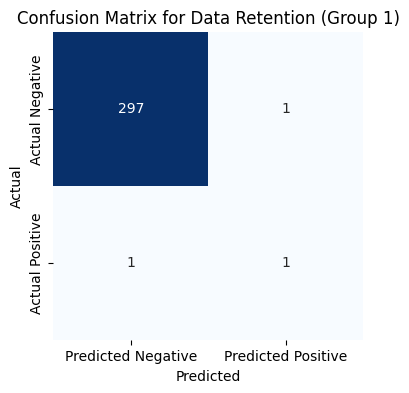

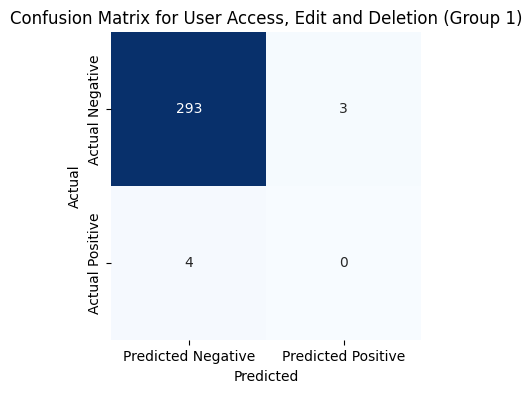


Confusion Matrices for Group 2:


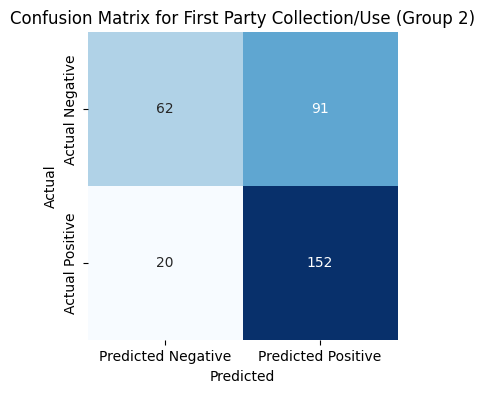

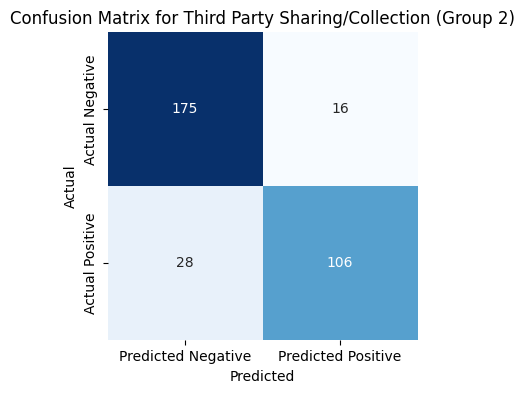

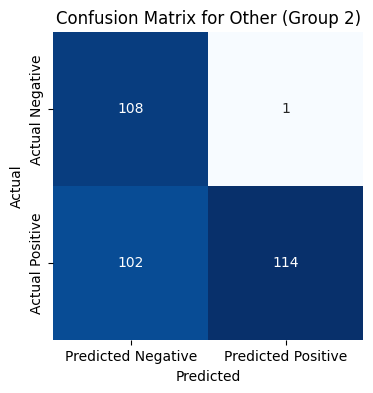

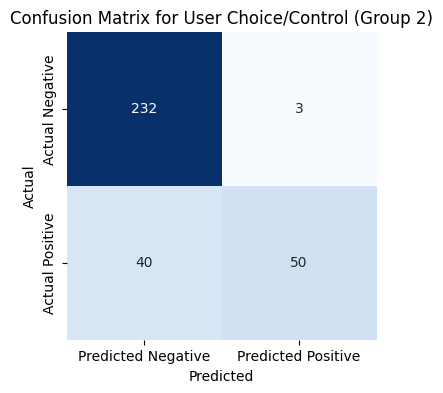

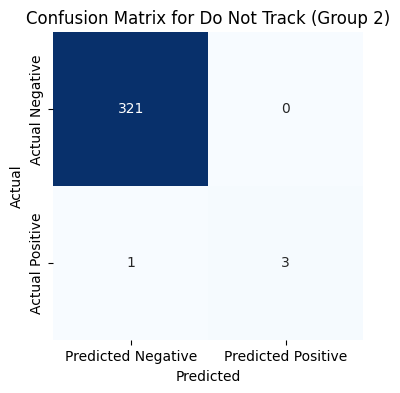

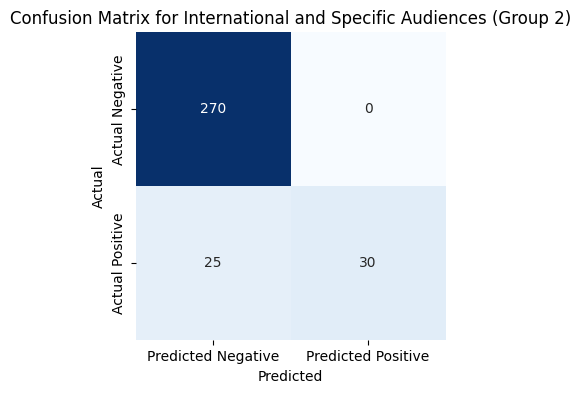

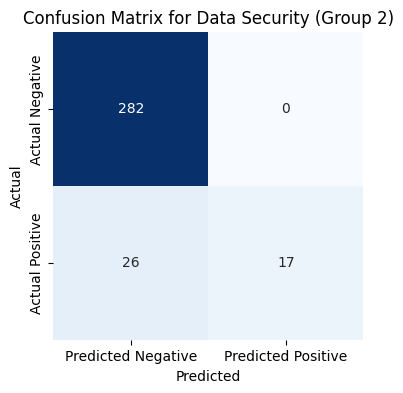

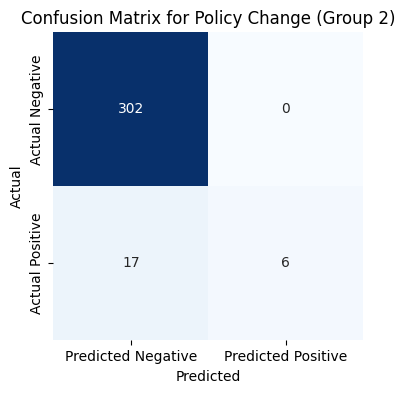

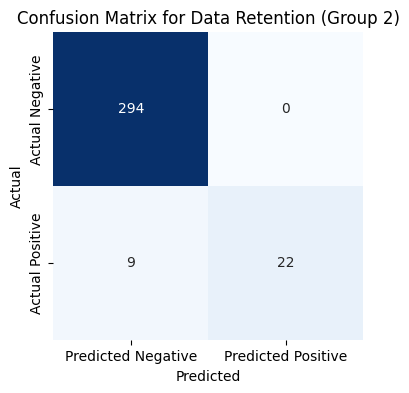

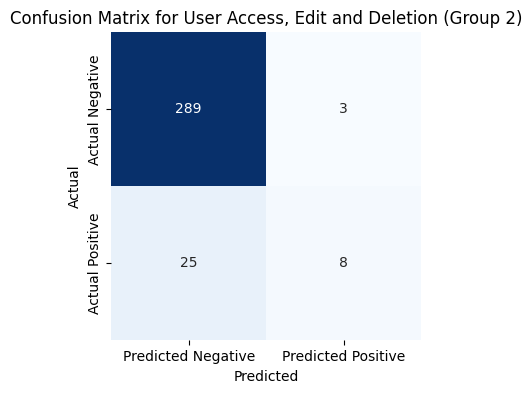


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.88528
Overall Precision: 0.7082429501084598
Overall Recall: 0.5930971843778383
Overall F1 Score: 0.6455758774097874
Combined Metrics -> Accuracy: 0.88528, Precision: 0.7082429501084598, Recall: 0.5930971843778383, F1: 0.6455758774097874

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


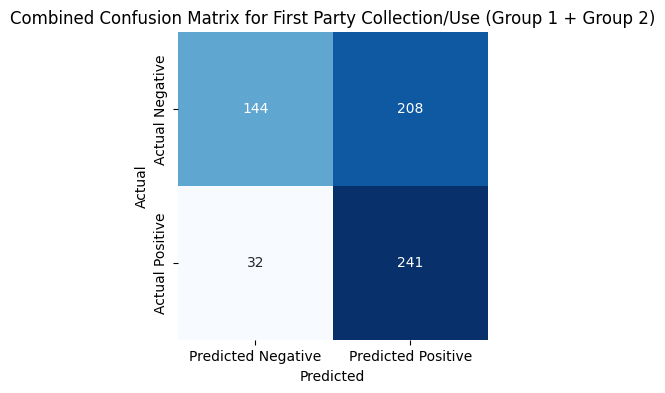


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 241, FP: 208, FN: 32, TN: 144


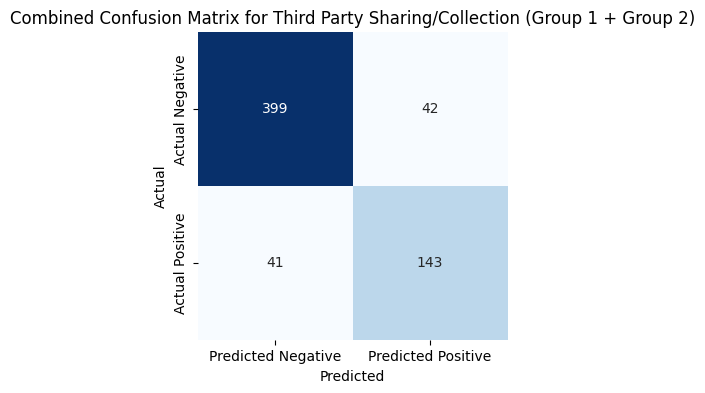


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 143, FP: 42, FN: 41, TN: 399


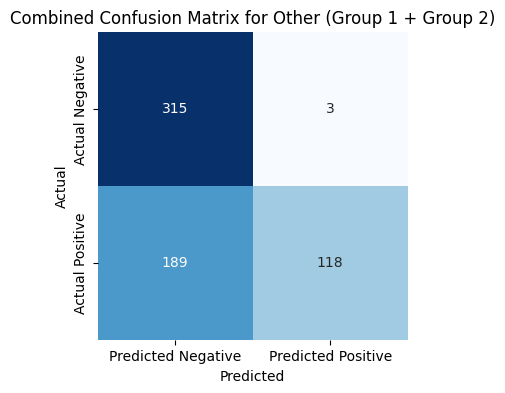


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 118, FP: 3, FN: 189, TN: 315


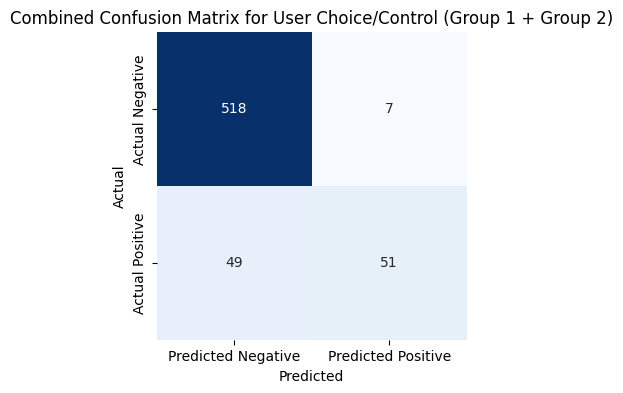


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 51, FP: 7, FN: 49, TN: 518


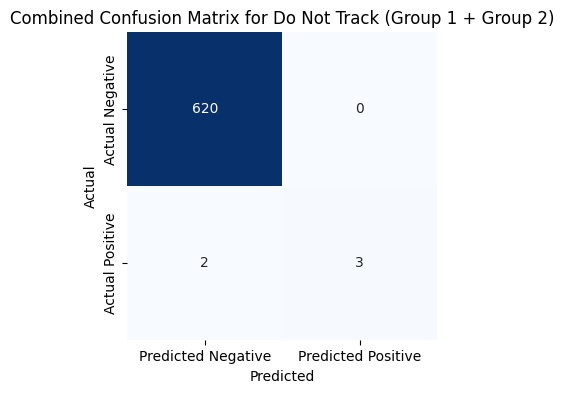


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 3, FP: 0, FN: 2, TN: 620


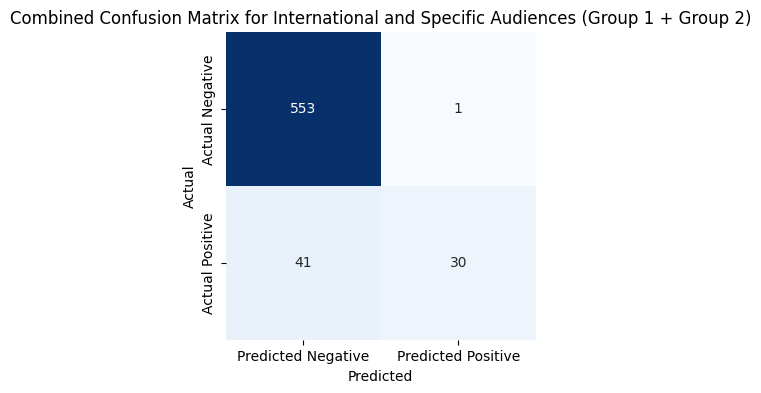


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 30, FP: 1, FN: 41, TN: 553


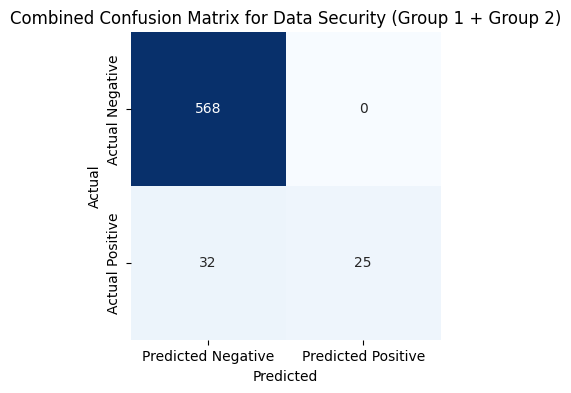


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 25, FP: 0, FN: 32, TN: 568


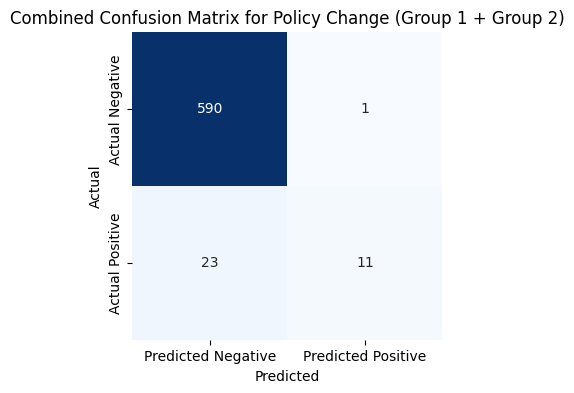


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 11, FP: 1, FN: 23, TN: 590


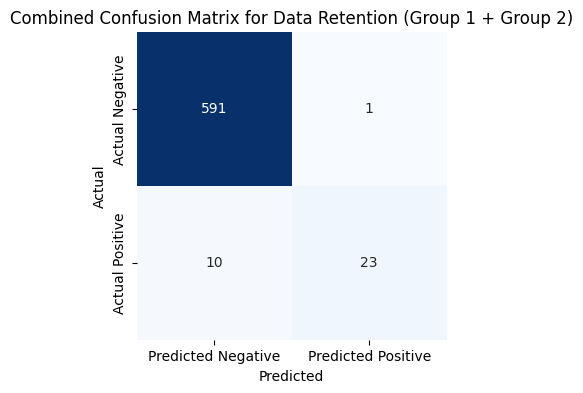


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 23, FP: 1, FN: 10, TN: 591


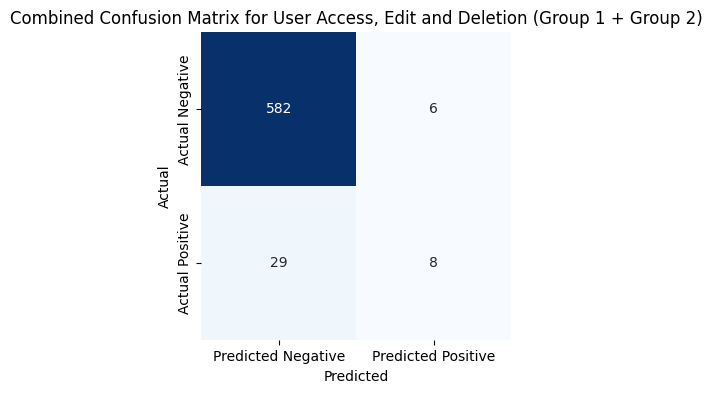


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 8, FP: 6, FN: 29, TN: 582


{'G1': {'accuracy': 0.8966666666666666,
  'precision': 0.48333333333333334,
  'recall': 0.48333333333333334,
  'f1': 0.48333333333333334,
  'category_results': {'First Party Collection/Use': {'TP': 89,
    'FP': 117,
    'TN': 82,
    'FN': 12},
   'Third Party Sharing/Collection': {'TP': 37, 'FP': 26, 'TN': 224, 'FN': 13},
   'Other': {'TP': 4, 'FP': 2, 'TN': 207, 'FN': 87},
   'User Choice/Control': {'TP': 1, 'FP': 4, 'TN': 286, 'FN': 9},
   'Do Not Track': {'TP': 0, 'FP': 0, 'TN': 299, 'FN': 1},
   'International and Specific Audiences': {'TP': 0,
    'FP': 1,
    'TN': 283,
    'FN': 16},
   'Data Security': {'TP': 8, 'FP': 0, 'TN': 286, 'FN': 6},
   'Policy Change': {'TP': 5, 'FP': 1, 'TN': 288, 'FN': 6},
   'Data Retention': {'TP': 1, 'FP': 1, 'TN': 297, 'FN': 1},
   'User Access, Edit and Deletion': {'TP': 0, 'FP': 3, 'TN': 293, 'FN': 4}}},
 'G2': {'accuracy': 0.8747692307692307,
  'precision': 0.8167202572347267,
  'recall': 0.634207240948814,
  'f1': 0.713984539704849,
  'cate

In [8]:
#Prompt 3 - Non Fine tuned - Base Llama 2 Model 

from util.main import PrivacyPolicyClassifier
from util.generating_cm import compute_grouped_metrics,compute_confusion_matrix_technique1 

# Create an instance of PrivacyPolicyClassifier
classifier = PrivacyPolicyClassifier(hf_token = token)

# Define the prompt template
prompt_template_3 = ("You are a highly specialized privacy policy classifier."
                   "As an expert in categorizing privacy policy texts your task is to accurately classify the provided text into the most suitable category."
                   "Additionally, ensure you consider whether multiple categories apply when necessary. Be thorough, and ensure that the output is clear and concise."
                   "Please use your expertise to categorize the provided privacy policy text into the following categories: First Party Collection/Use, Third Party Sharing/Collection, Other, User Choice/Control, Do Not Track, International and Specific Audiences, Data Security, Policy Change, Data Retention, User Access, Edit and Deletion.")



p3b11 = classifier.predict_and_evaluate(
    prompt_template=prompt_template_3, 
    test_data_path=test_data_path,
    num_test_data=num_entries,
    model_type=model_type,
    prompt_number=3
)

compute_confusion_matrix_technique1(p3b11)

# Compute grouped confusion matrices (Group 1 and Group 2)
compute_grouped_metrics(p3b11)

/home/bhavani/GA Work/Fine_Tuning_and_ChatBot_Creation/lib/python3.10/site-packages/transformers/models/auto/tokenization_auto.py:796: FutureWarning: The `use_auth_token` argument is deprecated and will be removed in v5 of Transformers. Please use `token` instead.
  warnings.warn(
Loading checkpoint shards: 100%|██████████| 2/2 [00:02<00:00,  1.40s/it]
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


Generated new tokens:First Party Collection/Use

Explanation: BWW collects personal information directly from users through the Site(s), including name, email address, and phone number. This information is used to create a user profile, which is used to personalize the user's experience on the Site(s) and to send promotional emails.

Category: Third Party Sharing/Collection

Explanation: BWW may share personal information with third parties, including franchisees, marketing agencies, and affiliated contractors, for the purpose of analyzing user behavior and preferences, and for sending promotional emails.

Category: Other

Explanation: BWW may also collect non-personal information, such as IP addresses and browser types, through the use of cookies and other tracking technologies. This information is used to improve the user experience and to personalize the Site(s).

Category: User Choice/Control

Explanation: Users have the option to opt-out of receiving promotional emails from BWW by

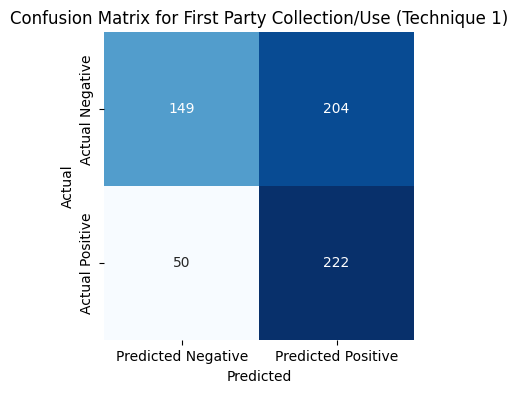


Plotting confusion matrix for category: Third Party Sharing/Collection


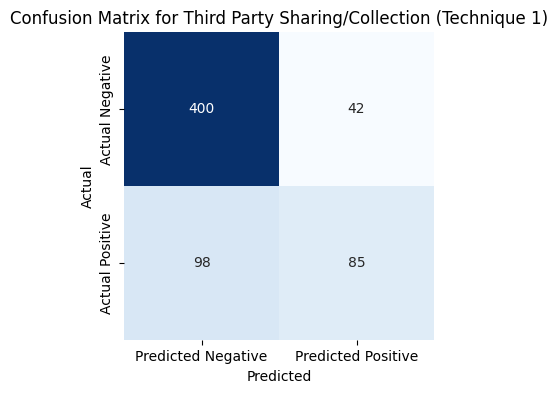


Plotting confusion matrix for category: Other


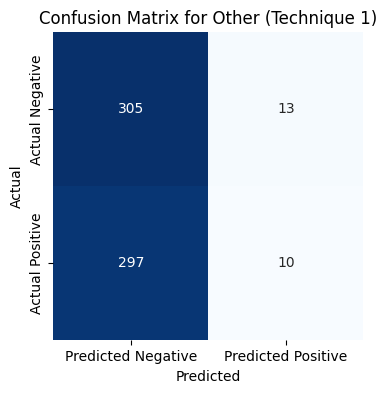


Plotting confusion matrix for category: User Choice/Control


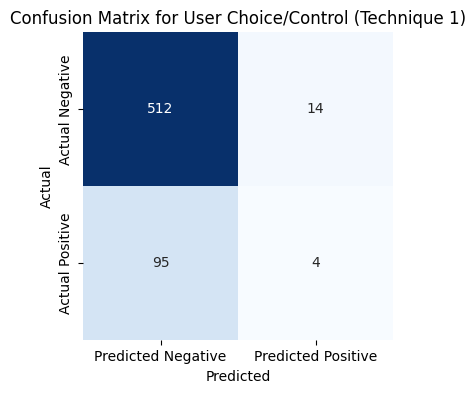


Plotting confusion matrix for category: Do Not Track


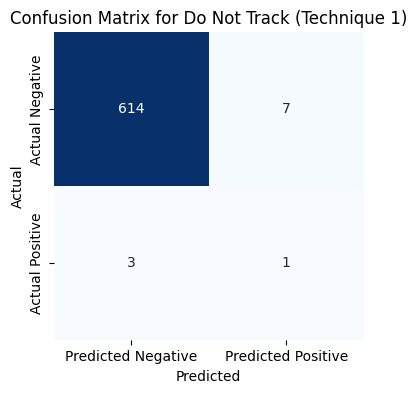


Plotting confusion matrix for category: International and Specific Audiences


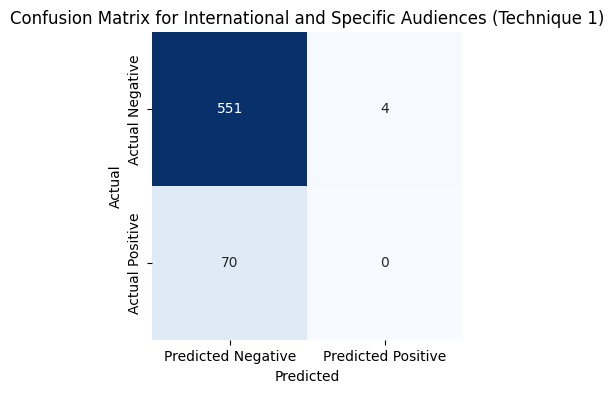


Plotting confusion matrix for category: Data Security


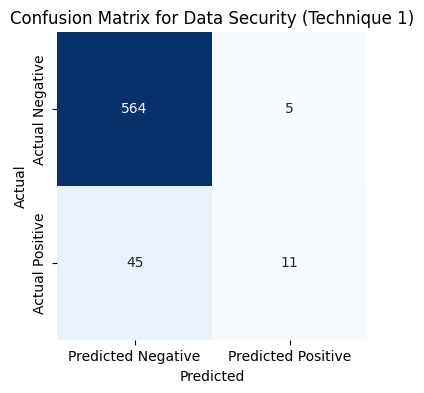


Plotting confusion matrix for category: Policy Change


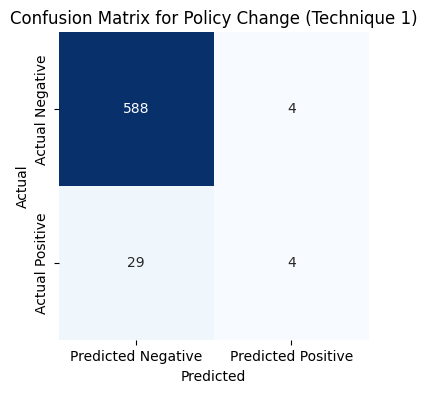


Plotting confusion matrix for category: Data Retention


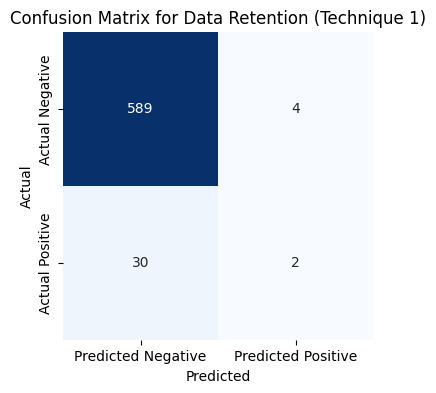


Plotting confusion matrix for category: User Access, Edit and Deletion


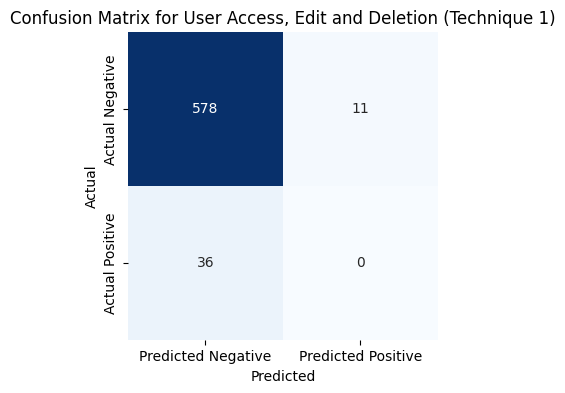


Overall tp: 339
Overall tn: 4850
Overall fp: 308
Overall fn: 753
Overall Precision (Technique 1): 0.5239567233384853
Overall Recall (Technique 1): 0.31043956043956045
Overall F1 Score (Technique 1): 0.3898792409430707
Overall Accuracy (Technique 1): 0.83024
TP 222
TN 149
FP 204
FN 50

TP 85
TN 400
FP 42
FN 98

TP 10
TN 305
FP 13
FN 297

TP 4
TN 512
FP 14
FN 95

TP 1
TN 614
FP 7
FN 3

TP 0
TN 551
FP 4
FN 70

TP 11
TN 564
FP 5
FN 45

TP 4
TN 588
FP 4
FN 29

TP 2
TN 589
FP 4
FN 30

TP 0
TN 578
FP 11
FN 36

Micro Precision: 0.5239567233384853
Micro Recall: 0.31043956043956045
Micro F1 Score: 0.3898792409430707
Micro Accuracy: 0.83024
Macro Precision: 0.3493256263397265
Macro Recall: 0.19837753678521883
Macro F1 Score: 0.2086079708955258
Weighted Precision: 0.44493747378214404
Weighted Recall: 0.31043956043956045
Weighted F1 Score: 0.29884195111008455
Sample Average Precision: 0.5338711111111112
Sample Average Recall: 0.3579377777777778
Sample Average F1 Score: 0.40293494949494946

Overall

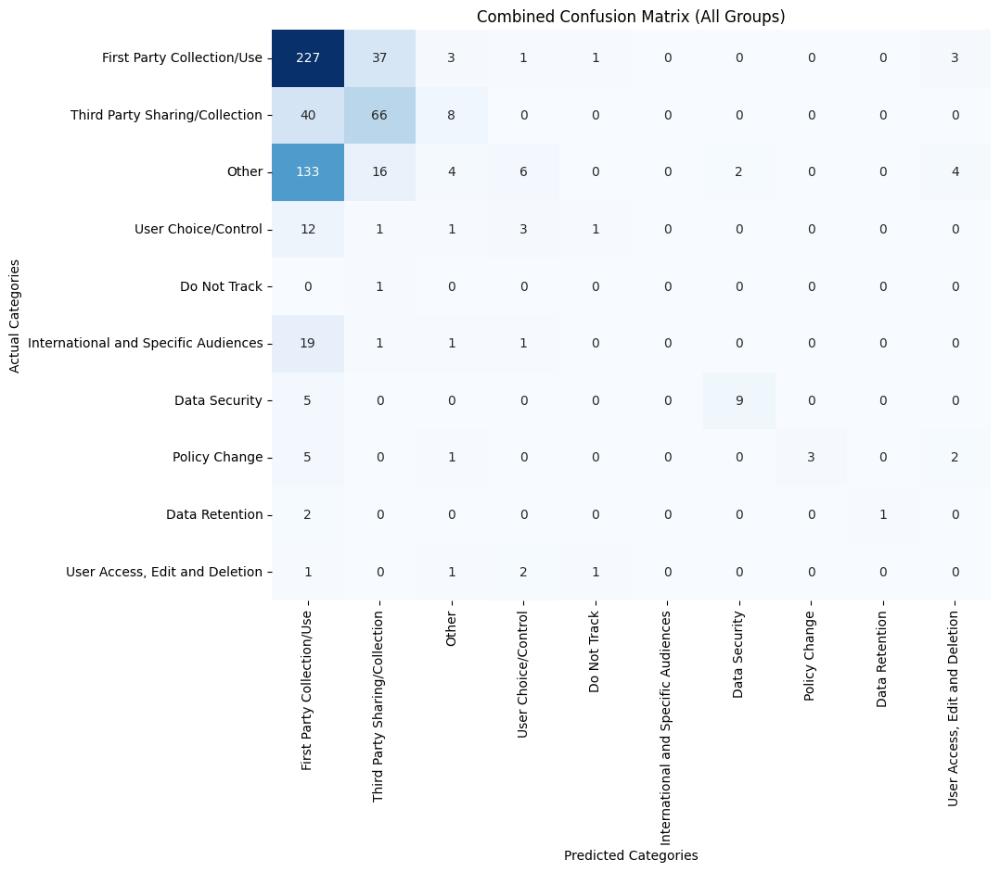


Metrics for Group 1:
Accuracy: 0.8938775510204081
Precision: 0.46938775510204084
Recall: 0.46938775510204084
F1 Score: 0.46938775510204084

Metrics for Group 2:
Accuracy: 0.8809667673716012
Precision: 0.8310911808669657
Recall: 0.6642771804062126
F1 Score: 0.7383798140770252

Confusion Matrices for Group 1:


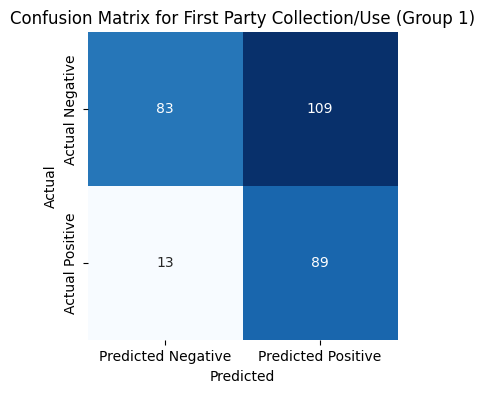

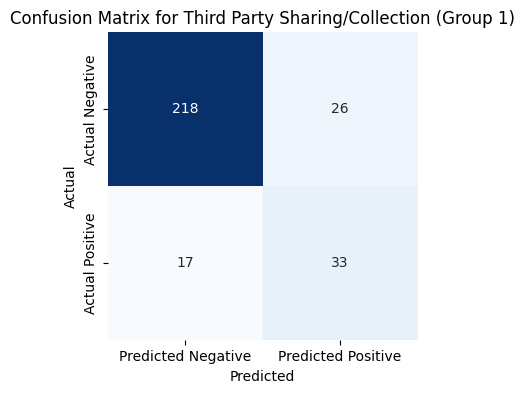

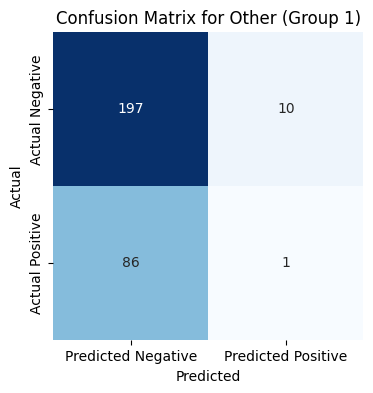

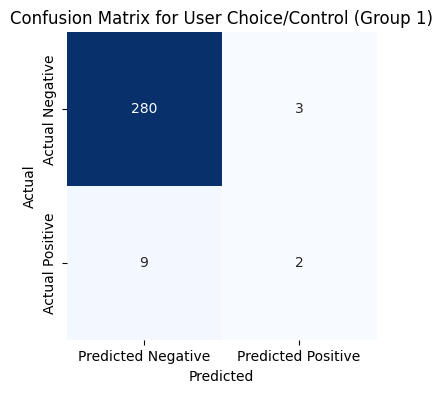

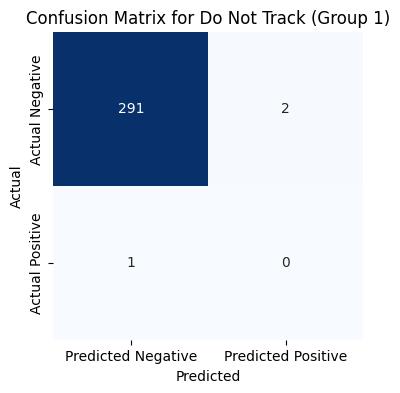

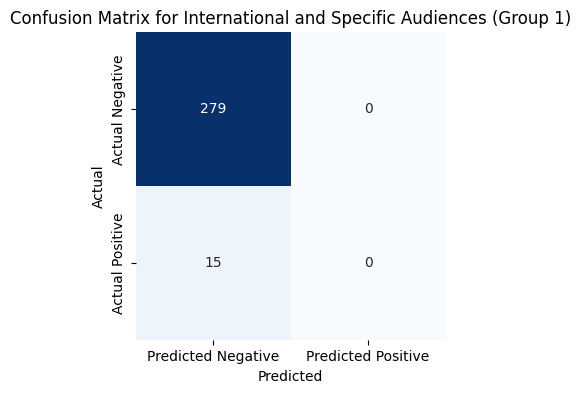

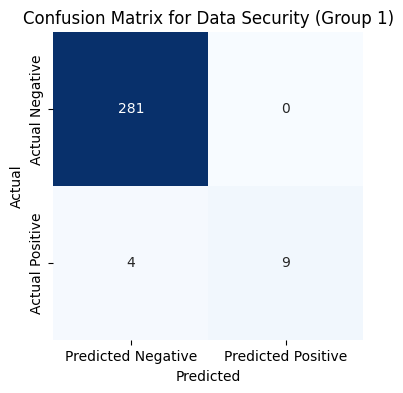

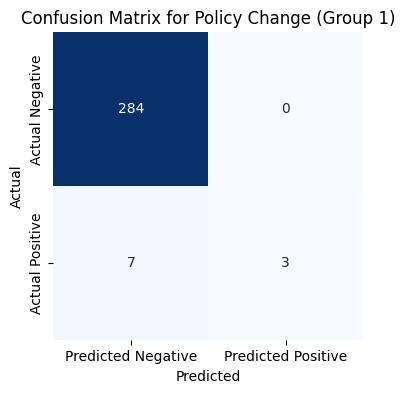

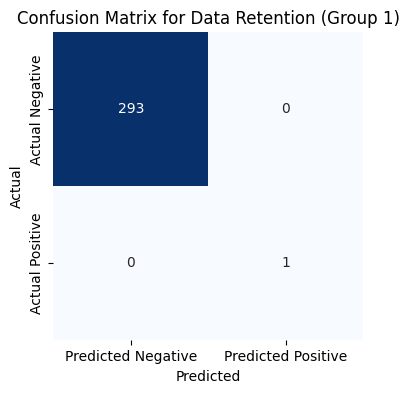

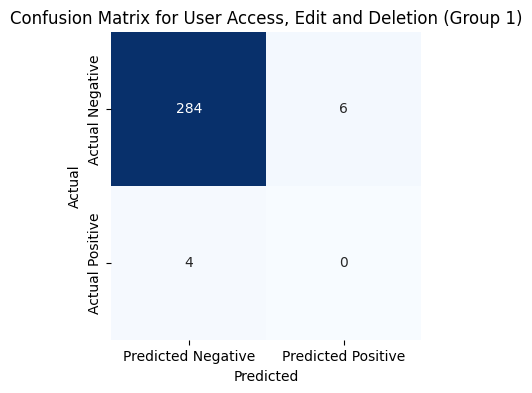


Confusion Matrices for Group 2:


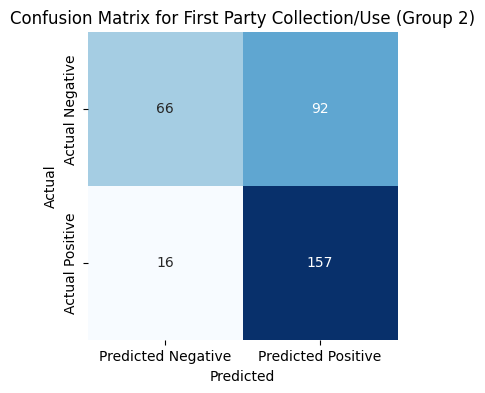

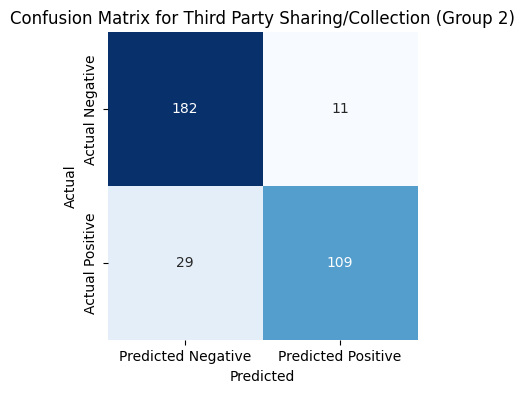

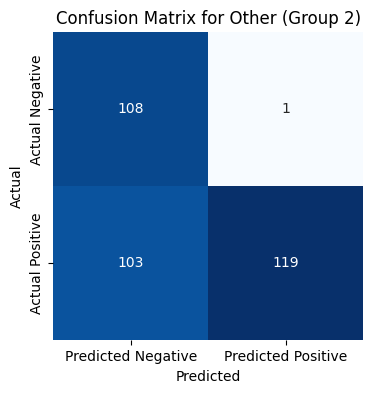

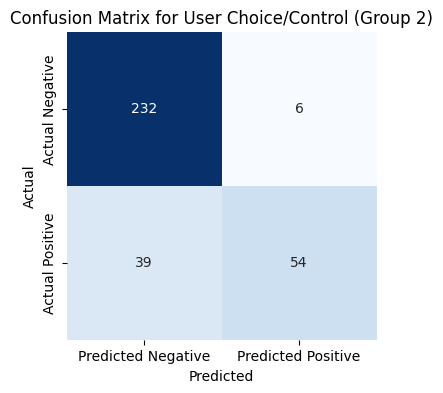

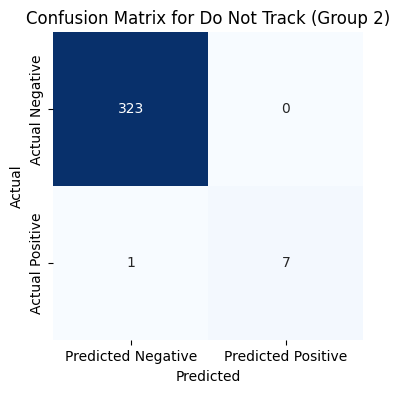

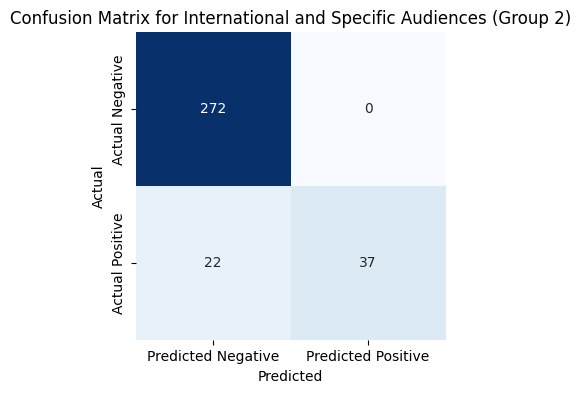

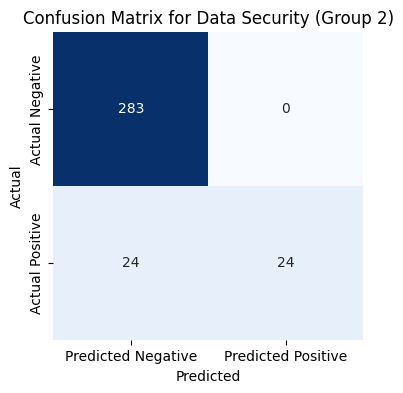

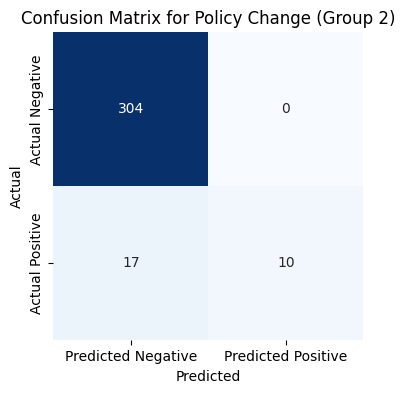

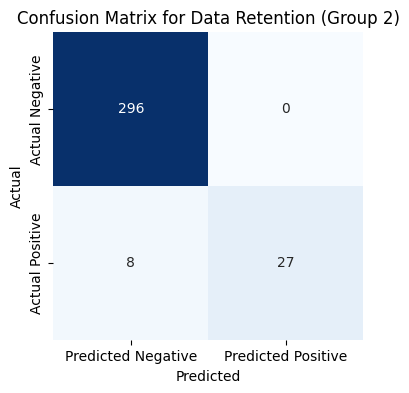

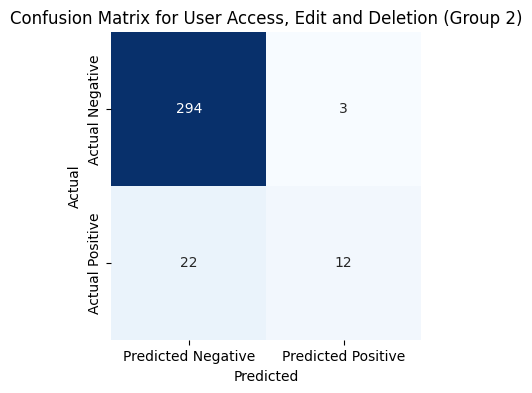


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.88704
Overall Precision: 0.7206645898234684
Overall Recall: 0.6136162687886826
Overall F1 Score: 0.6628462273161414
Combined Metrics -> Accuracy: 0.88704, Precision: 0.7206645898234684, Recall: 0.6136162687886826, F1: 0.6628462273161414

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


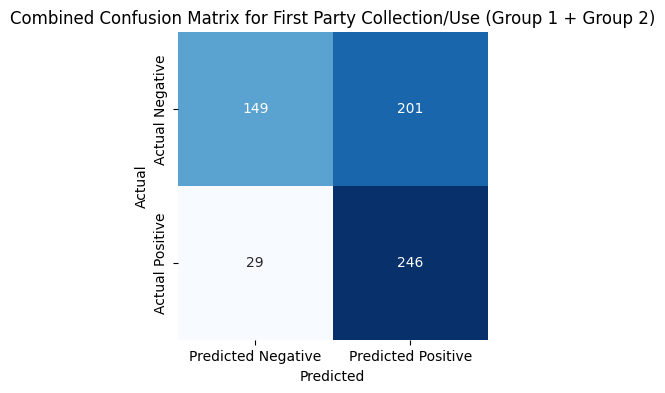


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 246, FP: 201, FN: 29, TN: 149


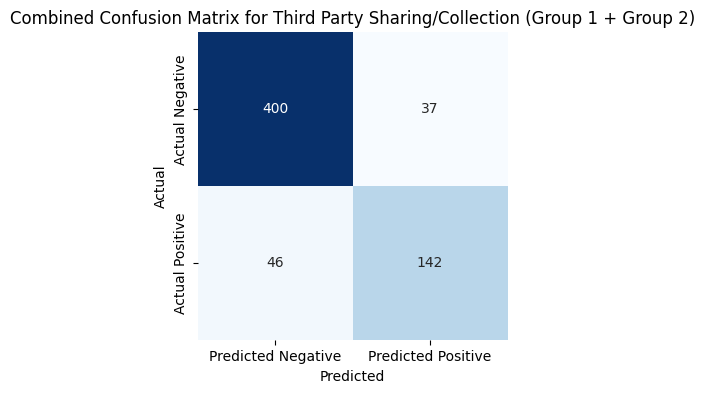


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 142, FP: 37, FN: 46, TN: 400


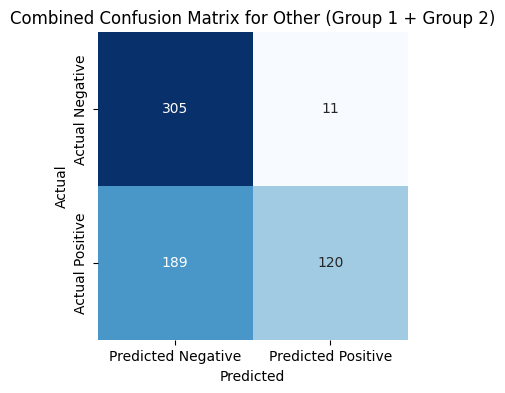


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 120, FP: 11, FN: 189, TN: 305


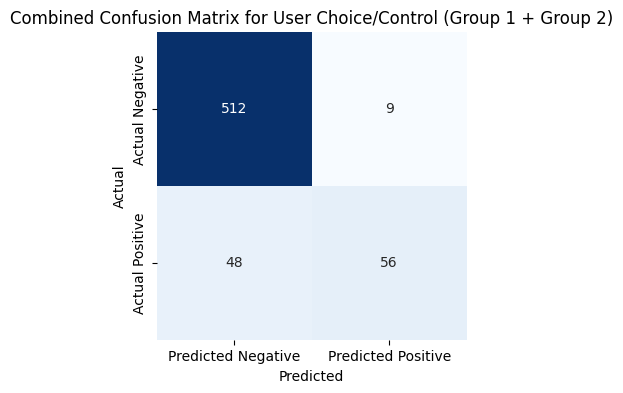


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 56, FP: 9, FN: 48, TN: 512


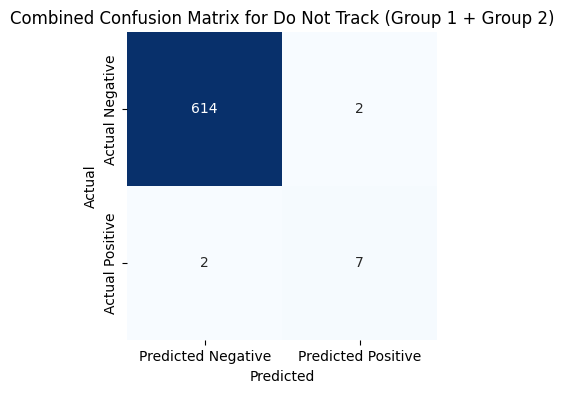


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 7, FP: 2, FN: 2, TN: 614


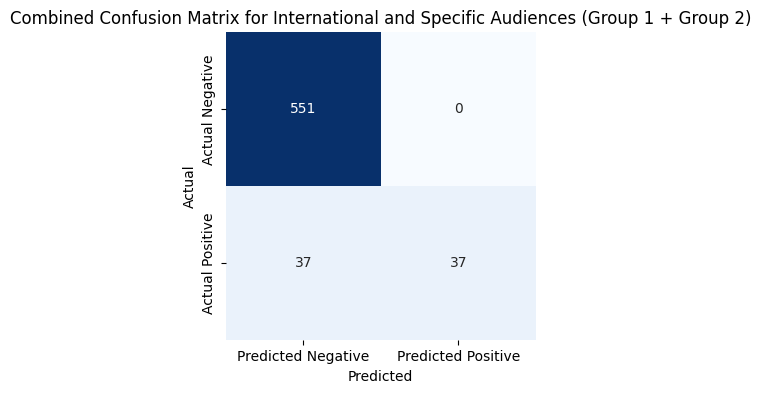


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 37, FP: 0, FN: 37, TN: 551


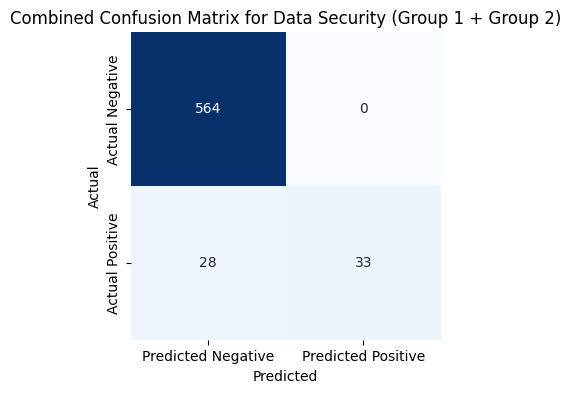


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 33, FP: 0, FN: 28, TN: 564


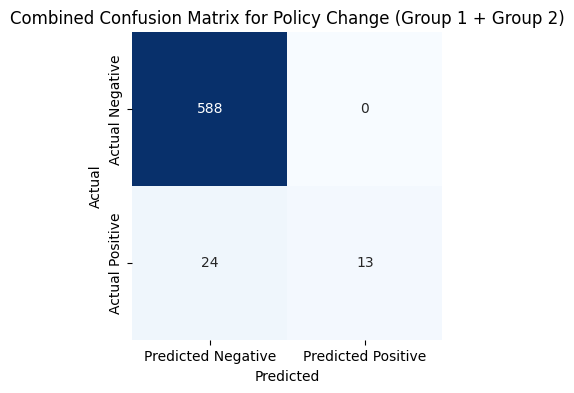


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 13, FP: 0, FN: 24, TN: 588


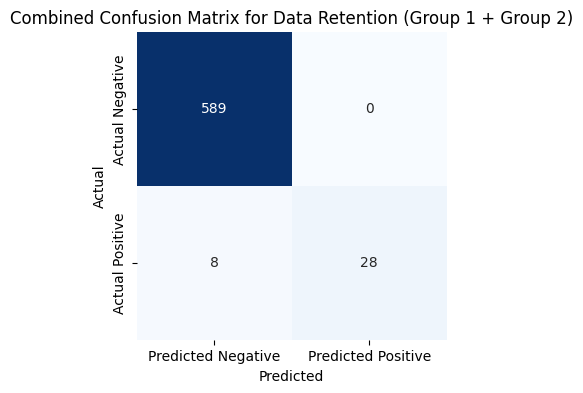


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 28, FP: 0, FN: 8, TN: 589


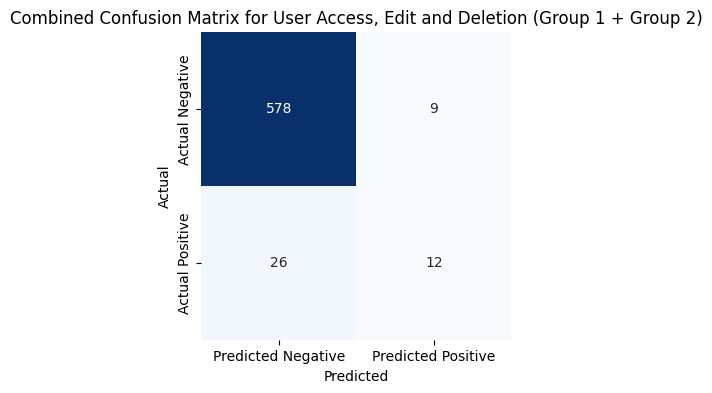


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 12, FP: 9, FN: 26, TN: 578
New tokens list: [688, 509, 498, 68, 68, 79, 83, 92, 66, 89, 83, 83, 90, 765, 38, 443, 355, 559, 567, 779, 808, 743, 679, 400, 85, 119, 535, 94, 1107, 411, 736, 703, 113, 64, 67, 140, 68, 409, 112, 1006, 178, 62, 482, 66, 1131, 80, 80, 69, 48, 54, 40, 75, 49, 365, 702, 569, 32, 150, 59, 657, 93, 72, 574, 111, 73, 84, 912, 107, 342, 787, 369, 47, 78, 52, 53, 93, 63, 59, 75, 51, 87, 134, 84, 69, 133, 94, 61, 91, 109, 73, 65, 66, 105, 75, 528, 423, 47, 1015, 639, 155, 77, 75, 77, 66, 58, 78, 74, 91, 88, 67, 86, 65, 278, 113, 60, 6, 69, 69, 77, 91, 70, 72, 70, 89, 64, 52, 67, 206, 74, 114, 119, 69, 74, 92, 56, 69, 72, 474, 359, 69, 62, 55, 71, 55, 72, 64, 416, 78, 1382, 69, 621, 650, 546, 629, 60, 60, 550, 862, 59, 110, 37, 104, 71, 69, 71, 161, 49, 81, 111, 105, 64, 71, 78, 714, 77, 72, 71, 42, 379, 574, 491, 165, 862, 77, 531, 49, 832, 1041, 109, 80, 73, 95, 1759, 75, 776, 76, 

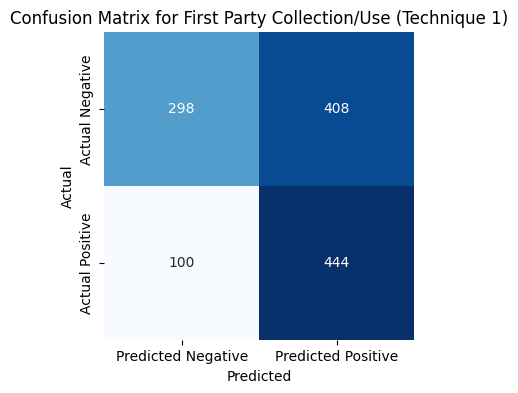


Plotting confusion matrix for category: Third Party Sharing/Collection


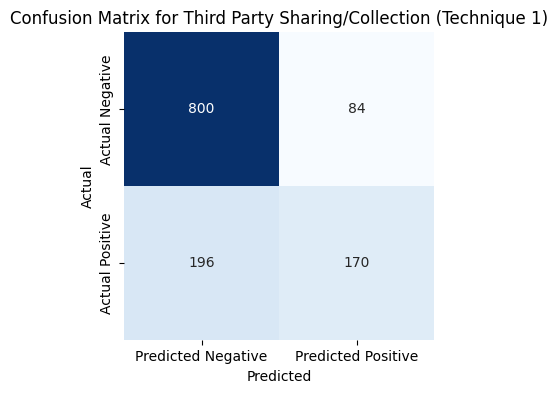


Plotting confusion matrix for category: Other


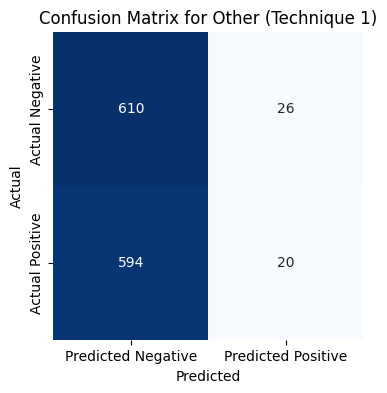


Plotting confusion matrix for category: User Choice/Control


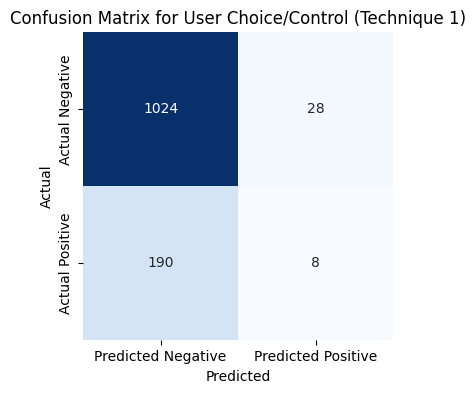


Plotting confusion matrix for category: Do Not Track


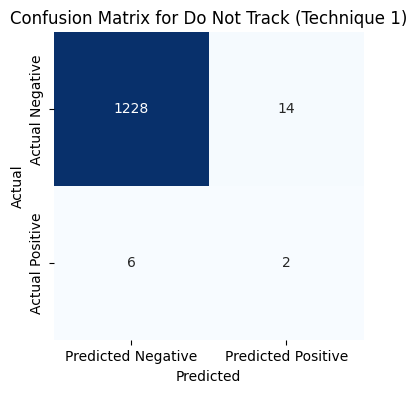


Plotting confusion matrix for category: International and Specific Audiences


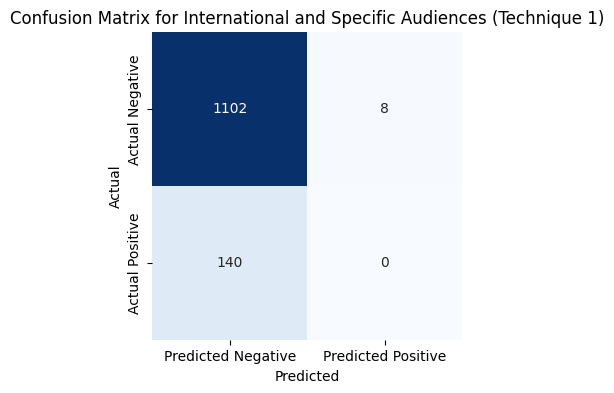


Plotting confusion matrix for category: Data Security


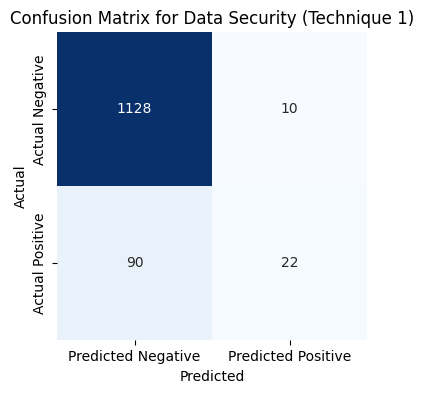


Plotting confusion matrix for category: Policy Change


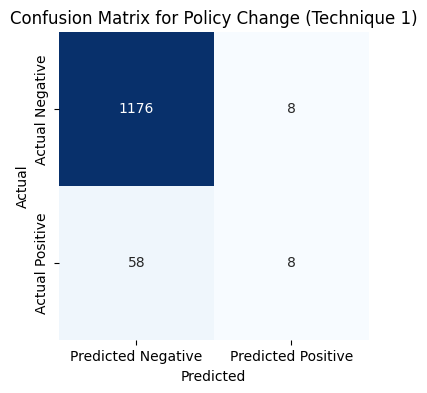


Plotting confusion matrix for category: Data Retention


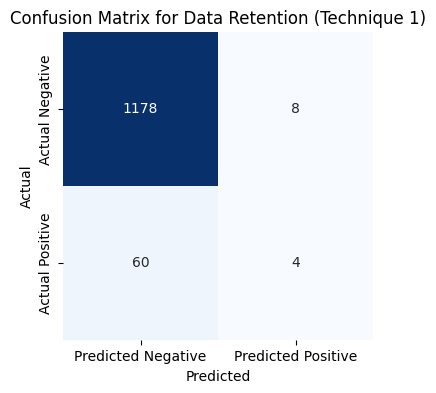


Plotting confusion matrix for category: User Access, Edit and Deletion


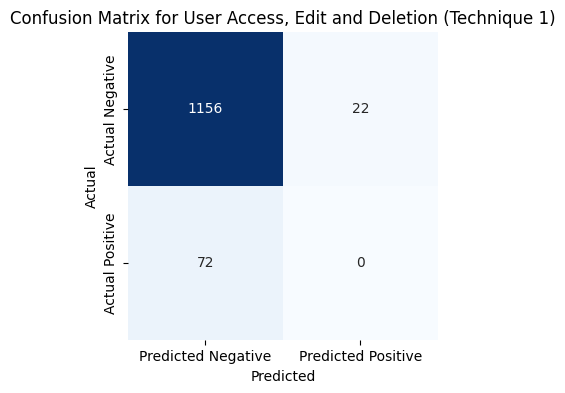


Overall tp: 678
Overall tn: 9700
Overall fp: 616
Overall fn: 1506
Overall Precision (Technique 1): 0.5239567233384853
Overall Recall (Technique 1): 0.31043956043956045
Overall F1 Score (Technique 1): 0.3898792409430707
Overall Accuracy (Technique 1): 0.83024
TP 444
TN 298
FP 408
FN 100

TP 170
TN 800
FP 84
FN 196

TP 20
TN 610
FP 26
FN 594

TP 8
TN 1024
FP 28
FN 190

TP 2
TN 1228
FP 14
FN 6

TP 0
TN 1102
FP 8
FN 140

TP 22
TN 1128
FP 10
FN 90

TP 8
TN 1176
FP 8
FN 58

TP 4
TN 1178
FP 8
FN 60

TP 0
TN 1156
FP 22
FN 72

Micro Precision: 0.5239567233384853
Micro Recall: 0.31043956043956045
Micro F1 Score: 0.3898792409430707
Micro Accuracy: 0.83024
Macro Precision: 0.3493256263397265
Macro Recall: 0.19837753678521883
Macro F1 Score: 0.2086079708955258
Weighted Precision: 0.44493747378214404
Weighted Recall: 0.31043956043956045
Weighted F1 Score: 0.29884195111008455
Sample Average Precision: 0.5338711111111112
Sample Average Recall: 0.3579377777777778
Sample Average F1 Score: 0.40293494949

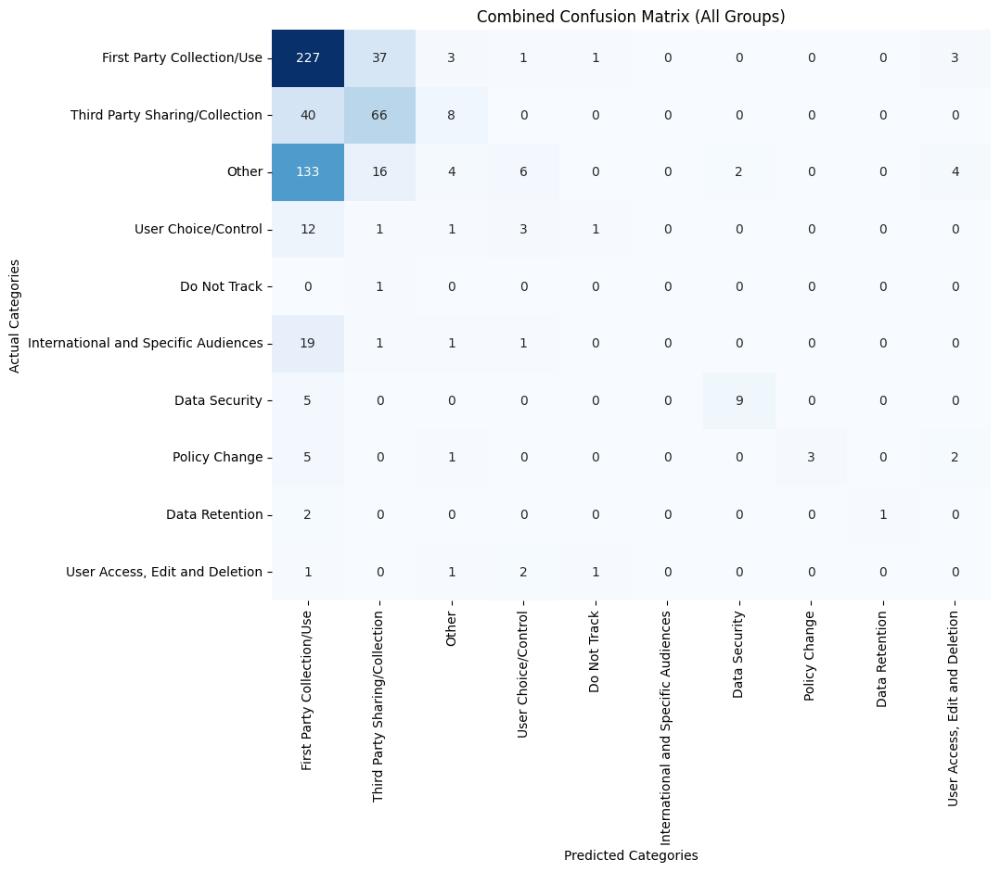


Metrics for Group 1:
Accuracy: 0.8938775510204081
Precision: 0.46938775510204084
Recall: 0.46938775510204084
F1 Score: 0.46938775510204084

Metrics for Group 2:
Accuracy: 0.8809667673716012
Precision: 0.8310911808669657
Recall: 0.6642771804062126
F1 Score: 0.7383798140770252

Confusion Matrices for Group 1:


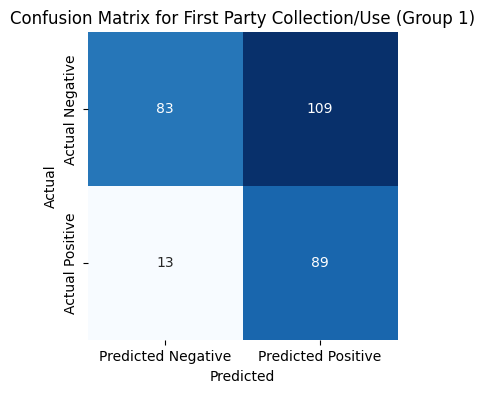

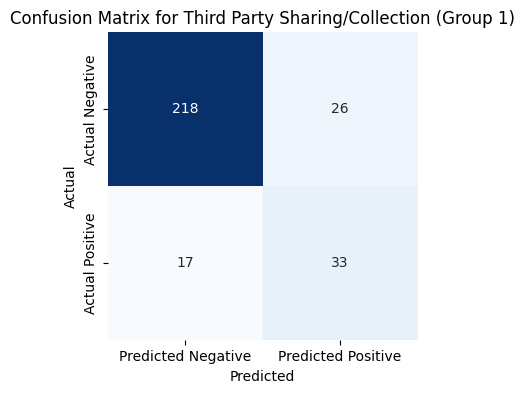

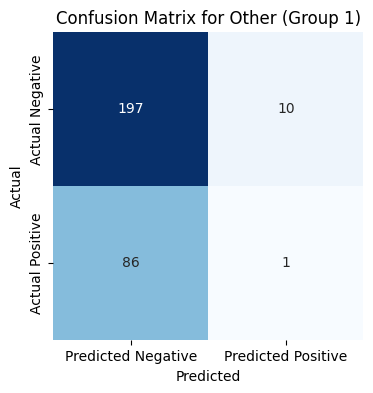

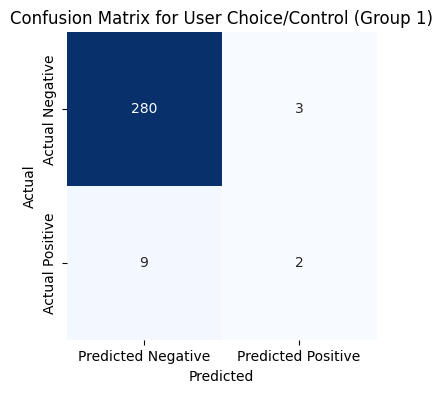

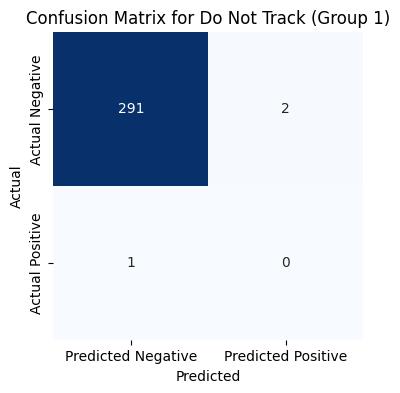

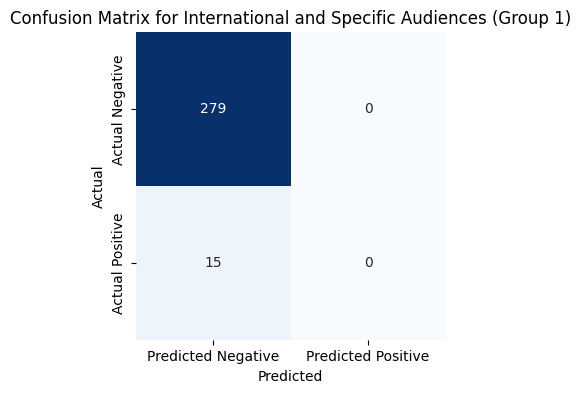

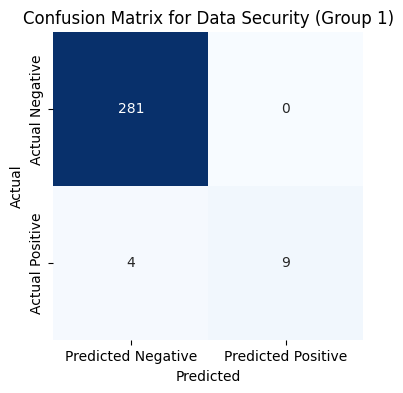

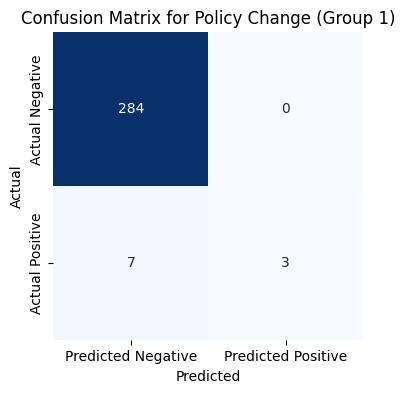

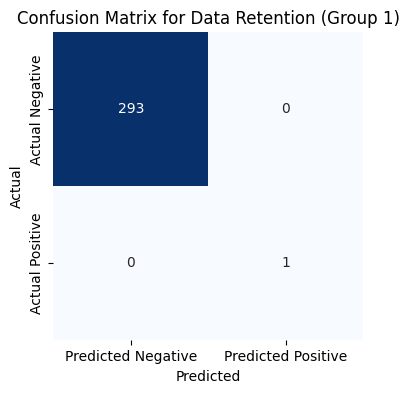

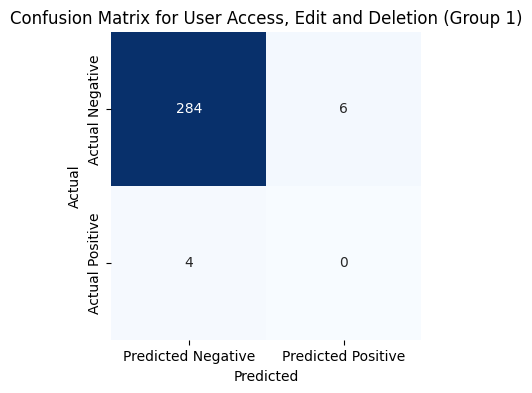


Confusion Matrices for Group 2:


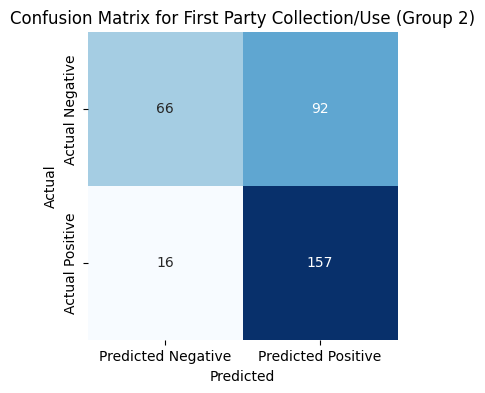

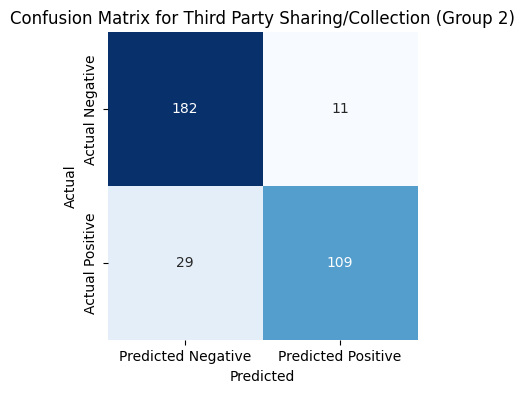

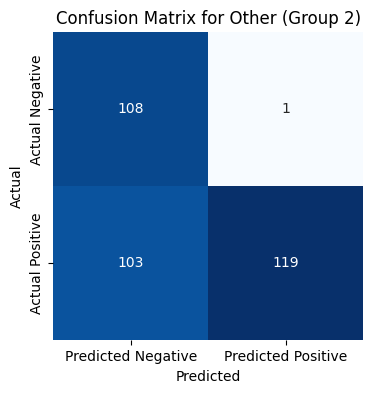

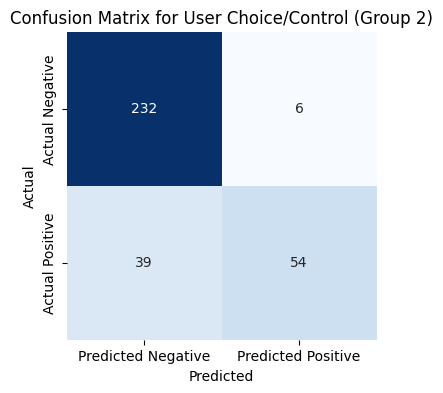

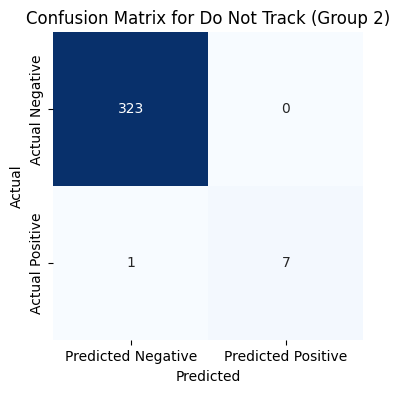

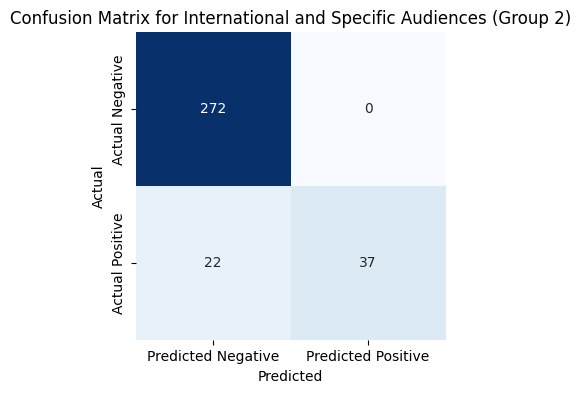

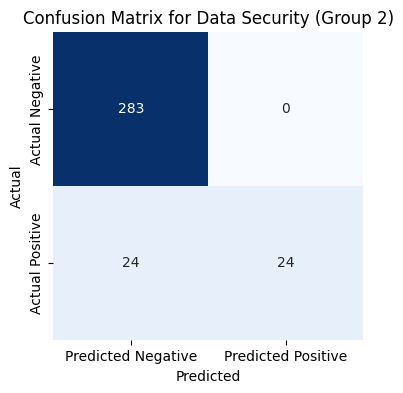

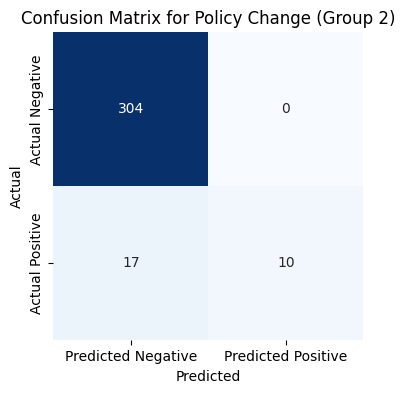

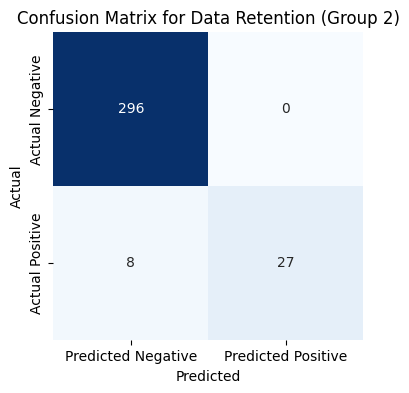

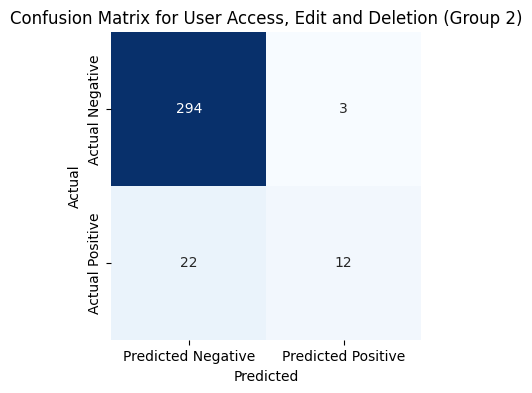


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.88704
Overall Precision: 0.7206645898234684
Overall Recall: 0.6136162687886826
Overall F1 Score: 0.6628462273161414
Combined Metrics -> Accuracy: 0.88704, Precision: 0.7206645898234684, Recall: 0.6136162687886826, F1: 0.6628462273161414

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


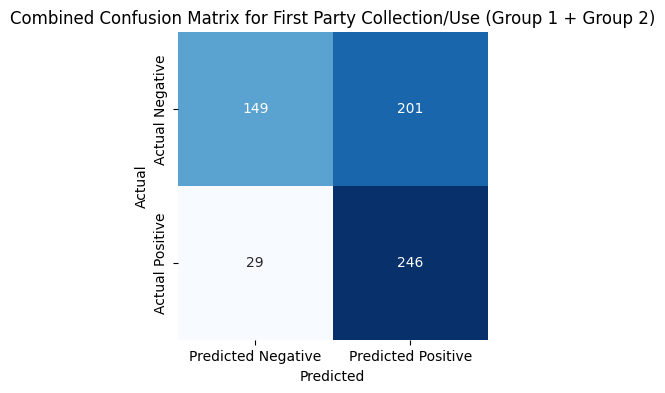


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 246, FP: 201, FN: 29, TN: 149


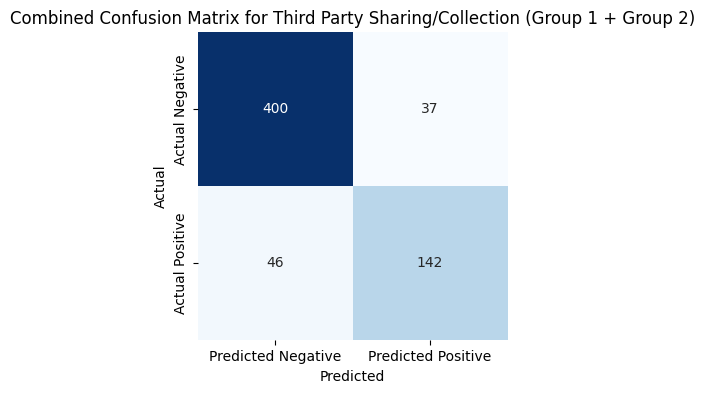


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 142, FP: 37, FN: 46, TN: 400


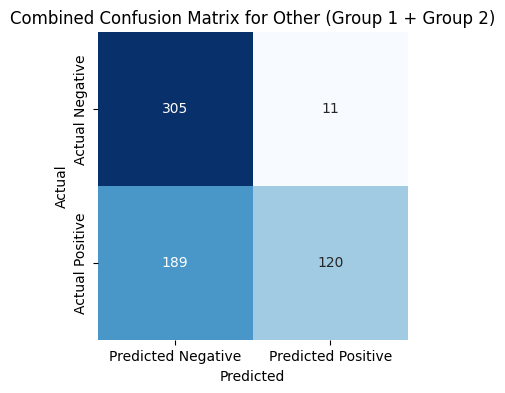


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 120, FP: 11, FN: 189, TN: 305


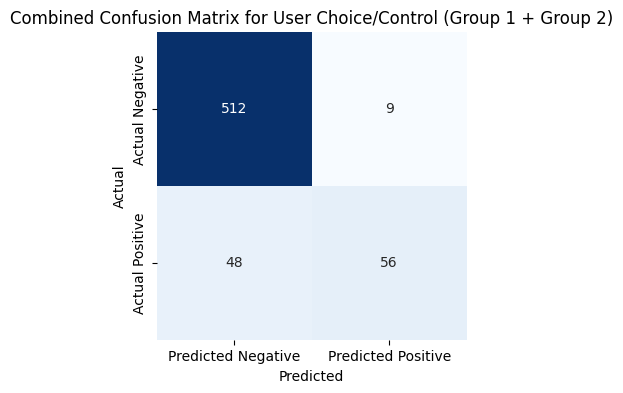


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 56, FP: 9, FN: 48, TN: 512


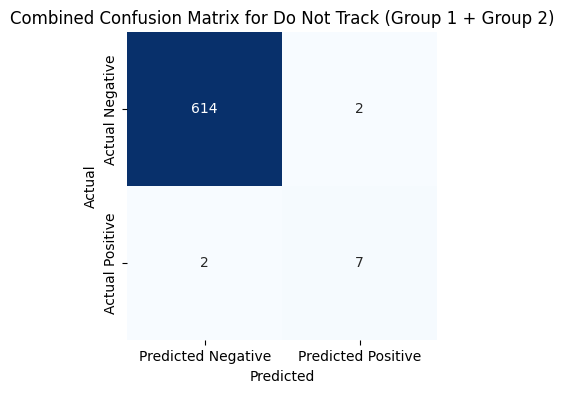


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 7, FP: 2, FN: 2, TN: 614


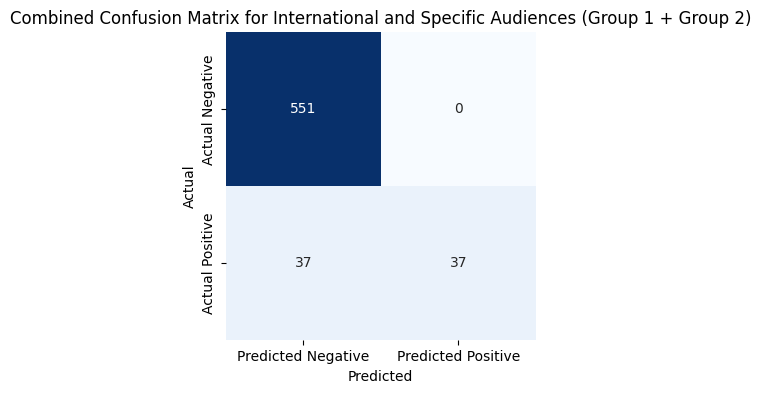


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 37, FP: 0, FN: 37, TN: 551


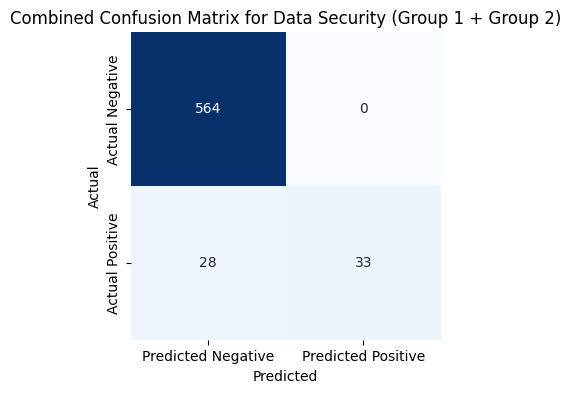


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 33, FP: 0, FN: 28, TN: 564


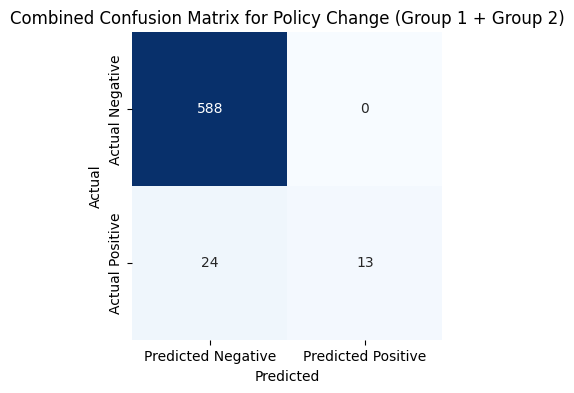


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 13, FP: 0, FN: 24, TN: 588


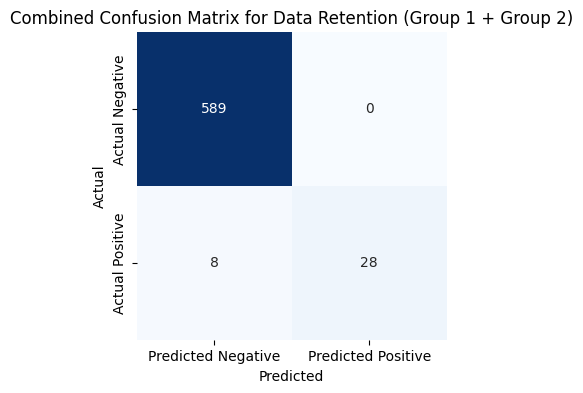


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 28, FP: 0, FN: 8, TN: 589


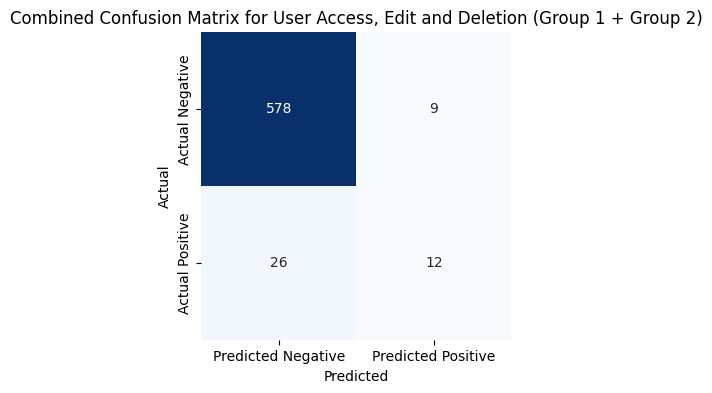


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 12, FP: 9, FN: 26, TN: 578


{'G1': {'accuracy': 0.8938775510204081,
  'precision': 0.46938775510204084,
  'recall': 0.46938775510204084,
  'f1': 0.46938775510204084,
  'category_results': {'First Party Collection/Use': {'TP': 89,
    'FP': 109,
    'TN': 83,
    'FN': 13},
   'Third Party Sharing/Collection': {'TP': 33, 'FP': 26, 'TN': 218, 'FN': 17},
   'Other': {'TP': 1, 'FP': 10, 'TN': 197, 'FN': 86},
   'User Choice/Control': {'TP': 2, 'FP': 3, 'TN': 280, 'FN': 9},
   'Do Not Track': {'TP': 0, 'FP': 2, 'TN': 291, 'FN': 1},
   'International and Specific Audiences': {'TP': 0,
    'FP': 0,
    'TN': 279,
    'FN': 15},
   'Data Security': {'TP': 9, 'FP': 0, 'TN': 281, 'FN': 4},
   'Policy Change': {'TP': 3, 'FP': 0, 'TN': 284, 'FN': 7},
   'Data Retention': {'TP': 1, 'FP': 0, 'TN': 293, 'FN': 0},
   'User Access, Edit and Deletion': {'TP': 0, 'FP': 6, 'TN': 284, 'FN': 4}}},
 'G2': {'accuracy': 0.8809667673716012,
  'precision': 0.8310911808669657,
  'recall': 0.6642771804062126,
  'f1': 0.7383798140770252,
  'c

In [9]:
#Prompt 4 - Non Fine tuned - Base Llama 2 Model 

from util.main import PrivacyPolicyClassifier
from util.generating_cm import compute_grouped_metrics,compute_confusion_matrix_technique1 

# Create an instance of PrivacyPolicyClassifier
classifier = PrivacyPolicyClassifier(hf_token= token)

# Define the prompt template
prompt_template_4 = ("As a privacy policy classification AI, your task is to classify sections of privacy policies into one or more categories based on the information provided."
                   "You are specialized in identifying the right category or multiple categories from complex privacy policy texts." 
                   "Ensure that your classifications are accurate, comprehensive, and consistent with the provided privacy policy excerpt."
                   "Based on the provided privacy policy text, please classify it into the following categories:"
                   "First Party Collection/Use, Third Party Sharing/Collection, Other, User Choice/Control, Do Not Track, International and Specific Audiences, Data Security, Policy Change, Data Retention, User Access, Edit and Deletion."
                   "Make sure to account for situations where multiple categories might apply.")


p4b11 = classifier.predict_and_evaluate(
    prompt_template=prompt_template_4, 
    test_data_path=test_data_path,
    num_test_data=num_entries,
    model_type=model_type,
    prompt_number=4
)

compute_confusion_matrix_technique1(p4b11)

# Compute grouped confusion matrices (Group 1 and Group 2)
compute_grouped_metrics(p4b11)